### Introduction

Not much here except very simple features that build on the fact we know the future...

In all time series competition where you're allowed to use future events the best features are time to next session for a given visitor.

This competition is no exception.

I left part of the features I already tested and don't seem to generalize... but what can we really trust here ?


In [2]:
import os
print(os.listdir("F:/kaggle"))

['.ipynb_checkpoints', 'feature_extract.py', 'fork-of-eda-on-basic-data-and-lgb-in-progress.ipynb', 'GoogleAnalytics_week_3.ipynb', 'latest_update', 'latest_update.zip', 'test_v2.csv', 'test_v2.csv.zip', 'train-1.csv', 'train_v2.csv', 'train_v2.csv.zip']


In [3]:
# import sys,platform
# platform.architecture()

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error
import gc
import time
from pandas.core.common import SettingWithCopyWarning
import warnings
import lightgbm as lgb
from sklearn.model_selection import GroupKFold
from pandas.io.json import json_normalize
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import TimeSeriesSplit, KFold
from sklearn.metrics import mean_squared_error
# I don't like SettingWithCopyWarnings ...
warnings.simplefilter('error', SettingWithCopyWarning)
gc.enable()
%matplotlib inline

In [5]:
import json

### Get the extracted data

In [6]:
def load_df(csv_path, nrows=None):
    USE_COLUMNS = [
        'channelGrouping', 'date', 'device', 'fullVisitorId', 'geoNetwork',
        'socialEngagementType', 'totals', 'trafficSource', 'visitId',
        'visitNumber', 'visitStartTime', 'customDimensions'
        #,'hits'
    ]
    JSON_COLUMNS = ['device','geoNetwork', 'totals', 'trafficSource']
    
    df = pd.read_csv(csv_path, 
                     converters={column:json.loads for column in JSON_COLUMNS}, 
                     dtype={'date': str, 'fullVisitorId': str, 'sessionId':str}, # Important!!
                     nrows=nrows, usecols=USE_COLUMNS)
    
    for column in JSON_COLUMNS:
        column_as_df = json_normalize(df[column])
        column_as_df.columns = [f"{column}.{subcolumn}" for subcolumn in column_as_df.columns]
        df = df.drop(column, axis=1).merge(column_as_df, right_index=True, left_index=True)
    print(f"Loaded {os.path.basename(csv_path)}. Shape: {df.shape}")
    return df

In [11]:
%%time
train = load_df("F:/kaggle/train_v2.csv")

Loaded train_v2.csv. Shape: (1708337, 59)
Wall time: 3min 51s


In [12]:
%%time
test = load_df("F:/kaggle/test_v2.csv")

Loaded test_v2.csv. Shape: (401589, 58)
Wall time: 1min 1s


In [13]:
to_drop=['trafficSource.campaignCode','totals.totalTransactionRevenue']

In [14]:
cols_to_drop = [col for col in train.columns if train[col].nunique(dropna=False) == 1]
train.drop(cols_to_drop, axis=1, inplace=True)
test.drop([col for col in cols_to_drop if col in test.columns], axis=1, inplace=True)

In [15]:
train.drop(to_drop, axis=1, inplace=True)
test.drop(['totals.totalTransactionRevenue'], axis=1, inplace=True)

In [23]:
# train.to_csv('F:/train_1.csv',index=False)

# test_hits = pd.read_csv("F:/kaggle/test_v2.csv", usecols=['hits'])

In [ ]:
%%time
train_hits = pd.read_csv("F:/kaggle/train_v2.csv", usecols=['hits'])

In [28]:
test_hits=test_hits.reset_index()

In [16]:
train=train.reset_index()
test=test.reset_index()

In [17]:
# train = pd.read_csv('../input/extracted_fields_train_v2.csv', 
#                     dtype={'date': str, 'fullVisitorId': str, 'sessionId':str})
# test = pd.read_csv('../input/extracted_fields_test_v2.csv', 
#                    dtype={'date': str, 'fullVisitorId': str, 'sessionId':str})
train.shape, test.shape

((1708337, 39), (401589, 39))

In [18]:
train.head()

,index,channelGrouping,customDimensions,date,fullVisitorId,visitId,visitNumber,visitStartTime,device.browser,device.deviceCategory,...,trafficSource.adwordsClickInfo.gclId,trafficSource.adwordsClickInfo.isVideoAd,trafficSource.adwordsClickInfo.page,trafficSource.adwordsClickInfo.slot,trafficSource.campaign,trafficSource.isTrueDirect,trafficSource.keyword,trafficSource.medium,trafficSource.referralPath,trafficSource.source
0,0,Organic Search,"[{'index': '4', 'value': 'EMEA'}]",20171016,3162355547410993243,1508198450,1,1508198450,Firefox,desktop,...,NaN,NaN,NaN,NaN,(not set),NaN,water bottle,organic,NaN,google
1,1,Referral,"[{'index': '4', 'value': 'North America'}]",20171016,8934116514970143966,1508176307,6,1508176307,Chrome,desktop,...,NaN,NaN,NaN,NaN,(not set),NaN,NaN,referral,/a/google.com/transportation/mtv-services/bike...,sites.google.com
2,2,Direct,"[{'index': '4', 'value': 'North America'}]",20171016,7992466427990357681,1508201613,1,1508201613,Chrome,mobile,...,NaN,NaN,NaN,NaN,(not set),True,NaN,(none),NaN,(direct)
3,3,Organic Search,"[{'index': '4', 'value': 'EMEA'}]",20171016,9075655783635761930,1508169851,1,1508169851,Chrome,desktop,...,NaN,NaN,NaN,NaN,(not set),NaN,(not provided),organic,NaN,google
4,4,Organic Search,"[{'index': '4', 'value': 'Central America'}]",20171016,6960673291025684308,1508190552,1,1508190552,Chrome,desktop,...,NaN,NaN,NaN,NaN,(not set),NaN,(not provided),organic,NaN,google


### Define folding strategy

In [4]:
def get_folds(df=None, n_splits=5):
    """Returns dataframe indices corresponding to Visitors Group KFold"""
    # Get sorted unique visitors
    unique_vis = np.array(sorted(df['fullVisitorId'].unique()))

    # Get folds
    folds = GroupKFold(n_splits=n_splits)
    fold_ids = []
    ids = np.arange(df.shape[0])
    for trn_vis, val_vis in folds.split(X=unique_vis, y=unique_vis, groups=unique_vis):
        fold_ids.append(
            [
                ids[df['fullVisitorId'].isin(unique_vis[trn_vis])],
                ids[df['fullVisitorId'].isin(unique_vis[val_vis])]
            ]
        )

    return fold_ids

### Get session target

In [19]:
y_reg = train['totals.transactionRevenue'].fillna(0)

# if 'totals.transactionRevenue' in test.columns:
#     del test['totals.transactionRevenue']

### Add date features

Only add the one I think can ganeralize

In [20]:
train.columns

Index(['index', 'channelGrouping', 'customDimensions', 'date', 'fullVisitorId',
       'visitId', 'visitNumber', 'visitStartTime', 'device.browser',
       'device.deviceCategory', 'device.isMobile', 'device.operatingSystem',
       'geoNetwork.city', 'geoNetwork.continent', 'geoNetwork.country',
       'geoNetwork.metro', 'geoNetwork.networkDomain', 'geoNetwork.region',
       'geoNetwork.subContinent', 'totals.bounces', 'totals.hits',
       'totals.newVisits', 'totals.pageviews', 'totals.sessionQualityDim',
       'totals.timeOnSite', 'totals.transactionRevenue', 'totals.transactions',
       'trafficSource.adContent',
       'trafficSource.adwordsClickInfo.adNetworkType',
       'trafficSource.adwordsClickInfo.gclId',
       'trafficSource.adwordsClickInfo.isVideoAd',
       'trafficSource.adwordsClickInfo.page',
       'trafficSource.adwordsClickInfo.slot', 'trafficSource.campaign',
       'trafficSource.isTrueDirect', 'trafficSource.keyword',
       'trafficSource.medium', 'traff

In [ ]:
for f in train.columns:
        if f not in ['date', 'fullVisitorId', 'sessionId','visitId']:
            try:
                train[f] = train[f].astype(np.float64)
                test[f] = test[f].astype(np.float64)
                print("0")
            except (ValueError, TypeError):
                print("1")
                pass
            except Exception:
                print("2")
                raise           

In [ ]:
feature_to_drop=[]
for f in train.columns:
        print(f)
        if f not in ['date', 'fullVisitorId', 'sessionId', 'totals.transactionRevenue']:
            if train[f].dtype == 'object':
                try:
                    trn, _ = pd.factorize(train[f])
                    tst, _ = pd.factorize(test[f])
                    print("factor")
                    if (np.std(trn) == 0) | (np.std(tst) == 0):
                        feature_to_drop.append(f)
                        print('append')
                except (TypeError,KeyError):
                    feature_to_drop.append(f)
                    print('1')
                    pass
            else:
                if (np.std(train[f].fillna(0).values) == 0) | (np.std(test[f].fillna(0).values) == 0):
                    feature_to_drop.append(f)
                    print('2')

In [23]:
def try_encode(x):
    """Used to remove any encoding issues within the data"""
    try:
        return x.encode('utf-8', 'surrogateescape').decode('utf-8')
    except AttributeError:
        return np.nan
    except UnicodeEncodeError:
        return np.nan

In [24]:
for f in train.columns:
        if train[f].dtype == 'object':
            train[f] = train[f].apply(lambda x: try_encode(x))
            test[f] = test[f].apply(lambda x: try_encode(x))

In [85]:
test.head()

,index,channelGrouping,customDimensions,date,fullVisitorId,visitId,visitNumber,visitStartTime,device.browser,device.deviceCategory,...,geoNetwork.region_device.deviceCategory,geoNetwork.region_device.operatingSystem,geoNetwork.region_trafficSource.source,geoNetwork.subContinent_device.browser,geoNetwork.subContinent_device.deviceCategory,geoNetwork.subContinent_device.operatingSystem,geoNetwork.subContinent_trafficSource.source,content.source,medium.source,page_to_transaction
264441,264441.0,Organic Search,"[{'index': '4', 'value': 'North America'}]",2018-08-14 03:17:14,0000018966949534117,1534216634,1.0,1.534217e+09,chrome,desktop,...,California_desktop,California_Macintosh,California_google,Northern America_chrome,Northern America_desktop,Northern America_Macintosh,Northern America_google,(not set)_google_United States,organic_google_United States,NaN
187425,187425.0,Direct,"[{'index': '4', 'value': 'North America'}]",2018-06-14 01:16:14,0000039738481224681,1528938974,1.0,1.528939e+09,chrome,mobile,...,not available in demo dataset_mobile,not available in demo dataset_Android,not available in demo dataset_direct,Northern America_chrome,Northern America_mobile,Northern America_Android,Northern America_direct,(not set)_direct_United States,(none)_direct_United States,NaN
91862,91862.0,Organic Search,"[{'index': '4', 'value': 'North America'}]",2018-06-04 05:04:11,0000073585230191399,1528088651,1.0,1.528089e+09,safari,mobile,...,not available in demo dataset_mobile,not available in demo dataset_iOS,not available in demo dataset_google,Northern America_safari,Northern America_mobile,Northern America_iOS,Northern America_google,(not set)_google_United States,organic_google_United States,NaN
23103,23103.0,Organic Search,"[{'index': '4', 'value': 'APAC'}]",2018-06-06 07:24:10,0000087588448856385,1528269850,1.0,1.528270e+09,chrome,desktop,...,not available in demo dataset_desktop,not available in demo dataset_Windows,not available in demo dataset_google,Eastern Asia_chrome,Eastern Asia_desktop,Eastern Asia_Windows,Eastern Asia_google,(not set)_google_Taiwan,organic_google_Taiwan,NaN
303019,303019.0,Organic Search,[],2018-05-21 16:31:14,0000149787903119437,1526920274,1.0,1.526920e+09,chrome,mobile,...,not available in demo dataset_mobile,not available in demo dataset_Android,not available in demo dataset_google,Southern Europe_chrome,Southern Europe_mobile,Southern Europe_Android,Southern Europe_google,(not set)_google_Serbia,organic_google_Serbia,NaN


In [ ]:
train = pd.concat([train, test])

In [86]:

for df in [train, test]:
    df['date'] = pd.to_datetime(df['visitStartTime'], unit='s')
    df['sess_date_dow'] = df['date'].dt.dayofweek
    df['sess_date_hours'] = df['date'].dt.hour
    df['sess_date_dom'] = df['date'].dt.day
    df.sort_values(['fullVisitorId', 'date'], ascending=True, inplace=True)
    df['next_session_1'] = (
        df['date'] - df[['fullVisitorId', 'date']].groupby('fullVisitorId')['date'].shift(1)
    ).astype(np.int64) // 1e9 // 60 // 60
    df['next_session_2'] = (
        df['date'] - df[['fullVisitorId', 'date']].groupby('fullVisitorId')['date'].shift(-1)
    ).astype(np.int64) // 1e9 // 60 // 60


In [290]:
train.head()

,index,channelGrouping,customDimensions,date,fullVisitorId,visitId,visitNumber,visitStartTime,device.browser,device.deviceCategory,...,geoNetwork.region_device.deviceCategory,geoNetwork.region_device.operatingSystem,geoNetwork.region_trafficSource.source,geoNetwork.subContinent_device.browser,geoNetwork.subContinent_device.deviceCategory,geoNetwork.subContinent_device.operatingSystem,geoNetwork.subContinent_trafficSource.source,content.source,medium.source,page_to_transaction
683687,683687.0,Organic Search,"[{'index': '4', 'value': 'North America'}]",2017-11-28 23:33:21,0000000259678714014,1511912001,1.0,1.511912e+09,chrome,desktop,...,California_desktop,California_Macintosh,California_google,Northern America_chrome,Northern America_desktop,Northern America_Macintosh,Northern America_google,nan_google_United States,organic_google_United States,NaN
680923,680923.0,Organic Search,"[{'index': '4', 'value': 'North America'}]",2017-11-29 00:19:40,0000000259678714014,1511914780,2.0,1.511915e+09,chrome,desktop,...,California_desktop,California_Macintosh,California_google,Northern America_chrome,Northern America_desktop,Northern America_Macintosh,Northern America_google,nan_google_United States,organic_google_United States,NaN
379656,379656.0,Organic Search,[],2016-10-21 05:57:46,0000010278554503158,1477029466,1.0,1.477029e+09,chrome,desktop,...,not available in demo dataset_desktop,not available in demo dataset_Macintosh,not available in demo dataset_google,Australasia_chrome,Australasia_desktop,Australasia_Macintosh,Australasia_google,nan_google_New Zealand,organic_google_New Zealand,NaN
264441,264441.0,Organic Search,"[{'index': '4', 'value': 'North America'}]",2018-08-14 03:17:14,0000018966949534117,1534216634,1.0,1.534217e+09,chrome,desktop,...,California_desktop,California_Macintosh,California_google,Northern America_chrome,Northern America_desktop,Northern America_Macintosh,Northern America_google,(not set)_google_United States,organic_google_United States,NaN
168926,168926.0,Organic Search,[],2016-12-01 07:55:01,0000020424342248747,1480578901,1.0,1.480579e+09,chrome,desktop,...,Lima Region_desktop,Lima Region_Windows,Lima Region_direct,South America_chrome,South America_desktop,South America_Windows,South America_direct,nan_direct_Peru,(none)_direct_Peru,NaN


In [305]:
train['date'].iloc[0,]-p.iloc[0,]

date   2017-11-29 00:19:40
Name: 683687, dtype: datetime64[ns]

In [306]:
p.iloc[1,]

date   NaT
Name: 680923, dtype: timedelta64[ns]

In [296]:
p=train[['date']] - train[['fullVisitorId', 'date']].groupby('fullVisitorId')[['date']].shift(-1)

In [249]:
train.iloc[10:20]

,index,channelGrouping,customDimensions,date,fullVisitorId,visitId,visitNumber,visitStartTime,device.browser,device.deviceCategory,...,geoNetwork.region_device.deviceCategory,geoNetwork.region_device.operatingSystem,geoNetwork.region_trafficSource.source,geoNetwork.subContinent_device.browser,geoNetwork.subContinent_device.deviceCategory,geoNetwork.subContinent_device.operatingSystem,geoNetwork.subContinent_trafficSource.source,content.source,medium.source,page_to_transaction
673988,673988.0,Direct,"[{'index': '4', 'value': 'APAC'}]",2017-09-19 00:03:34,0000049363351866189,1505779414,1.0,1.505779e+09,chrome,desktop,...,Haryana_desktop,Haryana_Chrome OS,Haryana_direct,Southern Asia_chrome,Southern Asia_desktop,Southern Asia_Chrome OS,Southern Asia_direct,nan_direct_India,(none)_direct_India,NaN
674984,674984.0,Direct,"[{'index': '4', 'value': 'APAC'}]",2017-09-19 04:47:06,0000049363351866189,1505796426,2.0,1.505796e+09,chrome,desktop,...,Haryana_desktop,Haryana_Chrome OS,Haryana_direct,Southern Asia_chrome,Southern Asia_desktop,Southern Asia_Chrome OS,Southern Asia_direct,nan_direct_India,(none)_direct_India,NaN
1361332,1361332.0,Direct,"[{'index': '4', 'value': 'APAC'}]",2017-09-19 23:31:14,0000049363351866189,1505863874,3.0,1.505864e+09,chrome,desktop,...,not available in demo dataset_desktop,not available in demo dataset_Chrome OS,not available in demo dataset_direct,Southern Asia_chrome,Southern Asia_desktop,Southern Asia_Chrome OS,Southern Asia_direct,nan_direct_India,(none)_direct_India,NaN
360482,360482.0,Organic Search,"[{'index': '4', 'value': 'North America'}]",2016-08-21 22:06:48,000005103959234087,1471817208,1.0,1.471817e+09,chrome,mobile,...,not available in demo dataset_mobile,not available in demo dataset_Android,not available in demo dataset_google,Northern America_chrome,Northern America_mobile,Northern America_Android,Northern America_google,nan_google_United States,organic_google_United States,NaN
659293,659293.0,Affiliates,"[{'index': '4', 'value': 'South America'}]",2018-01-28 22:32:22,0000053049821714864,1517178742,1.0,1.517179e+09,mobile browser,mobile,...,not available in demo dataset_mobile,not available in demo dataset_iOS,not available in demo dataset_partners,South America_mobile browser,South America_mobile,South America_iOS,South America_partners,nan_partners_Argentina,affiliate_partners_Argentina,NaN
76445,76445.0,Direct,"[{'index': '4', 'value': 'North America'}]",2018-02-21 08:06:17,0000059488412965267,1519200377,1.0,1.519200e+09,chrome,mobile,...,Illinois_mobile,Illinois_Android,Illinois_direct,Northern America_chrome,Northern America_mobile,Northern America_Android,Northern America_direct,nan_direct_United States,(none)_direct_United States,NaN
575355,575355.0,Direct,"[{'index': '4', 'value': 'North America'}]",2018-02-27 23:08:13,0000059488412965267,1519772893,2.0,1.519773e+09,chrome,mobile,...,Illinois_mobile,Illinois_Android,Illinois_direct,Northern America_chrome,Northern America_mobile,Northern America_Android,Northern America_direct,nan_direct_United States,(none)_direct_United States,NaN
575259,575259.0,Direct,"[{'index': '4', 'value': 'North America'}]",2018-02-28 03:14:59,0000059488412965267,1519787699,3.0,1.519788e+09,chrome,mobile,...,Illinois_mobile,Illinois_Android,Illinois_direct,Northern America_chrome,Northern America_mobile,Northern America_Android,Northern America_direct,nan_direct_United States,(none)_direct_United States,NaN
1704385,1704385.0,Affiliates,"[{'index': '4', 'value': 'South America'}]",2017-07-10 00:19:20,0000062267706107999,1499645960,1.0,1.499646e+09,chrome,desktop,...,not available in demo dataset_desktop,not available in demo dataset_Windows,not available in demo dataset_partners,South America_chrome,South America_desktop,South America_Windows,South America_partners,nan_partners_Brazil,affiliate_partners_Brazil,NaN
670951,670951.0,Organic Search,"[{'index': '4', 'value': 'North America'}]",2017-04-04 04:54:09,0000068403966359845,1491281649,1.0,1.491282e+09,s

In [58]:
train[10:20]

,index,channelGrouping,customDimensions,date,fullVisitorId,visitId,visitNumber,visitStartTime,device.browser,device.deviceCategory,...,trafficSource.source,sess_date_dow,sess_date_hours,sess_date_dom,next_session_1,next_session_2,next_session_hits1,next_session_hits2,next_session_page1,next_session_page2
1361332,1361332.0,Direct,"[{'index': '4', 'value': 'APAC'}]",2017-09-19 23:31:14,0000049363351866189,1505863874,3.0,1.505864e+09,Chrome,desktop,...,(direct),1,23,19,18,-2562048,0.0,NaN,0.0,NaN
360482,360482.0,Organic Search,"[{'index': '4', 'value': 'North America'}]",2016-08-21 22:06:48,000005103959234087,1471817208,1.0,1.471817e+09,Chrome,mobile,...,google,6,22,21,-2562048,-2562048,NaN,NaN,NaN,NaN
659293,659293.0,Affiliates,"[{'index': '4', 'value': 'South America'}]",2018-01-28 22:32:22,0000053049821714864,1517178742,1.0,1.517179e+09,Safari (in-app),mobile,...,Partners,6,22,28,-2562048,-2562048,NaN,NaN,NaN,NaN
76445,76445.0,Direct,"[{'index': '4', 'value': 'North America'}]",2018-02-21 08:06:17,0000059488412965267,1519200377,1.0,1.519200e+09,Chrome,mobile,...,(direct),2,8,21,-2562048,-160,NaN,0.0,NaN,0.0
575355,575355.0,Direct,"[{'index': '4', 'value': 'North America'}]",2018-02-27 23:08:13,0000059488412965267,1519772893,2.0,1.519773e+09,Chrome,mobile,...,(direct),1,23,27,159,-5,0.0,0.0,0.0,0.0
575259,575259.0,Direct,"[{'index': '4', 'value': 'North America'}]",2018-02-28 03:14:59,0000059488412965267,1519787699,3.0,1.519788e+09,Chrome,mobile,...,(direct),2,3,28,4,-2562048,0.0,NaN,0.0,NaN
1704385,1704385.0,Affiliates,"[{'index': '4', 'value': 'South America'}]",2017-07-10 00:19:20,0000062267706107999,1499645960,1.0,1.499646e+09,Chrome,desktop,...,Partners,0,0,10,-2562048,-2562048,NaN,NaN,NaN,NaN
670951,670951.0,Organic Search,"[{'index': '4', 'value': 'North America'}]",2017-04-04 04:54:09,0000068403966359845,1491281649,1.0,1.491282e+09,Safari,tablet,...,google,1,4,4,-2562048,-2562048,NaN,NaN,NaN,NaN
1300047,1300047.0,Direct,"[{'index': '4', 'value': 'North America'}]",2017-07-19 22:58:25,0000085059828173212,1500505105,1.0,1.500505e+09,Safari,mobile,...,(direct),2,22,19,-2562048,-2562048,NaN,NaN,NaN,NaN
544960,544960.0,Organic Search,"[{'index': '4', 'value': 'North America'}]",2017-09-09 00:59:46,0000085840370633780,1504918786,1.0,1.504919e+09,Safari,desktop,...,google,5,0,9,-2562048,-2562048,NaN,NaN,NaN,NaN


In [90]:
for df in [train, test]:
    
    df['next_session_hits1'] = df['totals.hits'] - df[['fullVisitorId', 'totals.hits']].groupby('fullVisitorId')['totals.hits'].shift(1)
         
    df['next_session_hits2'] = df['totals.hits'] - df[['fullVisitorId','totals.hits']].groupby('fullVisitorId')['totals.hits'].shift(-1)
       

In [91]:
for df in [train, test]:
    
    df['next_session_page1'] = df['totals.pageviews'] - df[['fullVisitorId', 'totals.pageviews']].groupby('fullVisitorId')['totals.pageviews'].shift(1)
         
    df['next_session_page2'] = df['totals.pageviews'] - df[['fullVisitorId','totals.pageviews']].groupby('fullVisitorId')['totals.pageviews'].shift(-1)
       

In [92]:
## many totals.transactions = NaN (0)

for df in [train, test]:
    df['page_to_transaction'] = df['totals.transactions']/df['totals.pageviews']       

### df_  / df_t 要和train 和 test 数据并起来 两个变量

In [93]:
for df in [train]:
    df_=df[df['totals.transactionRevenue']>0][['fullVisitorId', 'date']]
    df_.sort_values(['fullVisitorId', 'date'], ascending=True, inplace=True)
    df_['next_session_pay1']=(df_['date']-df_[['fullVisitorId', 'date']].groupby('fullVisitorId')['date'].shift(1)).astype(np.int64) // 1e9 // 60 // 60
    df_['next_session_pay2']=(df_['date']-df_[['fullVisitorId', 'date']].groupby('fullVisitorId')['date'].shift(-1)).astype(np.int64) // 1e9 // 60 // 60

In [128]:
for df in [test]:
    df_t=df[df['totals.transactionRevenue']>0][['fullVisitorId', 'date']]
    df_t.sort_values(['fullVisitorId', 'date'], ascending=True, inplace=True)
    df_t['next_session_pay1']=(df_t['date']-df_t[['fullVisitorId', 'date']].groupby('fullVisitorId')['date'].shift(1)).astype(np.int64) // 1e9 // 60 // 60
    df_t['next_session_pay2']=(df_t['date']-df_t[['fullVisitorId', 'date']].groupby('fullVisitorId')['date'].shift(-1)).astype(np.int64) // 1e9 // 60 // 60

In [68]:
# https://www.kaggle.com/prashantkikani/teach-lightgbm-to-sum-predictions-fe
def browser_mapping(x):
    browsers = ['chrome','safari','firefox','internet explorer','edge','opera','coc coc','maxthon','iron']
    if x in browsers:
        return x.lower()
    elif  ('android' in x) or ('samsung' in x) or ('mini' in x) or ('iphone' in x) or ('in-app' in x) or ('playstation' in x):
        return 'mobile browser'
    elif  ('mozilla' in x) or ('chrome' in x) or ('blackberry' in x) or ('nokia' in x) or ('browser' in x) or ('amazon' in x):
        return 'mobile browser'
    elif  ('lunascape' in x) or ('netscape' in x) or ('blackberry' in x) or ('konqueror' in x) or ('puffin' in x) or ('amazon' in x):
        return 'mobile browser'
    elif '(not set)' in x:
        return x
    else:
        return 'others'
    
    
def adcontents_mapping(x):
    if  ('google' in x):
        return 'google'
    elif  ('placement' in x) | ('placememnt' in x):
        return 'placement'
    elif '(not set)' in x or 'nan' in x:
        return x
    elif 'ad' in x:
        return 'ad'
    else:
        return 'others'
    
def source_mapping(x):
    if  ('google' in x):
        return 'google'
    elif  ('youtube' in x):
        return 'youtube'
    elif '(not set)' in x or 'nan' in x:
        return x
    elif 'yahoo' in x:
        return 'yahoo'
    elif 'facebook' in x:
        return 'facebook'
    elif 'reddit' in x:
        return 'reddit'
    elif 'bing' in x:
        return 'bing'
    elif 'quora' in x:
        return 'quora'
    elif 'outlook' in x:
        return 'outlook'
    elif 'linkedin' in x:
        return 'linkedin'
    elif 'pinterest' in x:
        return 'pinterest'
    elif 'ask' in x:
        return 'ask'
    elif 'siliconvalley' in x:
        return 'siliconvalley'
    elif 'lunametrics' in x:
        return 'lunametrics'
    elif 'amazon' in x:
        return 'amazon'
    elif 'mysearch' in x:
        return 'mysearch'
    elif 'qiita' in x:
        return 'qiita'
    elif 'messenger' in x:
        return 'messenger'
    elif 'twitter' in x:
        return 'twitter'
    elif 't.co' in x:
        return 't.co'
    elif 'vk.com' in x:
        return 'vk.com'
    elif 'search' in x:
        return 'search'
    elif 'edu' in x:
        return 'edu'
    elif 'mail' in x:
        return 'mail'
    elif 'ad' in x:
        return 'ad'
    elif 'golang' in x:
        return 'golang'
    elif 'direct' in x:
        return 'direct'
    elif 'dealspotr' in x:
        return 'dealspotr'
    elif 'sashihara' in x:
        return 'sashihara'
    elif 'phandroid' in x:
        return 'phandroid'
    elif 'baidu' in x:
        return 'baidu'
    elif 'mdn' in x:
        return 'mdn'
    elif 'duckduckgo' in x:
        return 'duckduckgo'
    elif 'seroundtable' in x:
        return 'seroundtable'
    elif 'metrics' in x:
        return 'metrics'
    elif 'sogou' in x:
        return 'sogou'
    elif 'businessinsider' in x:
        return 'businessinsider'
    elif 'github' in x:
        return 'github'
    elif 'gophergala' in x:
        return 'gophergala'
    elif 'yandex' in x:
        return 'yandex'
    elif 'msn' in x:
        return 'msn'
    elif 'dfa' in x:
        return 'dfa'
    elif '(not set)' in x:
        return '(not set)'
    elif 'feedly' in x:
        return 'feedly'
    elif 'arstechnica' in x:
        return 'arstechnica'
    elif 'squishable' in x:
        return 'squishable'
    elif 'flipboard' in x:
        return 'flipboard'
    elif 't-online.de' in x:
        return 't-online.de'
    elif 'sm.cn' in x:
        return 'sm.cn'
    elif 'wow' in x:
        return 'wow'
    elif 'baidu' in x:
        return 'baidu'
    elif 'partners' in x:
        return 'partners'
    else:
        return 'others'

train['device.browser'] = train['device.browser'].map(lambda x:browser_mapping(str(x).lower())).astype('str')
train['trafficSource.adContent'] = train['trafficSource.adContent'].map(lambda x:adcontents_mapping(str(x).lower())).astype('str')
train['trafficSource.source'] = train['trafficSource.source'].map(lambda x:source_mapping(str(x).lower())).astype('str')

test['device.browser'] = test['device.browser'].map(lambda x:browser_mapping(str(x).lower())).astype('str')
test['trafficSource.adContent'] = test['trafficSource.adContent'].map(lambda x:adcontents_mapping(str(x).lower())).astype('str')
test['trafficSource.source'] = test['trafficSource.source'].map(lambda x:source_mapping(str(x).lower())).astype('str')

def process_device(data_df):
    print("process device ...")
    data_df['source.country'] = data_df['trafficSource.source'] + '_' + data_df['geoNetwork.country']
    data_df['campaign.medium'] = data_df['trafficSource.campaign'] + '_' + data_df['trafficSource.medium']
    data_df['browser.category'] = data_df['device.browser'] + '_' + data_df['device.deviceCategory']
    data_df['browser.os'] = data_df['device.browser'] + '_' + data_df['device.operatingSystem']
    return data_df

train = process_device(train)
test = process_device(test)

def custom(data):
    print('custom..')
    data['device_deviceCategory_channelGrouping'] = data['device.deviceCategory'] + "_" + data['channelGrouping']
    data['channelGrouping_browser'] = data['device.browser'] + "_" + data['channelGrouping']
    data['channelGrouping_OS'] = data['device.operatingSystem'] + "_" + data['channelGrouping']
    
    for i in ['geoNetwork.city', 'geoNetwork.continent', 'geoNetwork.country','geoNetwork.metro', 'geoNetwork.networkDomain', 'geoNetwork.region','geoNetwork.subContinent']:
        for j in ['device.browser','device.deviceCategory', 'device.operatingSystem', 'trafficSource.source']:
            data[i + "_" + j] = data[i] + "_" + data[j]
    
    data['content.source'] = data['trafficSource.adContent'] + "_" + data['source.country']
    data['medium.source'] = data['trafficSource.medium'] + "_" + data['source.country']
    return data

train = custom(train)
test = custom(test)

process device ...
process device ...
custom..
custom..


In [129]:
train.shape, test.shape

((2109926, 86), (401589, 86))

### Create features list

In [77]:
excluded_features = [
    'date', 'fullVisitorId', 'sessionId', 'totals.transactionRevenue', 
    'visitId', 'visitStartTime', 'vis_date', 'nb_sessions', 'max_visits'
]

categorical_features = [
    _f for _f in train.columns
    if (_f not in excluded_features) & (train[_f].dtype == 'object')
]

In [10]:
train.head()

,channelGrouping,customDimensions,date,fullVisitorId,hits,visitId,visitNumber,visitStartTime,device.browser,device.deviceCategory,...,geoNetwork.region_device.browser,geoNetwork.region_device.deviceCategory,geoNetwork.region_device.operatingSystem,geoNetwork.region_trafficSource.source,geoNetwork.subContinent_device.browser,geoNetwork.subContinent_device.deviceCategory,geoNetwork.subContinent_device.operatingSystem,geoNetwork.subContinent_trafficSource.source,content.source,medium.source
683687,Organic Search,"[{'index': '4', 'value': 'North America'}]",2017-11-28 23:33:21,0000000259678714014,"[{'hitNumber': '1', 'time': '0', 'hour': '15',...",1.511912e+09,1.0,1.511912e+09,chrome,desktop,...,California_chrome,California_desktop,California_Macintosh,California_google,Northern America_chrome,Northern America_desktop,Northern America_Macintosh,Northern America_google,nan_google_United States,organic_google_United States
680923,Organic Search,"[{'index': '4', 'value': 'North America'}]",2017-11-29 00:19:40,0000000259678714014,"[{'hitNumber': '1', 'time': '0', 'hour': '16',...",1.511915e+09,2.0,1.511915e+09,chrome,desktop,...,California_chrome,California_desktop,California_Macintosh,California_google,Northern America_chrome,Northern America_desktop,Northern America_Macintosh,Northern America_google,nan_google_United States,organic_google_United States
379656,Organic Search,[],2016-10-21 05:57:46,0000010278554503158,"[{'hitNumber': '1', 'time': '0', 'hour': '22',...",1.477029e+09,1.0,1.477029e+09,chrome,desktop,...,not available in demo dataset_chrome,not available in demo dataset_desktop,not available in demo dataset_Macintosh,not available in demo dataset_google,Australasia_chrome,Australasia_desktop,Australasia_Macintosh,Australasia_google,nan_google_New Zealand,organic_google_New Zealand
168926,Organic Search,[],2016-12-01 07:55:01,0000020424342248747,"[{'hitNumber': '1', 'time': '0', 'hour': '23',...",1.480579e+09,1.0,1.480579e+09,chrome,desktop,...,Lima Region_chrome,Lima Region_desktop,Lima Region_Windows,Lima Region_direct,South America_chrome,South America_desktop,South America_Windows,South America_direct,nan_direct_Peru,(none)_direct_Peru
1260547,Organic Search,"[{'index': '4', 'value': 'North America'}]",2017-02-12 02:24:53,0000027376579751715,"[{'hitNumber': '1', 'time': '0', 'hour': '18',...",1.486866e+09,1.0,1.486866e+09,chrome,desktop,...,not available in demo dataset_chrome,not available in demo dataset_desktop,not available in demo dataset_Macintosh,not available in demo dataset_direct,Northern America_chrome,Northern America_desktop,Northern America_Macintosh,Northern America_direct,nan_direct_United States,(none)_direct_United States


### Generate actual user-based training and test dataset
* For response variable (y): we first of all need to choose a time frame that is of the same length of the leader board (61 days) from training set, then calculate the sum of revenue by visitor. Example: Jun 1, 2017 - Aug 1, 2017

* For predictors (X): a time frame that is of the same length of test_v2.csv(168 days), and the starting date is 214 days prior to the starting date of the time frame we chose for response variable. Example: Oct 30, 2016 - Dec 30, 2016

In [80]:
## test y dates
test_y_start_date = pd.to_datetime('2018-12-01')
test_y_end_date = pd.to_datetime('2019-01-31')

test_y_days = (test_y_end_date - test_y_start_date).days

## test x dates
test_x_start_date = pd.to_datetime('2018-05-01')
test_x_end_date = pd.to_datetime('2018-10-15')

test_days = test_x_end_date - test_x_start_date
test_days = test_days.days

test_diff_days = (test_y_start_date - test_x_start_date).days

## y and X dates
from datetime import timedelta as td
train_y_end_date = pd.to_datetime('2018-10-15') ## This needs to be updated when new train/test datasets were published
train_y_start_date = train_y_end_date - td(days=test_y_days)
print ("Training y start and end dates:", train_y_start_date, train_y_end_date)

train_x_start_date = train_y_start_date - td(days=test_diff_days)
train_x_end_date = train_x_start_date + td(days=test_days)
print ("Training X start and end dates:", train_x_start_date, train_x_end_date)

Training y start and end dates: 2018-08-15 00:00:00 2018-10-15 00:00:00
Training X start and end dates: 2018-01-13 00:00:00 2018-06-29 00:00:00


#### Generate session data

In [82]:
train = pd.concat([train, test])

In [96]:
train_sess = train[(train['date']>=train_x_start_date) & (train['date']<=train_x_end_date)]
y_sess = train[(train['date']>=train_y_start_date) & (train['date']<=train_y_end_date)]
print ("training /test data shapes:", train_sess.shape, y_sess.shape)

x_visitors = train_sess.fullVisitorId.unique()
y_visitors = y_sess[y_sess['totals.transactionRevenue']>0].fullVisitorId.unique()
ratio_trans_vistors = len(set(x_visitors).intersection(set(y_visitors)))/len(x_visitors)

test_sess = test
print ("\nOut of %d visitors only %d had generated transactions(revenues), the ratio of transaction is %f" \
       % (len(x_visitors), len(set(x_visitors).intersection(set(y_visitors))), ratio_trans_vistors))

training /test data shapes: (468902, 86) (136626, 86)

Out of 361469 visitors only 111 had generated transactions(revenues), the ratio of transaction is 0.000307


#### Generate training data with response variable

In [97]:
train_data = train_sess.groupby('fullVisitorId')['visitId'].count().reset_index().rename(columns={'visitId': 'sess_cnt'})
train_data = pd.merge(train_data,
                      y_sess.groupby('fullVisitorId')['totals.transactionRevenue'].agg(
                          [np.size, np.sum]).reset_index().rename(columns={'size': 'y_sess_cnt', 'sum': 'y_revenue'}),
                      how='left',
                      on='fullVisitorId'
                      ).fillna(0)

test_data = test_sess.groupby('fullVisitorId')['visitId'].count().reset_index().rename(columns={'visitId': 'sess_cnt'})

# full_data = pd.concat([train_data, test_data])

full_sess = pd.concat([train_sess, test_sess])

train_size = train_data.shape[0]
test_size = test_data.shape[0]
print(train_size, test_size)

test_ids = test_data['fullVisitorId'].values
train_y = np.log1p(train_data.y_revenue.values)

# full_data.head()

361469 296530


In [133]:
## 一段时间内的数据 会产生不一样的session count  和不一样的session pay count (session count: based on individual)

In [140]:
train_sub=train_sess[train_sess['totals.transactionRevenue']>0][['fullVisitorId', 'date']]
test_sub=test_sess[test_sess['totals.transactionRevenue']>0][['fullVisitorId', 'date']]

In [132]:
train_sess=train_sess.sort_values(['fullVisitorId', 'date'], ascending=True)
test_sess=test_sess.sort_values(['fullVisitorId', 'date'], ascending=True)

In [141]:
train_sub=train_sub[['fullVisitorId', 'date']].groupby('fullVisitorId')['date'].count().reset_index().rename(columns={'date': 'sess_pay_cnt'})
test_sub=test_sub[['fullVisitorId', 'date']].groupby('fullVisitorId')['date'].count().reset_index().rename(columns={'date': 'sess_pay_cnt'})

In [148]:
train_sub1=pd.merge(train_data,train_sub,how='left',on='fullVisitorId')
test_sub1=pd.merge(test_data,test_sub,how='left',on='fullVisitorId')

In [149]:
train_sub1=train_sub1.fillna(0)
test_sub1=test_sub1.fillna(0)

In [150]:
(train_sub>0).sum(),(test_sub>0).sum()

(fullVisitorId    3822
 sess_pay_cnt     3822
 dtype: int64, fullVisitorId    4156
 sess_pay_cnt     4156
 dtype: int64)

In [152]:
train_sub1['sess_pay_ratio']=train_sub1['sess_pay_cnt']/train_sub1['sess_cnt']
test_sub1['sess_pay_ratio']=test_sub1['sess_pay_cnt']/test_sub1['sess_cnt']

In [153]:
test_sub1

,fullVisitorId,sess_cnt,sess_pay_cnt,sess_pay_ratio
0,0000018966949534117,1,0.0,0.0
1,0000039738481224681,1,0.0,0.0
2,0000073585230191399,1,0.0,0.0
3,0000087588448856385,1,0.0,0.0
4,0000149787903119437,1,0.0,0.0
5,0000196310838896290,1,0.0,0.0
6,00001995526696366,1,0.0,0.0
7,0000255704530917106,1,0.0,0.0
8,0000268499301061358,1,0.0,0.0
9,0000276747989270229,1,0.0,0.0


In [115]:
train_data

,fullVisitorId,sess_cnt,y_sess_cnt,y_revenue
0,0000039738481224681,1,0.0,0.0
1,0000053049821714864,1,0.0,0.0
2,0000059488412965267,3,0.0,0.0
3,0000073585230191399,1,0.0,0.0
4,0000087588448856385,1,0.0,0.0
5,0000130646294093000,1,0.0,0.0
6,0000149787903119437,1,0.0,0.0
7,0000150005271820273,1,0.0,0.0
8,0000174453501096099,1,0.0,0.0
9,0000196310838896290,1,0.0,0.0


### Numerical features

Calculate a variety of statistics by visitors, this can be done by using the tricks discussed in Two Sigma challenges

In [163]:
for v in num_vars:
    print(v,train[v].nunique(),np.unique(train[v]))
    

visitNumber 519 [  1.   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  12.  13.  14.
  15.  16.  17.  18.  19.  20.  21.  22.  23.  24.  25.  26.  27.  28.
  29.  30.  31.  32.  33.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  43.  44.  45.  46.  47.  48.  49.  50.  51.  52.  53.  54.  55.  56.
  57.  58.  59.  60.  61.  62.  63.  64.  65.  66.  67.  68.  69.  70.
  71.  72.  73.  74.  75.  76.  77.  78.  79.  80.  81.  82.  83.  84.
  85.  86.  87.  88.  89.  90.  91.  92.  93.  94.  95.  96.  97.  98.
  99. 100. 101. 102. 103. 104. 105. 106. 107. 108. 109. 110. 111. 112.
 113. 114. 115. 116. 117. 118. 119. 120. 121. 122. 123. 124. 125. 126.
 127. 128. 129. 130. 131. 132. 133. 134. 135. 136. 137. 138. 139. 140.
 141. 142. 143. 144. 145. 146. 147. 148. 149. 150. 151. 152. 153. 154.
 155. 156. 157. 158. 159. 160. 161. 162. 163. 164. 165. 166. 167. 168.
 169. 170. 171. 172. 173. 174. 175. 176. 177. 178. 179. 180. 181. 182.
 183. 184. 185. 186. 187. 188. 189. 190. 191. 192. 193. 194. 

page_to_transaction 262 [0.002849   0.00327869 0.0037037  ...        nan        nan        nan]


In [ ]:
## 对train 做处理

In [253]:
train['trafficSource.adwordsClickInfo.isVideoAd']=train['trafficSource.adwordsClickInfo.isVideoAd'].astype('str')

In [176]:
train_sess[['totals.bounces', 
            'totals.pageviews',
            'totals.sessionQualityDim',
            'totals.transactions',    
            'trafficSource.isTrueDirect',
            'page_to_transaction']]=train_sess[['totals.bounces', 
            'totals.pageviews',
            'totals.sessionQualityDim',
            'totals.transactions',    
            'trafficSource.isTrueDirect',
            'page_to_transaction']].fillna(0)

In [178]:
train_sess['trafficSource.adwordsClickInfo.isVideoAd']=train_sess['trafficSource.adwordsClickInfo.isVideoAd'].astype('str')

In [179]:
train_sess.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 468902 entries, 187425 to 1092080
Data columns (total 86 columns):
index                                              468902 non-null float64
channelGrouping                                    468902 non-null object
customDimensions                                   468902 non-null object
date                                               468902 non-null datetime64[ns]
fullVisitorId                                      468902 non-null object
visitId                                            468902 non-null int64
visitNumber                                        468902 non-null float64
visitStartTime                                     468902 non-null float64
device.browser                                     468902 non-null object
device.deviceCategory                              468902 non-null object
device.isMobile                                    468902 non-null float64
device.operatingSystem                             468902 

In [180]:
# num_vars = [
#     _f for _f in train.columns
#     if (_f not in excluded_features) & ((train[_f].dtype == 'int64') |(train[_f].dtype == 'float') )
# ]

num_vars = ['device.isMobile',
            'totals.bounces',
            'totals.hits',
            'totals.newVisits',
            'totals.pageviews',
            'totals.sessionQualityDim',
            'totals.timeOnSite', 
            'totals.transactions',    
            'trafficSource.adwordsClickInfo.page',
            'trafficSource.isTrueDirect',
            'sess_date_dow',
            'sess_date_hours',
            'sess_date_dom', 
            'next_session_1',
            'next_session_2',
            'next_session_hits1', 
            'next_session_hits2',
            'next_session_page1',
            'next_session_page2',
            'page_to_transaction'
           ]
num_vars

['device.isMobile',
 'totals.bounces',
 'totals.hits',
 'totals.newVisits',
 'totals.pageviews',
 'totals.sessionQualityDim',
 'totals.timeOnSite',
 'totals.transactions',
 'trafficSource.adwordsClickInfo.page',
 'trafficSource.isTrueDirect',
 'sess_date_dow',
 'sess_date_hours',
 'sess_date_dom',
 'next_session_1',
 'next_session_2',
 'next_session_hits1',
 'next_session_hits2',
 'next_session_page1',
 'next_session_page2',
 'page_to_transaction']

In [181]:
from scipy.stats import skew, kurtosis

def p25(x):
    return np.percentile(x, 25)
def p50(x):
    return np.percentile(x, 50)
def p75(x):
    return np.percentile(x, 75)
def nunique(x):
    return np.size(np.unique(x))
def max_min(x):
    return np.max(x)-np.min(x)
def p75_p25(x):
    return np.percentile(x, 75)-np.percentile(x, 25)



def get_group_stats(df, stat_funcs, target_column, group_column, ranking=False, ranking_pct=True, keep_raw=False):
    aggr = df.groupby(group_column)[target_column].agg(stat_funcs.values()).reset_index()
    aggr.columns = [group_column] + [  target_column + '_' + k + '_by_' + group_column for k in stat_funcs.keys()]
    if keep_raw:
        aggr = df[[group_column]].merge(aggr, how='left', on=group_column)
    
    #rank
    if ranking:
        aggr[target_column + '_rank_by_' + group_column] = df.groupby(group_column)[target_column].rank(method='dense', 
                                                                                                    na_option='top',
                                                                                                    pct=ranking_pct)
    if keep_raw:
        aggr.drop(group_column, axis=1, inplace=True)
    return aggr

In [182]:
%%time
stat_funcs = {
#     'count_unique': nunique,
    'mean': np.mean,
    'min': np.min,
    'max': np.max,
    'std': np.std,
#     'p25': p25,
#     'p50': p50,
#     'p75': p75,
#     'skew': skew,
#     'kurtosis': kurtosis,
#     'max_min': max_min,
#     'p75_p25': p75_p25
}

## get individaul 数据 based on user
aggr_vars = []
for num_var in num_vars:
    print("Processing %s..." % (num_var))
    train_aggr = get_group_stats(train_sess, stat_funcs, target_column=num_var, group_column='fullVisitorId', 
                           ranking=False, ranking_pct=False)
    train_data = pd.merge(train_data, train_aggr, how='left', on='fullVisitorId')
    
    test_aggr = get_group_stats(test_sess, stat_funcs, target_column=num_var, group_column='fullVisitorId', 
                           ranking=False, ranking_pct=False)
    test_data = pd.merge(test_data, test_aggr, how='left', on='fullVisitorId')
    
    aggr_vars.extend(list(train_aggr.columns))
    aggr_vars.remove('fullVisitorId')
                         

Processing device.isMobile...
Processing totals.bounces...
Processing totals.hits...
Processing totals.newVisits...
Processing totals.pageviews...
Processing totals.sessionQualityDim...
Processing totals.timeOnSite...
Processing totals.transactions...
Processing trafficSource.adwordsClickInfo.page...
Processing trafficSource.isTrueDirect...
Processing sess_date_dow...
Processing sess_date_hours...
Processing sess_date_dom...
Processing next_session_1...
Processing next_session_2...
Processing next_session_hits1...
Processing next_session_hits2...
Processing next_session_page1...
Processing next_session_page2...
Processing page_to_transaction...
Wall time: 33.6 s


In [215]:
train_data = pd.merge(train_data, train_sub1, how='left', on='fullVisitorId')
test_data=pd.merge(test_data, test_sub1, how='left', on='fullVisitorId')

In [220]:
test_data.drop(['sess_cnt_y'],axis=1,inplace=True)
test_data=test_data.rename(columns={ 'sess_cnt_x':'sess_cnt'})

In [ ]:
train_data.drop(['sess_cnt_y','y_sess_cnt_y','y_revenue_y'],axis=1,inplace=True)
train_data=train_data.rename(columns={ 'sess_cnt_x':'sess_cnt', 'y_sess_cnt_x':'y_sess_cnt', 'y_revenue_x':'y_revenue'})

In [221]:
aggr1 = train_sess.groupby('fullVisitorId')['visitNumber'].agg('max').reset_index()
aggr1.columns = ['fullVisitorId'] + [  'visitNumber' + '_' + "max" + '_by_' + 'fullVisitorId']

aggr2 = test_sess.groupby('fullVisitorId')['visitNumber'].agg('max').reset_index()
aggr2.columns = ['fullVisitorId'] + [  'visitNumber' + '_' + "max" + '_by_' + 'fullVisitorId']

In [224]:
train_data = pd.merge(train_data, aggr1, how='left', on='fullVisitorId')
test_data=pd.merge(test_data, aggr2, how='left', on='fullVisitorId')

In [226]:
df_

,fullVisitorId,date,next_session_pay1,next_session_pay2
226168,0000213131142648941,2017-04-28 22:41:58,-2562048,-2562048
792213,0000384434116640351,2017-10-04 08:41:36,-2562048,-2562048
1453491,0001376836098133431,2018-02-03 01:22:08,-2562048,-2562048
382239,0002290239070540853,2018-07-25 03:01:57,-2562048,-2562048
1428877,0002871498069867123,2016-08-23 14:55:08,-2562048,-2562048
219606,0003450834640354121,2016-10-18 21:20:02,-2562048,-2562048
565235,0003961110741104601,2017-05-22 04:01:22,-2562048,-2562048
379699,000435324061339869,2016-10-21 01:33:41,-2562048,-2562048
329669,0004938716430839957,2018-05-29 17:36:23,-2562048,-2562048
756849,0005735902306392332,2017-12-07 15:07:20,-2562048,-2562048


In [234]:
aggr3=get_group_stats(df_, stat_funcs, target_column='next_session_pay1', group_column='fullVisitorId', 
                           ranking=False, ranking_pct=False)
aggr4=get_group_stats(df_, stat_funcs, target_column='next_session_pay2', group_column='fullVisitorId', 
                           ranking=False, ranking_pct=False)
train_data = pd.merge(train_data, aggr3, how='left', on='fullVisitorId')
train_data = pd.merge(train_data, aggr4, how='left', on='fullVisitorId')

In [231]:
aggr5=get_group_stats(df_t, stat_funcs, target_column='next_session_pay1', group_column='fullVisitorId', 
                           ranking=False, ranking_pct=False)
aggr6=get_group_stats(df_t, stat_funcs, target_column='next_session_pay2', group_column='fullVisitorId', 
                           ranking=False, ranking_pct=False)
test_data = pd.merge(test_data, aggr5, how='left', on='fullVisitorId')
test_data = pd.merge(test_data, aggr6, how='left', on='fullVisitorId')

In [242]:
cc=['sess_pay_cnt',
       'sess_pay_ratio', 'visitNumber_max_by_fullVisitorId',
       'next_session_pay1_mean_by_fullVisitorId',
       'next_session_pay1_min_by_fullVisitorId',
       'next_session_pay1_max_by_fullVisitorId',
       'next_session_pay1_std_by_fullVisitorId',
       'next_session_pay2_mean_by_fullVisitorId',
       'next_session_pay2_min_by_fullVisitorId',
       'next_session_pay2_max_by_fullVisitorId',
       'next_session_pay2_std_by_fullVisitorId']
for v in cc:
    aggr_vars.append(v)

### Categorical features

* Create dummies for each categorical feature but there might be multiple “1”s indicating the existence on the corresponding level, as compared to OHE where there cannot be more than one “1” which indicates the exact level.
* This can be done using scikit-learn’s feature extraction tool such as CountVectorizer with some tricks.

In [203]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from scipy import sparse

In [251]:
cat_vars = [
    _f for _f in train.columns
    if (_f not in excluded_features) & (train[_f].dtype == 'object')
]
cat_vars

['channelGrouping',
 'customDimensions',
 'device.browser',
 'device.deviceCategory',
 'device.operatingSystem',
 'geoNetwork.city',
 'geoNetwork.continent',
 'geoNetwork.country',
 'geoNetwork.metro',
 'geoNetwork.networkDomain',
 'geoNetwork.region',
 'geoNetwork.subContinent',
 'trafficSource.adContent',
 'trafficSource.adwordsClickInfo.adNetworkType',
 'trafficSource.adwordsClickInfo.gclId',
 'trafficSource.adwordsClickInfo.slot',
 'trafficSource.campaign',
 'trafficSource.keyword',
 'trafficSource.medium',
 'trafficSource.referralPath',
 'trafficSource.source',
 'source.country',
 'campaign.medium',
 'browser.category',
 'browser.os',
 'device_deviceCategory_channelGrouping',
 'channelGrouping_browser',
 'channelGrouping_OS',
 'geoNetwork.city_device.browser',
 'geoNetwork.city_device.deviceCategory',
 'geoNetwork.city_device.operatingSystem',
 'geoNetwork.city_trafficSource.source',
 'geoNetwork.continent_device.browser',
 'geoNetwork.continent_device.deviceCategory',
 'geoNetwor

In [ ]:
train.session

In [252]:
train_cat_sparse_list = []
test_cat_sparse_list = []
cat_sparse_vars = []
for cat_var in cat_vars:
    print ("Processing %s..." % (cat_var))
    train_aggr = train_sess[['fullVisitorId', cat_var]].fillna('NA').groupby('fullVisitorId')[cat_var].apply(list).apply(lambda x:','.join(x)).apply(lambda x:x.replace('.', '').replace(' ', '').replace('_', '').replace('-', ''))
    test_aggr = test_sess[['fullVisitorId', cat_var]].fillna('NA').groupby('fullVisitorId')[cat_var].apply(list).apply(lambda x:','.join(x)).apply(lambda x:x.replace('.', '').replace(' ', '').replace('_', '').replace('-', ''))
    transformer = CountVectorizer(binary=True, max_features=100)
    train_cat_sparse_list.append(transformer.fit_transform(train_aggr).tocsr())
    test_cat_sparse_list.append(transformer.transform(test_aggr).tocsr())
    cat_sparse_vars.extend([ cat_var+':'+ v for v in transformer.vocabulary_])


Processing channelGrouping...
Processing customDimensions...
Processing device.browser...
Processing device.deviceCategory...
Processing device.operatingSystem...
Processing geoNetwork.city...
Processing geoNetwork.continent...
Processing geoNetwork.country...
Processing geoNetwork.metro...
Processing geoNetwork.networkDomain...
Processing geoNetwork.region...
Processing geoNetwork.subContinent...
Processing trafficSource.adContent...
Processing trafficSource.adwordsClickInfo.adNetworkType...
Processing trafficSource.adwordsClickInfo.gclId...
Processing trafficSource.adwordsClickInfo.slot...
Processing trafficSource.campaign...
Processing trafficSource.keyword...
Processing trafficSource.medium...
Processing trafficSource.referralPath...
Processing trafficSource.source...
Processing source.country...
Processing campaign.medium...
Processing browser.category...
Processing browser.os...
Processing device_deviceCategory_channelGrouping...
Processing channelGrouping_browser...
Processing c

#### Concatenate transformed numerical features and categorical features together

In [254]:
train_x = sparse.hstack([train_data[aggr_vars].values, 
                         sparse.hstack(train_cat_sparse_list).tocsr()]).tocsr()
train_y = np.log1p(train_data.y_revenue.values)
test_x = sparse.hstack([test_data[aggr_vars].values, 
                         sparse.hstack(test_cat_sparse_list).tocsr()]).tocsr()
full_vars = aggr_vars + cat_sparse_vars
print (train_x.shape,test_x.shape)

(361469, 4351) (296530, 4351)


### All zero baseline

Let's assume that no one actually generated any transactions (0 revenue) so we can create a all-zero baseline.

In [255]:
all_zero_train_y = np.log1p(np.zeros(len(train_y)))
all_zero_baseline = np.sqrt(mean_squared_error(train_y, all_zero_train_y))
print ("All-zero baseline is %f" % (all_zero_baseline))

All-zero baseline is 0.315664


In [256]:
train_y.sum()

1995.9629380248107

### Cross Validation

#### Stratified on revenue flag (whether or not revenue were observed)

In [257]:
train_y_dummy = np.array([0 if x==0 else 1 for x in train_data.y_revenue.values])

In [258]:
from sklearn.model_selection import KFold,StratifiedKFold
kfolds = 5
random_state = 42

skf = StratifiedKFold(n_splits=kfolds, shuffle=True, random_state=random_state)

In [259]:
lgb_params = {'objective': 'regression_l2', 
              'learning_rate': 0.05, 
              'metric': 'rmse', 'bagging_freq': 1, 
              'seed': 1234, 'num_leaves': 31, 'verbose': 1,
              'max_depth': 31, 'min_gain_to_split': 0.5, 
              'feature_fraction': 0.5, 'bagging_fraction': 1, 
              'min_sum_hessian_in_leaf': 1, 
              'lambda_l2': 0, 'lambda_l1': 0}

lgb_cv = lgb.cv(lgb_params,
                lgb.Dataset(train_x,
                            label=train_y
                            ),
                num_boost_round=100000,
                nfold=kfolds,
                folds=skf.split(train_x,train_y_dummy),
                stratified=False,
                early_stopping_rounds=50,
                verbose_eval=500)

best_lgb_score = min(lgb_cv['rmse-mean'])
best_lgb_iteration = len(lgb_cv['rmse-mean'])
print ('Best LightGBM score : %f, best iteration: %d' % (best_lgb_score, best_lgb_iteration))

Best LightGBM score : 0.267808, best iteration: 48


In [260]:
model = lgb.train(lgb_params,
                lgb.Dataset(train_x,
                            label=train_y,feature_name=full_vars
                            ),
                num_boost_round=best_lgb_iteration)


In [266]:
full_vars

['device.isMobile_mean_by_fullVisitorId',
 'device.isMobile_min_by_fullVisitorId',
 'device.isMobile_max_by_fullVisitorId',
 'device.isMobile_std_by_fullVisitorId',
 'totals.bounces_mean_by_fullVisitorId',
 'totals.bounces_min_by_fullVisitorId',
 'totals.bounces_max_by_fullVisitorId',
 'totals.bounces_std_by_fullVisitorId',
 'totals.hits_mean_by_fullVisitorId',
 'totals.hits_min_by_fullVisitorId',
 'totals.hits_max_by_fullVisitorId',
 'totals.hits_std_by_fullVisitorId',
 'totals.newVisits_mean_by_fullVisitorId',
 'totals.newVisits_min_by_fullVisitorId',
 'totals.newVisits_max_by_fullVisitorId',
 'totals.newVisits_std_by_fullVisitorId',
 'totals.pageviews_mean_by_fullVisitorId',
 'totals.pageviews_min_by_fullVisitorId',
 'totals.pageviews_max_by_fullVisitorId',
 'totals.pageviews_std_by_fullVisitorId',
 'totals.sessionQualityDim_mean_by_fullVisitorId',
 'totals.sessionQualityDim_min_by_fullVisitorId',
 'totals.sessionQualityDim_max_by_fullVisitorId',
 'totals.sessionQualityDim_std_by_fu

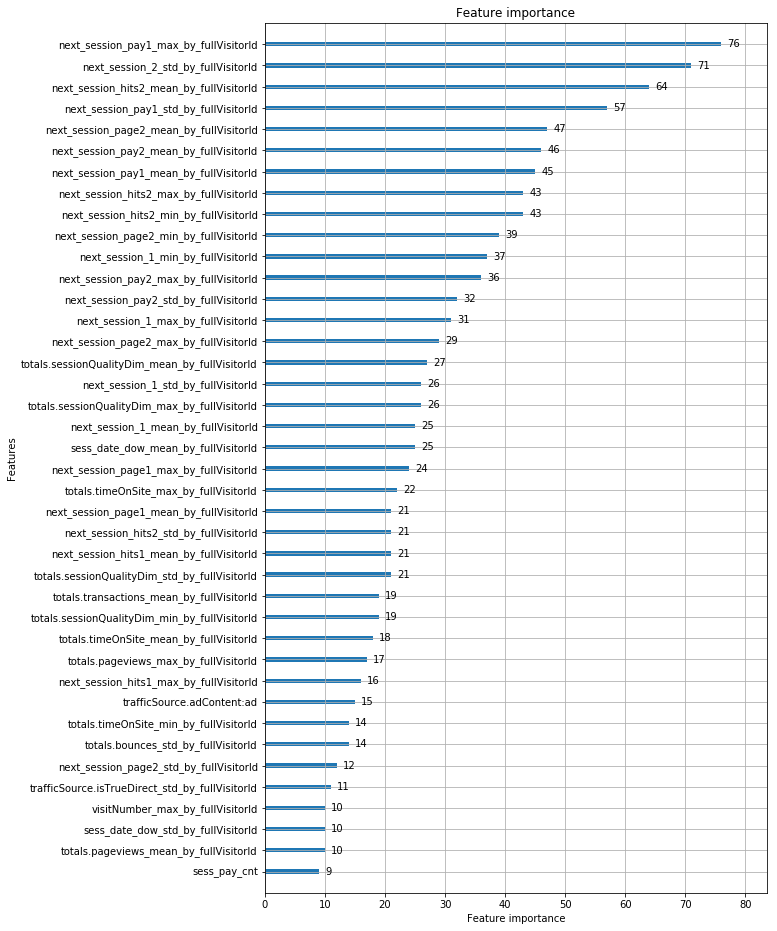

In [261]:
lgb.plot_importance(model, figsize=(9,16), max_num_features=40)

In [268]:
for a in x_visitors:
    print(a)

0000039738481224681
0000053049821714864
0000059488412965267
0000073585230191399
0000087588448856385
0000130646294093000
0000149787903119437
0000150005271820273
0000174453501096099
0000196310838896290
0000255704530917106
0000268499301061358
0000271086753662651
0000324924635296742
0000338548677636278
0000359974620542953
0000385653946068037
0000397214032106948
0000414003317636552
0000443488189725694
0000461840188517261
0000507687995373852
0000528281082051132
0000545498494146189
0000593255797039768
0000656447155196809
0000671967039542180
0000677695778949032
0000750760314301620
000079466719220339
0000795713222238158
0000874371935363475
0000876517619312326
0000900085223565423
0000959812658547985
000096369688341885
000101445922736554
0001059349366430257
0001074102243856605
0001081498167183996
0001143450194979214
0001180870711546826
0001196615762006684
0001216015341831099
0001237566900745200
0001238783160665459
0001239543966837600
0001251773762451924
0001296443891617885
0001359117389301223
000

0080624454780140202
0080649537324657321
008066846930010125
0080716071648403785
0080741756747146584
0080770585611850903
0080827330241226581
008084440969470012
0080895460403027306
008090799742956236
0080925920065198262
008093351305270835
0080977103784137003
0080990901835009040
0081034114977475317
0081036752403069572
0081044295589691069
0081162521672644857
0081171212547776614
0081270547484413013
0081279065378019114
0081288673979202066
0081322494038018441
008133131519495870
0081331679896487804
0081340417522026378
0081348771147790631
0081442942655835579
0081447184198325259
0081564067389873485
0081572450169066726
0081610489801349003
0081616850679648972
0081621509812458948
0081704198683594154
0081723778496328586
0081743546951836359
00817788258571403
0081798789746615746
0081815008150866228
0081824031847138600
008185977475779529
0081874639724910625
0081918095395748177
008195311669879765
0081969951789174820
0082092904425163221
0082093071731657793
0082096507613170965
008221525749397729
0082217773

0147031870829946271
014706417064712931
0147067215361176657
0147095549928122070
014712551655178824
0147155144770286865
0147157033764164558
0147169977061624663
0147198795521263429
0147220483218938988
0147253716018650249
01472565392427638
0147282032421425050
0147308734068586980
0147352484184174551
0147412767689879799
0147435076724942834
0147456274450747390
0147473677990142283
0147508967971873403
0147515309760393730
0147574363760041599
0147612691618133102
0147622631788751852
0147635125318947667
0147681475653097154
014775218343542123
0147764843886648169
01478145552328231
0147825658575249906
0147833098956292701
0147945302390206619
0147956976964340065
0147972871757380987
0147995621823841842
0148010670534144731
0148051758119902114
0148069084951855420
014809604022067632
0148118127820014163
0148132423101685341
0148180593785915285
0148186621337875345
0148202686244948242
0148224992865050150
0148229396520664398
0148370643335803679
0148375338039330786
0148383325178015286
014845538389594755
014847128

023017917156934407
0230192542376873206
0230249454876397428
0230324559716319709
0230358609193751487
0230404817376596119
0230414598124912644
0230442305957031281
0230449429837142728
0230458314301966022
0230458839466928256
0230464748147983960
0230475023619921455
0230496461566565166
0230521887820847385
0230529724478920387
023060483231037553
0230631378707882044
0230645822525769229
0230647726714008176
0230659407334563037
0230702072113406106
0230714624719018100
023072130003330394
0230746115459962268
0230763946523797364
0230769215669479407
0230789255897579793
0230809632709315562
0230890539719268654
0230893009196327769
023091692774809927
023095854106324650
0230974482391616125
0230979721702511250
0230981887769983438
0230989631248023518
0231060341095902812
0231078467547264232
0231081639875392249
0231099661550697039
0231112264728510662
023111337253067473
0231132287972576066
0231141499319901318
0231166192946609192
0231180656912191937
0231210308799898946
023127123079264848
0231328070855806449
0231328

0315296391861799228
0315320918295247460
0315403245202737623
0315417956388073503
0315473358386137575
0315477128159575076
0315503951138930919
03155921971332018
0315612495957820368
0315613120311569238
0315731583126350118
0315866498758046699
031589325610246533
0315919727098890514
0316020740186016226
0316055402328610160
0316060667801650178
0316077094211529893
0316092785892956017
0316101846146620992
0316106859028487462
0316177452841396664
031622376236117487
0316245846903852230
0316286248941055153
0316289356001548935
031632137671492076
031636320501756079
0316372619443023989
031639476945258094
0316402228309261029
0316407781912528088
0316471527416249429
0316485428736767686
0316500075888694386
0316514717571485310
0316576692049177995
0316580814054041864
0316647866921358046
0316658472464999381
0316676114786241114
0316691703206962436
031673752013403519
0316767544516233551
031679256864106559
0316794592057101951
0316803211828343008
0316880294076003090
0316895745550730745
0316916965157303316
031693897

0400130336861783641
0400160660001420514
0400167194749532196
0400181843517206907
0400191357702976789
0400191685725834669
0400199470790712709
0400259242822267104
0400272198203925290
0400297314507266568
0400307142031113825
0400316946171715575
0400337829064927434
040037081213003690
0400458012928037558
0400462346187627553
0400465000820063135
0400480134730758182
0400502571015145732
0400505820028260737
0400561118083769052
0400573835226832
0400610025153661188
040063187525366280
0400643935347631766
0400671312493856717
0400728883321546724
0400745060200364889
0400804696800422222
0400823633017417640
0400831562412157324
0400841014862729208
040087328038045899
0400878348250637040
0400920729652547351
0400941966888297759
04009523463704204
0400970917216059743
0401003916764217863
0401034699070409157
0401041205013774288
0401062648294815121
0401070193546923880
0401079548992591413
0401100315626679538
040111900347161575
0401164556732087898
0401186494048612164
0401215575925316349
0401218118847351455
040123096

0482624592899931437
0482673587398277008
048272736329829045
0482746521800065118
0482753911782087922
0482773144427446590
0482815949504357283
0482826265862634758
0482830701182142302
0482852572160995175
0482932543260857431
0482941429415017938
048295044920256430
0482967223168913643
0483010054554518837
0483017413411939521
0483062952996557710
0483065376130233220
0483085941501061322
048308778817785051
0483089274708610930
0483096017815519637
0483116067256557779
0483118776662726295
0483128943965590124
0483153153024319760
0483198135496068798
0483215159885217024
0483216419425800436
0483216870494855712
0483241821791331140
0483254042423265705
0483258501541011027
0483259174063004310
0483281769556618043
0483319549952102112
0483330937916307037
0483407391427055946
0483415815976922996
0483427160080752482
0483483615314982206
048350744779644201
0483551181292941336
0483585428394746891
0483612591870233247
0483644197863380491
0483742974934555031
0483795189070659099
0483826268943038458
0483881724544761874
0483

0567275731622953628
0567329781646978330
056737632319773032
0567383247532538024
0567444232082493021
0567473830875108226
0567490885905206374
0567505844352414341
0567559339852690973
0567568429666038264
0567632072087918290
0567634974395982739
0567636990700518224
0567672301467536293
056771142504210216
05677208089566109
0567729252151103833
0567729378489320343
0567764529078138728
0567771245573327109
0567793759246523351
0567811456311037507
0567842318922020373
0567844857091003809
05678478042183688
0567899512939986340
0567899904311377118
0567908936102837066
0567960491509153742
0567964963376385520
0567977289769582309
0567981299379972459
0567984217822668623
0568018692993048957
0568025841723577694
0568037335581377327
0568074450419850737
0568116194726889761
0568133636223029227
0568143819961027568
056820937713669262
0568223218179042457
0568226364081143032
0568240408151516469
0568243212521470181
0568260924510579488
0568287706836949004
0568290111687474638
0568307176958387003
056831445601879368
05683262

0664454838334469699
0664501632924571956
0664539262398038080
0664572994140941024
0664640709962798092
0664757702105874432
066480987548545182
066490865413666756
0664916442048827433
0664926421330871418
0665031541377800931
0665057412060256466
0665060392035554004
0665072332649231448
0665074483067462236
0665098283223855503
0665125542423864062
0665150777209723691
0665171051021645772
0665184953528531380
0665237807350165171
0665269474783653120
066528236391073613
066532699404189024
0665394689202835839
0665429098046166313
0665461893807750566
066547649386305419
0665499824823076680
066551722124053016
0665524530689638210
0665539058799595656
0665575782782305221
0665577003166083667
0665579997779674837
0665612256025241950
066564655457784176
0665651914904122112
0665673619381009096
0665727178438543823
0665743797267285415
0665857572181883369
0665899261884487596
0665962435315661443
0666027880646341184
0666037624294981144
0666065179484213675
0666066092288479747
0666099715667152466
0666102645312672124
0666217

0763008151708330662
0763016034577497819
0763030776358772306
0763068629174987376
076307289546851493
0763080883317004091
0763107227044885459
0763112538469536197
076311632271989465
076318101155316003
0763230123733226329
0763250270076567379
0763252307325344348
0763254248517501420
0763314840004829035
0763351562315501738
0763430380999995481
0763443719844771155
0763475568242912001
0763482168102966135
0763498241541432480
076352776340736291
0763573595917551764
0763575903297816819
0763594809547771816
0763642331948747281
0763699912383817277
0763719285368737173
0763800573757148081
0763822444200965989
0763899377349236105
0763971265275075913
0763977671715697375
0763992865551961524
0764007843703691050
076401139768101444
0764056478370594098
0764171974810051104
0764226016966147878
076424429108208326
0764248743246279370
076426823730100785
0764311439518696121
0764319797303005254
0764339332646630380
0764354227699604329
07643909040040275
0764410442727044119
0764451747537393087
0764518998897766377
076454516

0845760129439488882
0845789417457289453
0845821224887326569
0845878469732492208
0845881548200305634
0845901764925107402
0845922777089591110
084595193479892661
0845960025454365248
0846001358846521025
0846008660813638244
0846014434994680142
0846020843948415269
0846037080721414497
084605702728349428
0846069331745756832
0846162414508765354
0846222377787857038
0846242256645059359
0846272826717275100
0846302116605977469
0846336123810068918
0846338892559755860
0846345088577693753
0846400507937827139
0846410549891645267
0846418001871657227
0846469571723101233
0846497737064378828
0846500457908295671
0846502850557388119
084661833625719767
0846639222868051287
084664579453183758
0846673976936911260
0846681173477013556
0846707636927715116
084680059753195397
0846805267659059542
0846858707191016063
0846920295610216636
0846925676588841518
0846993713314248950
0847007813276123900
0847028738057399816
0847058671862340853
084706975809950385
084707526625425310
0847086068809177344
0847205945165664657
0847207

0943791459304807486
0943804168325368911
0943888311119199371
0943894842262689982
0943964576878123510
0944037721626686128
0944093116775977331
0944114928172842176
094415604558630237
0944180406981398185
0944205480608949875
0944215394287644248
0944225028566153410
0944244500044723469
0944255636874859440
0944276367737347043
0944290444788009492
0944301795144607587
0944312143338841897
09443322676098780
094440455346076446
0944435298480368438
0944442416674336424
0944460121663345416
0944566870179218486
0944577965342148545
0944589749333834236
0944590741867208675
0944595258725816885
094460191941314702
094466340640157469
0944673447818301212
0944674152233011351
094470605479097962
0944747011530299825
0944749348240687482
0944765674585380003
0944854716865783825
0944855927574071700
0944928853847658521
0944992360727000227
09449984085586927
0945004467752842873
0945028040362916743
0945031577692266612
0945044634473771887
0945048636626449211
0945112240179874957
0945117722440428996
0945195028006714506
094520147

1038654173852136087
1038667214479454656
1038672769003200733
103868563303653902
1038711270617509155
1038720340454438277
1038730527054371736
1038740980928168740
1038798032702745088
1038806044780250863
1038810199102782150
1038847482454092550
1038854079343245402
1038911853268575570
1039004527150070699
1039009374970344307
1039052897521938682
1039080313692498398
10390912868016418
1039097037215768520
1039107451475020749
1039129234289989934
103915515133679866
1039155517653929521
1039167094250619080
1039195622409943144
1039199904784328198
1039242115453907487
1039245792333074433
1039249742828950708
1039263001536756756
1039273512457974892
1039390582355080848
1039441763619824516
103946449242142566
1039487160231945233
1039493331325749270
1039495550891493581
1039499246821350619
1039500697674354396
1039502360437510435
1039519015498351640
1039583154380143991
1039619745416910547
1039644026026226929
1039656689440661620
1039671621404798374
1039675615241521522
1039686124841410
1039760924214478951
10397696

1134831017802200342
1134871516080633839
1134875471568816186
1134881754747692888
1134882430182930663
1134915595733239321
1134922663688773831
1134979023609565242
1134996764435996017
1135100654090877272
1135127641932922726
1135179886303838447
1135224225929834977
1135241079499251019
1135287413090323062
1135357555109668306
1135366646378804997
113540026830457836
1135407584951199080
1135480074628144933
1135480702906925399
1135502096686388717
1135504897219440479
1135554394410395052
1135560440501858522
1135585498533569112
1135600383691346244
1135623712457181078
1135649634106362435
1135651086379761856
1135726026047919690
1135738989547673042
1135760009786411403
1135760178218028277
1135810225741221656
1135821204174932039
1135845391414050877
1135849070445105634
1135854333721122100
1135864185217400760
1135908258568686222
1135920494847668096
1135998762526733821
1136036430087795362
1136083442433499070
1136093828019139232
1136132305384272355
1136140176337870706
1136154618816270206
1136177669892316357
1

1230939972288155078
1230956233642509232
1230964628264913106
1230989689743420589
1231032379614959784
1231042606006789243
1231043264152281706
1231049403247674401
1231056497393873567
1231074390015384124
1231109479967317745
123111471088247696
1231123556197203190
1231175333727236763
1231193319505434050
1231240275100892185
1231247897301165810
1231261300400125627
1231262120073257337
1231266343324610960
1231272653670676609
1231281284702930943
1231322613661807864
1231344337838335141
1231386992904953632
1231441040078959217
1231486193269846680
1231511271789130399
1231528162746756607
1231556989476335626
123156248614648476
1231605068606957289
1231683593147019270
1231696765655110192
1231710547660092956
1231773372684362376
1231796410138422570
1231807016580706175
1231827720768434374
1231840942803152477
123187447037379680
1231875645256586258
1231887908441833184
1231891283957013848
123192805807391692
1231938972819253370
1231939245407709054
1231939256700482303
1231958721085380014
1231980410186325765
1231

1327980799662540391
1327988785672116892
1328012285628199453
1328065366487568435
1328093235164985623
1328093315760209624
1328132621144079807
1328134816848812523
1328141535661770543
1328164859259149150
1328167594911945897
1328209913968088186
1328218351421970988
1328239589588770865
1328349697242227548
1328354229333255338
1328374204904647359
1328428485152302766
1328451795670707314
1328455848950866328
132846427342659625
1328465522046866838
1328521629075823844
1328539144586467788
1328564661102857657
1328589780255198562
1328591750237868675
1328601907758744970
1328608941445598318
1328618215932087603
1328705524005334260
1328759266669229306
1328762337517481004
132876793942372458
1328778755677591845
1328783193746850363
1328792062393708135
1328872466859941332
1328879072901538904
1328882271372646415
1328895761121872451
1328928986449608475
1328940250664944808
1328978250317485638
1328993623408016755
1329029229956981212
1329074715607478853
1329089503952416045
1329108191343602454
1329115033639244930
13

1424611309449071342
1424656764625819777
1424710448067346892
1424735465541940490
1424765622889477197
1424820426200206143
1424825119535772785
1424828192796020234
1424829351224461929
1424837514388385184
1424905826881679883
1424938253356688803
1424985144270472253
1425116210487965097
1425139453305344250
1425283779572681817
1425314970539610386
1425324116063936126
1425342237127041633
1425349626317522910
1425413134086434391
142542127936196847
1425430524067623585
142543677517584031
1425440284152308264
1425508167115293548
1425514266049971283
142552376756786181
1425579504325018782
1425599182139119707
142561708922389258
142564642446394021
1425655594858126313
1425694914273944604
1425732739516188610
1425779985565615174
1425885666186590473
1425896458350406618
1425902528456212575
1426018165478275812
1426019277542100924
1426041843157022694
1426051628447562354
1426112733195584103
142611919784529591
1426119263078985143
1426127975569989190
1426144498099445996
1426199662155368405
1426267555964143860
142629

1521677862372109409
1521703559352495917
1521712084468897186
1521712707229703022
1521714215593899893
1521750366858111394
1521755310280802155
1521756483967585115
1521758776821750392
1521760779059805375
1521820469864316594
1521822593201671096
1521829745772695461
1521856902872852632
1521864102402543918
1521885507579965635
1521893284999398542
1521925516904814314
152192641712214986
1521954629786386012
1522010850204497454
1522041296623951548
1522084616785410866
1522120624336382125
1522125845476997267
1522142186257294048
1522167681969825629
1522168791862347116
15222002561364121
1522212856508806575
1522293108992163956
1522330928305215590
152241525933181740
1522438582405246727
1522507827700009558
1522509690323660876
1522522972200295713
1522566895376944940
1522620088260407212
1522640912329778059
1522744025009256936
1522763933554435789
1522764991140833464
1522837170509471282
1522968121349637779
1523079987531160643
1523082019795113965
1523086825791123895
1523086928338480142
1523089240325647836
1523

1619177512190535785
1619187224077645354
1619233190432895072
1619256010097607500
1619267308386690452
1619283100646121170
1619287192505500013
1619299222143373294
1619304839841961787
1619395234911870524
1619418803204600955
1619452419746116266
1619453955643135487
1619457225368720087
1619457255048355421
161956992140571796
1619572489285433523
1619637971585172300
1619661749482521849
1619672210129310250
1619682272351887870
1619754213133239219
1619772109102706148
1619792563016181071
1619804064489836391
1619843497718613732
1619847718553012431
1619860943097817297
1619869945132982616
1619923271487721760
1620029081826256596
1620060559349021869
1620071413106699155
1620124972238702137
1620130118586347598
162021256235041909
1620223940115721978
1620224313129247991
162026350032658170
1620336840908414468
1620354324018808992
1620399241032448497
162043078293797756
1620467006992426083
1620474010989884536
1620495867765894187
1620541816993100151
1620561767541497624
1620610443267883199
1620611623475840230
1620

1713909049225957420
1713942352970527061
1713950059023312849
1713952449509754692
1714084982935896899
1714087481458643423
1714173217419014417
1714219709573061238
1714295356446319308
1714316330316280193
1714324730886255269
1714421040445130426
1714527724675591672
1714602617216530033
1714791926170971471
1714803478546292931
1714808920563983225
1714909954924387365
1714915520866891473
17150021234074083
1715003079922018172
1715011111031154619
1715019738580532246
1715019999904162675
1715032487373722023
171507373631988650
1715109910479135009
1715154189771217039
1715177145930012289
1715213288963847091
1715223250606833959
1715224576201848683
1715224996639016740
1715239148247421804
1715242203505795597
1715243011198352921
1715254312655926643
1715256997166105476
1715277710611219772
1715290847751444676
1715292002499515073
1715366369695172586
1715367097877019366
1715398808518345875
1715427176579507271
1715440572151040318
1715450535467247171
1715463955810993132
1715542779335721801
1715582938630582372
171

1808931200935965399
1808934908297251129
180895952876713807
1808983217472278640
1808987518907816017
1808987712107071689
1809015326608720987
1809019717254474554
1809027402095183
1809030045334880541
1809046180813731351
1809056495505810414
1809095747538430061
1809230659517002532
1809242214297851637
1809259591119247628
1809280333022765332
1809297905086078614
1809297963241349089
180931994995761365
1809413806775404976
1809430067940407400
1809463929573528388
1809473046116132827
1809570845892699848
1809645099012248097
1809657467525600618
1809660321598077636
1809688554956583906
1809689704733562164
1809696996650492927
1809712794485794408
1809716087241361123
1809717146917731133
1809743365196995213
1809807918385213810
1809837389648559080
1809869593886890877
1809902733149439661
1809905188405768315
1809928286420593464
1809962599745293247
1809989484977617433
1810001963854420705
1810051030152274013
1810122442572668694
1810125016148812940
1810141207021411078
1810149907737939607
1810237825805993121
18102

1904055644371276384
1904057325971605731
1904064745916908968
1904092882937870221
190413056233383177
1904141215086734953
1904189970394503289
1904220282948992565
1904232040245804374
1904241244402328340
1904291878678271238
1904315007462799188
1904335513894666060
1904335759718544389
1904377425783880732
1904388527737093323
1904394818893539768
1904395820279668290
1904397721461887027
1904409649153884166
1904474555282389242
1904517650602727326
1904574669962340726
1904577554806020902
190459972335024069
1904637175058072663
1904645962000224981
1904685469347410562
1904686817828399718
1904708348670939834
19047575907456229
1904765813428326904
1904782166721400010
1904794973364212926
19048117954346573
1904835714476970902
1904880301526262017
190491273649533971
1904921057927128427
1904930194595300229
1904933019768670993
1904934263849001036
1904952660663238300
1905009085383401554
1905054725156630015
1905131804641137861
1905136385656215682
1905216581970783932
190523475387118277
1905250201207933591
19052736

2000535348130503082
2000558255085271875
2000594919551991504
200059751656396680
2000601619956455194
2000606968715776283
2000625626701592786
2000626699185080434
2000629824250048867
2000637618196039579
2000672387451831445
2000681864898367110
2000725563080031625
2000748184471769835
2000772380226916615
2000787252896325558
200078823887646992
2000792222547262095
2000867339476627656
2000885723265348080
2000919320865425735
2000938283686831001
2000945653635360579
2000976382667206616
2001019930302918270
2001092031162272316
200110694434113973
2001129353474541181
2001139619479424502
2001142273345693012
200114453506374554
2001153530751813849
2001179977075825711
2001193736378101019
2001208711221192327
2001248761004711641
2001260449741765749
20012702113411483
2001275936812634353
2001297581173553286
2001303083425796406
2001307959041312616
2001322015963261099
2001357699529821971
200137997136953085
2001381956520675399
2001394035411251110
2001394643952667723
2001442928768864567
2001467798384882086
2001477

2096479130791274622
2096527890705544076
209655558681137314
2096572971814176076
2096622118381566516
2096625737800338908
2096645801563045378
209665252817212211
209665857841291089
2096697773464705124
2096755926947018697
2096781697664321291
209682070604503416
2096838691152932696
2096858489390344405
2096888094118669935
2096916712417263572
2096933493424772894
2096941242229249024
2097039326528157494
2097049439245427078
2097091581805758454
2097129762948228902
2097234869539221676
2097269333177419343
20972754092086432
2097310226654640513
2097324339099069612
2097334325885425421
2097379345121938352
2097395333465110742
209741501788184616
2097428620195719945
2097452463982750217
209750966869043515
2097533805670313064
2097571112713705794
2097619667231146442
2097637227705187813
2097674501262469809
2097760630073738430
2097769467544504765
2097785102178964654
2097807882337635150
2097820369433148856
2097848786360746138
2097927451899957604
2097954844038988380
2098004682594312009
2098035808507483175
20980576

219584316826287751
2195844490093846029
2195873812846301435
2195875920856167753
2195918059398017737
2195921186831914737
2195957374099813540
2195958824690880172
219606367504427718
2196118374887208422
2196159800941904322
2196160219174990229
2196243460022666901
2196248902678144876
2196356974998196350
2196371053523648128
2196428428693531757
2196443953931792827
2196516943537918319
2196528822608606844
2196533970739048670
2196551320354275975
219655999227249953
219659185927821374
2196630081157581722
2196665173544445645
2196676440008676503
2196687565603465285
2196756596967669152
219677870647766434
2196807302284521207
2196851333568693448
2196921890310041430
219707413113958075
2197102472329216210
2197108320546039663
2197135730871727218
2197152277048665655
2197164129753599029
2197166691208984394
2197219079708091288
2197227502003927576
2197239739584672345
2197241880387522045
2197265144188460941
2197289975691583066
2197307620414326178
2197311373540527821
2197358494252003064
2197359014745675457
219736

2296065056032601781
2296070719083297373
2296081624599755446
2296101225371573393
2296104594014169531
2296112067938668672
2296132678648590037
2296160574080806361
2296172223047712827
2296172755387461689
2296252356048320411
2296252689980501079
2296314609103546628
2296356081188742534
2296372819583638928
2296375321166995878
2296451442532551381
2296514171677341432
2296515338027653251
2296515783395731418
2296522249134020040
2296532585441879913
2296620726585635848
229663246586617121
229671438073815275
2296730050014526223
2296774676386576557
2296786580693208368
2296796349735390889
2296830356229148279
2296849048953955972
2296974146213390342
2296997012132680853
229702460008654819
2297026609799811412
2297085138712538713
2297092844756710678
2297123233247272234
229715494124184999
2297157470868209086
2297163696327525479
2297173249903507517
229719840267890146
2297243591426363927
2297269386315292915
2297280372156159886
2297287827319670023
2297303150917042048
2297396212691662125
229740195606242015
229740

239475664122836336
2394786124190965526
2394818242486500064
2394856292314477735
2394872513671914724
2394913192138439067
2394915311404129667
2394918902856600366
2394923012850783592
2394925193064696967
2394936687361371670
2394968806845058968
2394970466296782066
2394979198598413971
2395059444756775315
2395059980453455814
2395083342727960041
2395099516161792364
2395102689134120726
2395106208118669078
239517614155730529
2395183008812125816
2395193615776723633
2395200379941106068
2395210523482068885
2395260556606738730
2395267003010897051
2395324704744662347
2395331518998784442
2395368095261205615
2395379535056983302
2395464778564424004
2395540312663957006
2395549487502946768
239557501470835419
2395653838228716953
2395683086157754358
2395687270224867297
239575838260292891
2395771233809395798
2395793345153210816
239582088688877059
2395821616849140655
2395826412763396501
2395860894671489053
2395909568291527060
2395959162020748818
2395962943783978589
2395964992451902082
239596554266329586
239599

2491139003103342626
2491139110650670649
2491154485278845087
2491154713621887210
2491199002025731256
2491199605291784074
2491216817554187889
2491274592902682133
249133882650382236
2491342203211342636
2491358917697468174
2491403659909958590
2491410556044863951
2491420961519652225
2491436236635168854
2491457194628685207
2491520410276388063
2491528184477045255
2491550182089476659
2491601799390222171
2491614936640456364
249169677880414795
2491725458034192128
2491727586758471347
2491774355728846552
2491786381864629512
2491788739606201344
2491796152525995142
2491838239673304598
2491841603905629521
2491858007633250206
2491898481051188387
2491917854750543355
2491928329640339644
2491937384674030427
2491951574106734685
2491964518736472946
2491965092941273215
2491985083462017108
2491992577895428478
2491996335394162980
2492111303607521988
2492140758621690261
2492156290925655521
2492164886132202520
2492179677606865596
2492182762598615538
2492258542861146463
2492285400103205050
2492288352801687791
24

2584098193874201170
2584184959864239623
2584224085133190413
258425681329463843
2584269530171694914
2584304824342568329
2584414199018787200
2584418399002290613
2584419469394243319
2584433970905226279
2584492965243484663
2584498731693597603
2584523207958883760
2584527809923179500
2584575468810850082
2584596207049082310
2584611261071552920
258462894629894772
2584640117391502859
2584666096466544056
2584689091738893877
2584697730219762959
2584744943779116708
2584752960237369969
2584776263433115882
2584784819516296334
2584814826704150003
2584838967291412269
258489931620946555
2584919319378344174
2584928106788153772
2584964175531447759
2584999737611096724
2585068623141440149
2585080762236423133
2585082436484701663
2585098365015928424
2585162787150552724
2585189974516155657
2585241472429746761
2585242302955780733
2585249871579858719
2585284211788958901
2585314554269518787
258531780494833831
2585323037065989094
2585341042388996930
2585341560158987090
2585350736341591778
2585353712702324977
2585

2679329809296603456
2679385524071615511
2679406017454127089
2679440372598698008
2679447487409467133
2679450026637278603
2679483177972412455
2679488437662542413
2679527574605255510
2679541816302507974
2679544319363307068
2679544817568521965
2679553651589979284
2679555781440759235
2679566453208949263
2679573173889507674
267959228406873145
2679592692945107210
2679599440134022076
2679606612583381661
2679615030466499135
2679622054274804473
2679741248939353633
2679780219770954817
2679800843792909146
2679817616617448694
2679869914464612547
2679874143614290247
2679888243265136560
2679894889990348779
2679902388297161960
2679907641158328533
2679922422212919791
2679949410465454704
2679981411177279770
2679986974623985652
2680007150985831556
2680009738807425488
2680040951187705264
2680086087624127892
2680086910538143854
2680093479099764933
2680094134320900257
268016008644779106
2680161790631403800
2680252251856871028
2680254150280720877
2680269710332197567
2680281747299026731
2680322208777198249
26

2773002536791541917
2773005963252802792
277301084946870620
2773057051106453039
2773061334410423817
2773086770457186295
2773087286983229967
2773090235012942426
277309818000005913
277315569483213684
2773157978610129800
277319257293187972
2773198298484994397
2773200171657485126
2773205924213212948
277320595901172633
2773253166591613436
2773262110201277613
277328579732992739
277332488711692262
2773362002394915004
2773362793624746677
2773383803092786202
2773522327939698553
2773526689676858700
2773527969908340140
2773667893760394737
2773719213585590758
2773724378432121726
2773794034618497064
2773799112110610159
277380073361468692
2773810073736682542
2773826377646024873
2773841909730535071
2773860330936306576
2773897200959139852
2773914207479839631
2773942497477266836
2773975867549792344
2773991016137113920
2774004774290765424
2774013885720650684
2774019111281556295
2774036378787318254
2774042719373918832
2774062722914342923
2774120403623067813
2774207473344797584
2774219788755193592
27742522

2871415231850669911
2871418946839239676
2871436049820656093
2871482923121277961
2871488686643722566
2871508644101915724
2871555924981962569
2871559209585014138
2871567218115235388
2871629322431577785
2871679540528389083
2871772141813189605
287178314519681926
2871802293449474002
2871808299510667077
2871815345845176541
2871842038886666517
2871847524591965757
287189511535663070
2871926783052608108
2871956175212877753
2871974226456675551
2872003267415395019
2872065666574001397
2872089986793956856
2872266471903452277
287226971049300861
2872289907598703031
2872292405069319676
2872295661460587659
2872302831168937051
287231386722251086
2872337878493307106
2872360971272863772
287236298365496084
2872365599212726234
2872366290887498422
2872395564076520825
2872397085560405183
2872436624371887748
2872509500528057620
2872515411716319607
2872549345158725302
2872559785400252665
2872589835516918361
2872649541086085393
2872720801869380207
2872741452235132264
2872758826363240590
2872807749180416423
28729

2970150897257684467
2970172341822787633
2970174070160188968
2970183546352015592
2970348847537344350
297040249277570200
2970420980858929127
2970571744858526737
2970572984409046540
2970592659466555564
2970597297907976072
2970643995155220368
2970650967036519285
2970651324440105928
2970673977222685542
2970682803069295681
2970691622553310638
2970724836421662639
2970743668638810331
2970745596045341544
2970818902712309424
2970822219161491196
2970849858803352215
2970854905255098640
2970870460296974840
2970953459387408606
2970972273306176134
297097392807045722
2971005300499739
2971091109851400715
2971129509653895193
2971166963892697461
2971182020261866538
2971230523815240662
2971238543574696779
2971256899042827491
2971261534842594382
2971278155163857040
2971287265520967317
2971312807423118682
297136083297372379
2971388946191276399
2971393157992824084
297141834717730888
2971428226753291233
2971440964799158141
2971446288598993900
2971454677913758645
297147281299502946
2971549735411131549
29715594

3067310067332601994
306731498191352118
3067354637970176349
3067389536467723143
3067411170371796174
3067455711076582017
3067479112923141184
3067567230864216380
3067613544324914500
3067655274374041177
3067705043814130858
3067733475910857588
306775706760463014
3067782268706899661
3067784565546503897
3067817265816287396
3067832263935581767
3067864503285626072
306797213106912189
3067989322987890711
3068030165541212055
3068093236885512807
3068129143814722610
3068153627898648951
3068159653025040338
3068162627789698552
3068163834300002091
3068219312293506986
3068231617975413496
3068279521979767201
3068295035037388820
3068331625172276270
3068350505220191174
3068367231172063752
3068431031312069006
3068462451478585767
3068499320018268740
3068539936601211925
3068600585861011656
3068611098917659614
3068623706947896090
3068623986876725673
3068662220461322782
306869665777423705
3068731834951740550
3068829335503018527
3068834376623693935
3068884493812337651
3068886666477792745
3068897297945224711
3068

3162709959348329740
3162747472080372287
3162908082497251765
3162960125358413368
3162963231406606509
3162980237946447884
3163001360387558782
3163008371116752423
3163012163168629909
3163019017998896858
3163021807082967671
3163042099918698933
3163114966858210883
3163144815171050510
3163167712058776536
3163184678309167181
3163187589170136849
3163207617641813881
3163236753898242413
3163253861662602932
316326180629106841
3163285179079135568
3163314287889496385
3163376436989724245
3163416860142148699
3163491069858474205
3163516586515784255
3163558277122727034
3163567102999009238
3163594115675081210
316364210366927390
3163671393042238323
316374384623531736
3163753915317114651
3163847083033974989
3163871315884421366
3163905932482033982
3163951687385181488
3163960386036788176
3163960471704657019
3163966436596951507
3164025335982262939
3164039472492811258
3164060453279975685
3164071235722662375
3164078476906753762
3164091967230059811
3164092330325802314
3164213129097005394
3164219340669533709
316

325970094038973212
3259714291545715086
3259734303250994347
3259747980311120524
3259796873810770047
3259817072582112138
3259826366613681343
3259837847188728929
3259839686802383923
325988961513820381
3259918637314255323
3259971890749202487
3260021355494376158
3260036464340466492
3260084373377326917
3260105172831643551
3260162183365911320
3260181451408218255
3260199856270027885
3260222892668295280
3260227414580557075
326023642559978260
3260252695663100660
326030163848719672
3260320425534341980
3260326426480675662
3260363458945764174
3260374808125679161
3260419950427914009
3260420104039199056
326042192131018379
3260571830352351161
3260580918111307626
3260595411534990098
3260616483924978070
3260647675045153401
3260651669196961736
3260682725122731167
3260689899290197287
3260705336611135667
3260760479093115304
3260804031423396692
3260818228047856266
3260823305818573094
3260850248357720139
3260873639211468167
3260884327347195135
3260888973518352691
3260906450730631690
3260906960302859532
32609

3356187340339095767
3356193180968862784
3356248050155292336
335627158166673430
3356319474026751218
3356335428363217241
3356338191906553599
3356369762776399500
3356389989693058350
3356414092802451707
3356428762545066833
3356455753892739405
3356473042741750592
3356505810231896985
3356514534592506848
3356517589964463276
3356529455967958495
335654661649558835
3356605875698983117
335662913029897809
3356630160432393240
3356654524895453016
3356789006061163798
3356913484414038819
335696823737709593
3356977617313638868
3357014055827331353
3357043251799821816
335713032162061248
3357145574132490664
3357193360974581666
3357202675801034448
3357227808316206708
3357253680122729963
3357269372739250327
335734408229706617
3357456840378067260
335746064592513311
3357468840097353157
3357474476214792507
3357508169361727645
3357513894278600970
3357527088869081283
3357538935769878033
3357567360842613467
3357571739001992588
3357577990301057513
3357602594176021671
3357673216629065971
3357710206017031115
3357716

3452246182992182012
3452248140010461828
3452304674721579688
3452307909803818339
345232083856357830
3452334912084453714
3452390359321025057
3452446066669808385
3452478620465799077
345248677248181369
3452507079172747333
3452520205030139541
3452520428352006403
3452535696944608829
3452579274510675148
3452615918479001084
3452624149557803852
3452625156234712975
3452631103974194390
3452639724732442428
3452710575527690182
3452769589941270651
3452774610447629523
3452788647777645282
3452820115714565032
3452835356223482889
3452852157080014300
3452864514555555772
3452917979174470725
3452919108624512294
3452920346646751273
3452927768996938798
345293976279385540
3452944423015994897
3453000682989805325
3453017881846267365
3453041982393289732
3453060071247290885
3453086778825669678
3453121359723967886
345312932860328211
3453136315873940864
3453182332372895736
3453184373293287506
3453185698048281760
3453188475226675799
3453229666851611634
345325436744884881
3453264504956344894
3453267566856830727
34533

3551795259926536705
3551820728746912997
3551829805003742917
3551838375236380040
355189718756210887
3551901100135231402
3551904121947153433
3551940012137096826
3551963967820714565
3551964016049167733
355197854246428925
3551988711399040233
3552004057274768559
3552034753820042647
3552059315156877781
355209951810646299
3552107227896433118
3552191743538299683
3552244811409727426
3552294374577591036
3552325024291307841
355238143497704691
355239687339920557
355243136096639607
3552476449111872791
3552573226820637894
3552631206964578058
355267096721585615
3552676886748092717
3552738276945333838
3552844519418895130
3552890926929278051
3552959434475493651
355300444817063962
35530176843308468
3553030697065373608
3553074078270799246
3553085469881193531
3553116178560761750
3553129912930335823
3553133939120693006
3553143719532379569
3553185794569391749
3553187716581249557
3553205012537530584
3553268260363770248
3553346275717310941
3553368248642659487
3553428369669149896
3553432656384872426
3553452261

3648096457587629442
3648111227535332603
3648117573650203065
3648125598261935832
3648157747300480619
3648164267023626123
3648171340868479969
3648186573541240016
3648228123327670370
3648242818826999258
3648273211582549959
3648293409011648468
364829503958815644
3648318576431304335
3648320852184942487
3648391547420730557
3648530693638476312
3648534436215638053
3648558258252826294
3648668266442371809
3648701250672633428
3648721190502281878
3648740154482758068
3648785267546331651
3648796349343779872
3648814843174760421
3648814984476258989
3648832544144713250
364890178977410010
3648916077454515901
3648916227404554647
3648920535487302834
3648980957599868869
36489836674108308
3649135388745604968
3649196584107998173
3649202848629491937
3649302916700324703
364930702082370772
3649314315313027059
3649321447120613485
3649348101449837260
3649351818082624871
3649360221159729747
3649396788878918608
3649399072936245162
3649408993895998420
3649412303833867897
3649444026780182916
3649446546929521417
36495

374471541026416908
3744732006197764340
3744792480453918888
3744802415697567758
3744810795108077942
3744818882036889554
3744921890048986289
37449992702163667
374502192337599724
3745054189927246775
3745087301852941240
3745100355122482098
3745123314885593905
3745144783003974366
3745161998634172551
3745178204063581923
3745254289539712312
3745263557693260846
3745270775038174387
3745292729196846258
3745293009066703957
3745374989848882704
374538402403431396
3745453610774134459
37455190858886876
3745520183715899012
3745522284719093526
3745535721881986408
3745592015111181496
3745636526032829837
3745695180337847037
3745701733063025655
3745726581157438362
3745776049533135011
3745784260131631368
3745795139825424521
374580880974763983
3745816541344087742
3745825279291262795
3745837795488459648
374591052739380270
374591406931582038
3745921738142309116
3745921966974817949
3745945375721039219
3745947363599850765
3745970500228771947
3745975100929418167
3745977279211123229
3745999568164323768
3746076343

3841270013658509996
3841270077073602383
3841296561919726053
3841348535655694068
3841355339069308606
3841416814969630880
3841513499345554817
3841519867126342568
3841538408420076910
3841550165446090267
3841580725356092631
3841606076104625229
3841617173208296119
3841617892699276082
3841672211326626879
3841672624695275967
3841770715602176453
3841806479631252400
3841843126801316487
3841865977201228215
384188540650508947
3841911521773787422
384203072448612408
3842034956588645006
3842036498247290333
3842043044177455301
3842074528579594706
3842087423694370452
3842091558549705135
3842110498618805215
3842125806369952598
3842136833980146802
3842170460595757819
3842186945955565725
3842225207257801866
3842250167850794381
3842261331224876536
3842276532315513045
3842277047820282565
3842314858635424688
3842381685168742623
3842427014047049438
3842439462715040111
384244232103641298
3842476077213611951
3842479830187251717
3842496573101350847
3842571967494902903
3842595884095731086
3842604235047922075
384

3938677840237071440
3938683195875669316
3938688202190182443
3938689852486929376
3938704025186096171
3938705287578585658
393873248456324012
3938748680593599048
3938751002773318117
3938753329970589139
393880571830205991
3938842513437458877
3938904276512459479
3938972090500279678
3938985684422421927
3939004052808551026
3939093869949678010
3939136412878673942
3939146843515306805
393915957621507379
3939181204080614887
3939182288834610944
3939186704331159616
3939357454153008373
3939381864309559028
393939514064738602
3939396221665561098
3939454977340720754
3939485660754610989
3939495341811821020
3939522602065442322
3939523485598420867
3939538686821751775
393954668930940195
3939597217643566826
3939651389498845345
39396730886901712
3939673974922141971
3939681361424241485
393968530604441892
3939690955815065919
3939699175169627673
3939702330703344360
3939769470477259704
3939950715396754379
3939961210152021575
3939981209225381334
3940000566437989714
394004765472497688
39400477842217783
39400698384

4035004317691764940
4035023826160267435
4035040984024288703
4035079867497794861
4035106173678102980
4035139543209729142
4035240833050429040
4035242990030813448
4035258108161332678
4035270097933693581
4035275830510680701
4035440695267852642
4035457507867125546
4035463056705710307
4035511047445513625
4035514126879679331
4035558906700125045
4035592920972743849
4035604055806268175
4035604096783628471
4035616123967264655
4035624775625624121
4035646593086668263
4035669536609906382
4035685069431843073
4035691986476582099
4035694510001235625
4035730025583203625
4035736225271099020
4035873706550566435
403592223605384333
4035924143368954426
4035949412289625420
4035962590847654131
403599982209671553
4036010358047775588
4036026197863389242
4036057444035564338
4036126654738688667
4036139233894581522
4036151977167641609
4036156913707324462
4036158425597583194
4036201352848548072
4036214259572669485
4036229425547257796
4036231175899962157
4036244387104115789
4036246359570444171
4036247399553913746
40

413118603515415138
4131199126209521540
4131230656638498191
4131254518154475993
4131260108036375834
4131260909311668658
413130427474274811
4131324581326439146
4131332535899656619
4131337964588644337
4131347643316721185
4131352912632306308
4131359793220543224
4131399015233838940
4131407215193612003
4131442665848767209
4131531708917127136
4131558506708506171
4131559966648203111
4131560669434545347
4131601123827712352
4131623699910734273
413162988473129056
4131666541271375203
4131686816635765238
4131694711589922371
4131815669137227927
4131895188457529805
4131941007111845201
4131956161237660038
413198909972995395
4132036814801835119
4132072225320114466
4132076231745840901
4132138429457651568
4132173137256501929
4132175652610629504
4132192551612907368
4132204335823696585
4132222461996983018
413222498874095707
413224571399747418
4132261613792839853
4132272597528179511
4132341185070533968
413234718107121755
4132352516872970115
4132497796026379236
4132499985524005271
4132502541678886408
4132536

4225627017362060919
4225808362613566074
4225839403746818517
422585981544478647
4225909784666609403
4225915080338426266
4225949920113426206
4225956117599022709
4225996042735323956
4225997400701154352
4226033420041623153
4226040204366787332
4226042068095664157
422604251285934117
4226082235780918927
4226130631913564632
4226143354674207428
4226165802417875163
4226179159883474742
4226187423005499733
4226204601112753173
4226219829903080795
4226233497192309879
4226293926811077234
4226309262940604912
4226327434868724238
4226344968153333717
4226351837501743720
4226378581826543138
4226442968557835865
4226480971350086714
4226498975397812956
4226533282102816972
422654756779986219
4226571716211610872
4226598773926004206
4226610276586138319
4226618871126569119
4226639658885646921
4226650783036884322
4226679341699949686
4226684792104744674
4226689081709558524
4226691305716846028
422671427033487218
4226723447898735777
4226726925350133035
4226764288861350907
4226773753205575252
4226796507470169352
4226

4325481559267936654
4325498352299986393
4325589187939034853
4325653971690354213
4325707388418433734
4325728939661164668
4325743115228827519
4325842029227110963
4325846435237540712
4325859743515278398
4325912837416172368
4325921412439230749
4325931129944963649
4325966682299670958
4325981911319537300
4326000986228361626
4326081424789981562
4326120051529405342
4326172846995235412
4326181594678656675
4326253814129885525
4326273584728512688
4326284075452762077
432631607692158671
4326325285380029031
432632634112940900
432632806648491609
432634979556566376
4326384484168885708
4326406847281871215
4326435738534599610
4326438109953778714
4326476609991712809
43265857353191668
4326633885452746667
4326642245276509978
4326726966682394018
4326730483795406764
4326744496431662162
4326762293621314965
4326883972588528411
4326936483423125043
4326972960326181018
4326995049504827999
4327009347311675479
4327064785660765537
4327067143116802240
4327101906764522454
4327133356808768315
432722088966635339
4327226

4424049740503478573
4424087475463040164
4424105338008525188
4424114780232963529
4424141086268779721
4424178119137540200
4424200732011516756
4424213379046264603
4424250474653791473
4424276774043614009
4424311914848212437
4424343578565264854
4424435725823407679
4424457565207369337
4424488656099691880
442449525830940797
4424529207555438690
442456318800690380
4424564411330854665
4424668400673845009
4424699139727421009
4424724608864112854
4424736058121410943
4424761471246546478
4424787448753171807
4424796566301497840
4424810973042004387
4424841396139883908
4424853026387560949
4424865695972416224
4424888580612475365
4424892404502708458
4424900823499816982
4424942472703389352
4424959676804370921
4425005284656461646
4425005598243454492
4425102637465411815
4425120351879327803
4425125616784306760
4425134755142988509
4425166433077025690
4425183415439451365
4425194110749337302
4425206907442239739
4425232949003682333
4425237641449954979
4425269005780812538
4425320012483144493
4425323508481571400
44

4521090726567097249
4521157857265438491
4521177814867516483
4521219897108788407
4521279339725214472
4521414337229932364
4521415605431188709
4521426679717295193
4521428427468321492
4521472020730049624
4521564792966109611
4521591888785232612
4521727783597339865
4521771065078195496
4521789895421671241
4521794925361859879
4521814198571023823
4521834979961949348
452185410498942037
452186942722602857
4521907764535457403
4521920879482972640
4521967298031946351
4521970889173509102
4521980748782912356
4522029414865836078
4522046781290891582
4522055188010027560
4522063632131489210
4522066110673916766
4522090285602945164
4522095715259656171
4522134898271197339
4522198691689316340
4522202414746764815
4522245863479908742
4522247722115419490
4522252919277316097
4522258459264621032
452228153316892650
4522338564372792725
4522342673154444474
4522347218150249469
4522385032519199279
4522399668892170950
4522444022692609404
4522454216093100113
4522517936552554962
4522545075803407614
45225636607675080
45226

4617478773097512646
4617498198227431443
4617513600199878282
4617548161874598104
4617562669138504216
4617592332191292440
461759772437441860
4617612323105645640
4617632661410111642
4617666454939869973
4617667377803062938
461769427007030906
4617733621875777934
4617739451116328477
4617743478856131975
4617762852183915383
4617767894942819229
4617811021422664149
4617812329030606923
4617831473472310305
461785233201236966
461791816878813746
4617940004365430937
4617969842819236709
4617976474253995037
4618044919454961150
4618051546631658279
4618060703575359641
4618063643707493598
4618080482288249439
4618096141600434022
4618139591663483723
4618140924583180419
4618145125642094550
4618195829419459017
4618234030354117827
4618242937217722259
4618245666303087886
4618256460485747724
4618257049278928468
4618287119146279611
4618289732123035298
4618397814536022479
4618438455186728806
4618466723915266360
4618488835393346343
4618543023522009680
4618557132257923817
4618574782526958547
4618594645717954308
4618

4714976454922723720
471502977788111879
4715059351130526212
4715067379161527213
4715069524006239426
4715071694659425359
4715073552990435787
4715093695245500698
4715095243427041721
471512014134612615
4715126321962151766
4715127995122419704
4715158558143277223
4715194973407745413
4715236171443071392
4715241444296318387
4715253830942601211
4715257127260209762
4715260249745283922
4715274600729962992
4715316581973563830
4715358908824733120
4715378110731394003
4715403440485745647
4715454978888147109
4715489700014848273
471550444684426958
4715527406980928303
4715534296381721641
4715559548048439295
4715596826912799924
4715608981115365588
4715611032636660444
4715657473903296095
4715676607050322497
471570132004812560
4715715036442630148
4715736429293602494
4715741466358277865
4715745142896781772
4715749671180572415
471576502938725214
4715793228881248761
4715804683720739713
4715822320307137785
4715875245649313019
4715881593480626761
471595047921008831
4715971000022095799
4716040851607898
471604980

4812143350304899595
4812151272359083867
4812417127533827465
4812427664853092233
4812443338630290379
4812457074915497875
4812470933622479776
4812491740041541653
4812534495174608634
4812549258537742111
4812558400028757177
4812569317634425415
4812653494902485809
48126646198772933
4812679730946244329
4812718793502186767
4812749789990653504
4812812103662440383
4812850386423449717
4812908578346980627
4812917835440761485
4812928266170581161
4812942209261159549
4812952403441512083
4812977308966718141
4812991919970265010
4812997343551733866
4813027591075283313
4813066737861096397
4813075705590825618
4813103526056196912
4813137199749974314
4813145881370127748
4813162493808947201
4813172839109708000
4813182134489492288
4813243343431517207
4813328101471217486
4813403692412300675
4813428365643371496
4813490119612716810
4813559569973269195
4813617184263484547
4813697301258312133
4813700286285247302
4813719840906399039
4813736912280162604
4813767145588309360
4813840359776367801
481385276042854096
481

4910502087777576090
4910508371323188061
4910532073794838545
4910609062489736876
4910705673297670238
4910716406751960476
4910726171044719684
4910727792858548147
4910823720496464068
491086724136484699
4910883729809669275
4910908103669798682
4910908740461903058
4910911058411324327
4910938425926114082
4910941250038296206
4911008120738053457
4911012678867264798
4911107214986495438
4911113360079730400
491113275879641208
4911162401342648155
4911186770195578236
4911212866819453944
4911223858307177074
4911271273796477038
4911273197308201105
4911294625809658669
4911389962741712169
4911408830653949887
4911419163067000049
4911483595278491386
4911492068084635035
4911495018844238695
4911499087647767978
4911511323347034303
4911533774765651248
4911553727158158103
4911595222891964423
4911610994776038133
4911643099039156350
4911685487424274764
4911692104716203322
4911737255199438415
4911741653150670318
4911747265531175646
491176019598195590
4911852318364883606
4911865962845710255
4911978125490024055
491

5005472345573832518
5005512071137282821
5005532337604847422
5005608188382807492
5005627927349537259
5005631124871915155
5005636877500607092
5005756465213665652
5005778598983670023
5005788356138758260
5005800764025712023
5005848067605650551
5005885570711661680
5005886580214386073
5005895746790945780
5005942207397646833
5005972356552144165
5006000945166407257
5006036218648233659
5006105922276129226
5006129152154625757
5006162427247846504
5006188042679377064
500619378477571768
500621102235993098
500628884416682048
5006293666689802096
5006324519681095745
5006423399097864874
5006454232962983684
5006485831249672323
5006492652304005643
50064986379931360868
5006527700524510249
5006609760393251988
5006611061544492131
5006611654636364110
5006655491838968636
5006701679136248396
500679073718961848
5006796780184657498
5006809337828361073
5006838574027335044
5006841438491066960
5006879354292330328
5006882080215063743
5006894117253138499
5006940889938757911
5006945905944801498
5007051157892034420
500

5101975488977343899
5101991123320400308
510205720417845856
5102074840541627487
5102097545532826760
5102116082123752151
5102137685112184714
5102145715117232543
5102154031862297631
5102183449776575672
510220874300182851
5102221406392076837
5102223310285962657
5102227559840514535
5102229369309112811
5102239276892249573
510224218012664506
5102361769648899491
5102362471108863682
5102375373345428100
5102408177262205114
5102409109599606476
5102480175972827054
5102524629446098798
5102553760835202336
510258543018302532
5102658471837405510
510267099282251851
5102726101784699721
5102729501048685959
5102732487829605500
5102794240012846927
5102835414523637211
5102839342946318935
5102861289561317547
5102865091087535199
5103058670422130408
5103089102078783174
5103115582199696567
510329093746506510
5103292036075855248
5103344396995832246
5103383888962780854
5103410070771911693
5103413473861205487
5103444342271347341
5103521435407253016
5103525463476833182
5103531565115611161
5103543809764662663
510362

5196531253233414916
5196538349255184862
5196570849366392355
5196573756405262657
5196577957652918248
519661563625763488
5196637251624382701
5196645116363705109
5196648634543373601
5196665541308275148
5196749947848057144
5196751710179900278
5196752284890387634
5196764778123456158
5196771532660778468
5196798700554832120
519680240662212187
5196807687487616479
5196834061607060548
5196859664141536143
5196936514472273792
5197007924703980856
5197071991513788793
5197100013548964471
5197151217981992726
5197174423114914126
519718738663627520
5197235519114739007
5197250006836938105
5197311123564477596
5197319016110438047
5197320678249796278
5197399946912740026
5197434661404018646
5197454427093425331
5197503114188809904
5197558178303792290
5197602066058447804
5197604280921693485
5197613989152435760
5197617341240944911
5197670382690440455
5197715547457773584
5197734050239192293
5197801407515862967
5197887711814964878
5197913832238894612
5197933789154763858
5197962985557588714
5197963530016218469
519

5293841848493449762
5293895774096029752
5293917444726829279
5293928430832555282
5293947128242949189
5293975294557946763
5294004644506800496
5294028363148427566
5294074746814183246
5294080228320335720
5294082753268747226
5294108955318733780
529416198132238546
5294252702766007254
5294258591382544670
5294264097708248325
5294278080724895146
5294348792042560051
5294410034927405008
5294444644462313468
529458300014814944
5294603788448685694
5294630741330334407
529468148854541688
5294687874885314842
5294724896719840875
5294809342742532261
5294834475285928504
5294872689110462990
5294873490231775552
5294912148523582032
5294956617778286040
5294964885034441253
5294994070133715863
5295089903828547019
5295129953234688925
5295132604479392774
5295160830173526498
5295227257217220465
5295240729191949991
529525696293179531
529525735811014478
5295285512603751636
5295351831505047671
5295361226422115645
5295386148777237633
5295460031646905530
5295471549603378543
5295525450634493851
5295570986260322924
52955

5393213294743116540
5393240016858068500
5393244256843216114
539327228364750281
539329093570796626
5393311823922276203
5393322797680630328
5393325705064620672
5393331099169896602
5393342429192138719
5393351582614801986
539335346733501583
5393423312572997751
5393460069516247442
539351316509568036
5393513691633984274
5393564423010842176
5393582853195439108
5393599859448310275
539361583931634125
5393650187463763998
5393771324286810863
5393833117372012990
5393839677780140551
5393845631346757307
5393854653634242483
539387785550677914
539392506082790288
5393928406080004229
539393282745827010
5393933842680279557
5393954312371628676
5393963737170745239
5393971648562415074
5394006760406211815
5394090404012966294
5394111571214433540
5394113715216728645
5394187435787683053
5394216022328383125
5394252184548872476
5394281218990783411
5394368528784346952
5394369619493528901
5394403091107512089
5394451859980014697
539450351270323420
5394553361765284889
5394565360775142867
5394568486006791397
539456940

5491521118784395690
5491540179862271234
5491563842033618147
5491573072588501622
5491592797402697043
5491593819338410206
5491610143530109191
5491665818793641742
5491680005677982963
5491712679633156718
5491761850550983445
5491777659073405202
5491781096454153242
5491897294055377429
5491901036691981497
5491920077410500014
5491947250153593495
5491948924177632812
5491959447869417888
5491986302202339959
5491990432961616529
5492019388607029038
5492046068392864082
5492047177598460988
5492049521381716593
5492065159918459829
5492073038050119428
549212631577595840
5492151688939450585
5492193247661149378
5492231797541403826
5492290080043752088
549235315127599632
5492454733683733199
5492483225522653314
5492491609418380335
5492544520499463996
5492553104644546275
5492560516285450333
549259564712323580
5492633988198053346
5492711143438866221
5492748398395862656
549276127082604349
5492793389800396208
5492798329038788942
549280014767697270
5492802845868995098
5492808814088930715
5492896249788751347
54929

5586868510110931143
5586891377944792496
5586895326735041763
5586928588912669099
5586946518043348524
5587042267737490615
5587120163054730900
558715160790567201
5587151715327745966
5587183041044832738
5587242502616888320
5587248127560986853
5587251274033496799
5587305088931449831
5587378970911966389
5587445074679262405
5587467092296810298
5587481617248410582
5587505909480414106
5587514529529387900
558751781392993
5587527659342277
5587528652139880042
5587531424976144234
5587567783293415942
5587590548595980199
5587592722807046723
5587611565373537691
5587622900215188806
5587663491294492185
5587675638007335642
5587677916564835628
5587683649901565405
5587713360436231514
5587743172007755522
5587831346486838172
5587851643016635501
558791365539488179
5587959941403713934
5587962083579193138
5587967289606944445
5588004762066228733
5588021894559534430
5588079901492627638
5588082670678584067
5588089530349003504
5588090172745676214
5588113768727583434
5588123103370818758
5588148347312658465
558820404

5684328655904628829
5684343723348436588
5684348644101574349
5684356055468460461
5684358194822257244
56843673949411508
5684369122791405911
5684395903209605104
5684474975307174803
5684493187064542402
568451995399399636
5684554806651134647
5684591157642035361
5684612738540731655
5684619490362167698
5684651722880526886
568467095822735762
5684722375080827689
5684803104287870733
5684934818777875820
5684942653351136273
5685031934724025403
5685034241313414783
5685131007747549723
5685141869976016531
5685159179233214981
5685160028660223594
5685178571737660070
5685190207558088648
5685201344778062911
5685267068468691662
5685296537930875551
5685363591150865895
5685374978983198709
5685423753399249123
5685434454339853681
5685458476392631816
5685462185657428369
5685491753169224811
5685540103869112696
5685546834499008149
5685561683058557158
5685568160424758937
5685572672161373162
5685575456877406854
5685575968573528942
5685578317340012730
5685580879258799044
5685623952515700994
5685644523286285548
5685

5782199128515379625
5782250474578241285
5782269536409308193
5782323515705988547
5782345484328230263
5782379174431187561
5782450557186071436
5782460761652675035
5782495302605887110
5782522676074217324
5782540668490821022
5782572739080458530
5782577041913601589
5782655510057740736
5782681531417316258
5782695056428609520
5782710164825255221
5782752839085253919
5782774469167068281
578279396042205436
5782810720610329893
5782831420875494158
5782864166933164697
5782899403250411800
5782911346391328453
5782916829641524200
578292115803431802
5782957503690684564
5782966445869237655
5783006509916616569
5783026808482037455
5783040027671545833
5783069368110567144
578307491501878562
5783114015520118291
5783132804093259486
5783194440845898652
5783198391383691722
5783208474587242976
5783219819132153930
5783235139338556400
5783246431159417472
5783257743856240338
5783283216797450845
5783288538654102183
5783331088996870953
5783342601759437685
5783350156582741434
5783364125138319921
5783381939005204653
578

5877820117352485014
5877842595641004962
5877847328093571174
5877869262435879562
5877898427972798529
5877919966969781086
587794041005193365
5877942170979492768
5877981052155529910
5877998654070671996
5878035153378788838
587803700122912802
5878037651189160543
5878041988549479300
5878072247164318360
5878112915718016972
5878117475607284397
5878150199394210458
5878206065129387262
5878226563491451264
587831035045080693
5878338867193145121
5878396108408641786
5878435028118924709
5878444460844944960
5878444689643795288
5878448865643294289
5878483293636914503
587855450285472979
5878558934928600160
5878585449346855030
5878586664035464316
5878643325569942234
5878684637092783260
5878737338975493976
5878777081412177964
5878866948172464310
5878867778970695938
5878881515426787970
5878881541239718587
587893107472163276
5878934359182486519
5878973114351598464
5879006622760668834
5879013039105651817
5879026094323403081
5879065237248954656
5879144647445205948
5879170351517318021
5879203071250101074
58792

5978417063330417641
597843687412585791
597845099789883010
5978474586513234304
5978479441759510372
5978513591453599033
5978529643752400633
5978539349161972352
5978553252924345418
5978560051265633403
5978565265702795554
5978571418701654625
5978620614223699300
5978677863789157298
5978712607387897288
5978724578057323716
5978735836212643339
5978735935541577896
5978782305917292747
5978783322936056398
5978786118191189188
5978798323915972905
5978820109915166081
5978823868003341168
5978902332716290592
5978961676671463960
5979010914785161940
5979059127837469498
5979082771585970879
5979133227404368680
5979144063081371574
5979156390333417894
597916735724337607
5979220878494107074
5979255749620528883
5979261975313914807
597926682705259013
5979294722502156150
5979338096056104213
5979392830144960845
5979394830444052954
5979437423516494381
5979438318425565109
5979443067360507429
5979446456479746941
597945342063105751
5979469337310114937
5979478889516868127
5979488753869363300
5979557412189536321
59796

6074203968566346529
6074209914987453712
6074225117154625670
6074335081640386491
6074446800231381621
6074451042027917564
607446654607751813
6074469882234959857
6074475647814946272
6074505689595217031
6074558412257118067
6074610660111842047
6074618823704570485
6074620282778102047
6074641613962428237
607464910471273835
6074674228380225529
6074682509264813792
6074715538951864959
607471632068286463
6074781844985717576
6074788895551844703
6074803088673267070
6074804280386835569
6074831415356534190
6074852951794656212
6074893484807484137
607491132800424829
6074912250663824407
6074914901653550062
6074937891815331568
6074946116929320737
6074964466169592579
6075000529307168203
6075016466774290147
6075048383207646895
6075068612186464037
6075080893897903319
6075161334247261961
6075180033196757106
6075202353534063766
6075229459480803552
6075231126443673413
6075260022489907663
6075307780440707173
6075340728276214671
6075386159801723379
6075408747055141216
6075460142563814605
6075462543999217436
6075

6168556740215078900
616857362924600461
6168603010773831416
6168610276065821256
6168652914587237932
616874674037922736
6168762083594871506
6168770613579042412
6168797633779656012
6168829512432441650
6168832621034545580
6168840066509441354
6168852194748265156
6168876247716705559
6168911198998028849
6168920796953465324
616892983324125825
6168969395321927108
6169055109871316100
6169063000749732681
6169101222537622484
6169122868857867537
6169128340776282096
61691893082905906
6169213233794188257
6169233430535413270
6169242211451960364
6169246810215922371
6169345018682203295
6169351917530671631
6169382626144459055
6169434747232094997
6169456638990378007
6169458122203753696
6169503385413869530
6169525900317352842
616958324279722340
6169620929394220989
6169649287211620940
6169678013745924805
6169688186295484966
6169782301642717774
6169802334109856676
6169825852459621335
6169832944161669147
616985264772206258
6169870280632409516
6169883881985841084
6169930225630316480
617006948795293830
61701319

6268330839070029003
6268371431032522964
6268411585607182869
6268415712187792739
6268466823717418731
6268518311013866175
6268531388749849891
6268574119680279181
626857879757661129
6268593022680258617
6268610846160592200
6268649235269107882
6268651209658167832
6268672277808094601
6268709605565924483
6268804764054921514
6268811660493173071
6268840891040477524
6268855693980997988
6268866854149151484
6268886645477329434
626899938315085521
6269003252251813111
626906376441323704
6269135976430851522
6269183159673549718
6269187002294288908
6269204629399588784
6269211152410980820
62692305530903561
6269260671990785811
626926569363336646
6269284813424019766
6269320849151430507
6269346803611641347
6269348402719411796
6269352367169668555
6269352637296763302
6269353809179724084
626937823225003559
6269433447056226518
6269472669422164878
6269604143231923598
6269640644425944401
6269675949726932299
6269678401747182541
6269694485143774704
626976838518356513
6269781040952091682
6269852668917609687
62699055

6367077182583793766
6367125064418011897
636715442615729498
6367158301060115728
6367179791986899661
6367189349521062306
6367291773246331778
636729376319608576
6367356532038782400
6367384839391496417
6367400078332137438
6367404076805301526
6367449985047057029
6367512094756826557
6367518224341856363
6367536796694712290
6367554343016051268
6367563207344994887
6367565805443890949
6367583339178935173
6367692795897047091
6367784588355720431
636780017822752758
6367859345873697058
6367859489894671831
6367860989162597048
6367928252854554580
6367935830552669920
6367937989611533428
6367942507223309943
6367963859915977280
6367979433264070510
6367985413442975315
6368017461644727751
6368019885328213339
6368061552478126440
6368073240038264861
6368106942910818746
6368242746428557182
6368359245685608930
6368414767546781544
6368419456817381502
6368427090918544088
6368480871330697630
6368492117424897679
6368508136842915589
6368509208514827763
6368601175136040314
6368697245954957711
6368705397771052429
636

6462594185057836114
6462616593064016084
6462716123446419975
6462723876054834173
646274678022758208
6462798654917290275
6462818935973774611
646286479166513120
6462898628208667193
6462919521768826526
6462924085785485898
6462935060569516546
6462950844522542307
6463006621405099449
6463056161085151569
6463090570242138697
6463117803584460702
6463121550070756959
6463126604946645413
6463159367215256030
6463193682646176082
6463248002149206073
6463278602834113190
6463279257463183276
6463284629431419111
6463341407085060683
6463365315419943899
6463369932794016861
646337902797800724
6463393548610798269
6463418857235278981
6463541819468991672
6463555694185083700
6463565559279265017
6463608337303286884
6463661614803592494
6463692507478899232
6463694074043143182
6463719811339624291
6463750616431074836
6463771658094669792
6463775426805750813
6463815402885319127
6463949753259222709
6463952408688715488
6463952768258224506
6463980877715926396
646402913817590088
6464062659515188203
646409834185846866
64641

6556926548657398868
6556945546082996995
6556958769123321140
6556966492119042426
6557001296429467964
6557022530536825508
6557046241513292799
6557061033705860933
65570923898187805
6557112096682079055
6557118872344695929
6557138011237263595
6557170777414038723
6557189044182287186
6557235105248981169
6557242362680851731
6557258815796294612
655729884694652746
6557355269898911109
6557403140908066913
6557440329614594072
655744866448983375
6557481248991844840
6557503016033166702
6557544632194257605
655754551138184293
6557598463465315243
6557636462893223489
6557702100016721040
6557712513782647818
6557733883061486415
655775649934081298
655776559643732901
6557776711931774967
6557824466269764995
655782687236478077
6557827488544455574
6557830567591076740
6557863456065128118
6557868482089159032
6557888980201617459
6557914942031524008
6557943561456424955
6557971218253502601
6557971289039304275
6557979109530377712
6558023112389780557
6558055674143129901
655805759504426483
6558060434856454760
655806223

6650572063561835977
66505739963537178
6650584779854093623
6650591778885750548
6650599873503726043
6650621831863874211
6650667229165585817
6650698733536875761
6650702767265217683
6650729269431071236
6650742195375769357
6650748909038251153
6650759174592649682
6650772796941349743
6650822526026999912
6650835176082113309
6650868939273571372
6650882876266655082
665094187513824188
6651012449905090277
6651056744790900771
6651076547146219228
6651104105081352174
6651111833909581772
665114108625562745
6651145817759451480
6651188895948048066
6651303319530195973
6651307799150750708
6651315317049188407
6651348700324632628
6651373605708529738
6651379374692433421
6651396326602427318
6651429567266729511
6651455584028979469
665148972290839295
6651499684942997137
6651501431872658067
665154107161331427
6651577996431450154
6651585777000934850
6651592196496655042
6651602416069743179
6651673141706878265
6651696080894525978
6651766102561742630
6651791592506298174
6651850764378794583
6651857198842634098
665190

6748601878825894171
6748627016137319036
6748692565116212185
6748718822382816898
6748726316249347914
67487506518983233
6748770889185862913
6748794715595733873
6748811436833941712
6748850397803939709
6748900177243296040
6748936541335451232
6748990436676954857
6748998940711771348
6749075407997154031
6749076443126384344
6749093312398508554
6749102599011680130
6749112830179585873
6749156627477448000
674916957751287859
674918166305168680
6749224896443917335
6749232427010913383
6749248127452165274
6749270148856023034
6749320360411195473
6749328992359466488
674934176629029430
6749348560710123898
6749398189100432553
6749410036334353647
674950018523660773
6749530245651166202
6749560305725011605
6749614507956675097
6749629651748415512
6749650342966986673
6749664791834860837
6749757972189232481
6749784607055046426
674979909050688115
6749811845954158836
6749858420286342508
6749910889153504072
674994988442041312
674995664514584850
6749966079987530078
6750000925122299895
6750005457004104557
675001106

6845736744291855376
6845765565849427022
6845768595079967836
6845811294033293183
6845831136321139218
6845860929721235260
6845871217304246401
684587325867094877
6845895200831087560
6845957570467858464
6845987287284537882
6845998360276542854
6846052037299942125
684606437193799554
6846065878577034037
6846104727043537455
6846140860627939625
6846152488795491371
6846153881150036080
6846216654784640043
6846239975612614510
684625072217002414
6846274968207299626
6846295765870882314
6846302832506996684
6846314950046113841
6846331047595431401
6846339481501612316
6846353930658267160
6846391869726364240
6846403772164404473
6846419307808400688
6846448143092542680
6846448493641963390
6846477332272851516
6846480355148677290
6846525975542351698
6846557725991285843
6846568421724846450
6846588433662787996
6846604174926917277
6846693940437218628
6846694616768125641
6846738319658713414
6846800783808308078
6846803794723227754
684681471960288291
6846820068088599425
6846841000432647135
6846842380688843385
6846

694053381744212271
6940553013110836647
6940608735847288677
6940645446132108293
6940668848197792254
6940702348073120051
6940715800796551314
6940804794939157964
6940824550042180684
6940865924697805028
6940941569484492141
6940955876614700596
6940975388800661518
6941011450931111364
6941061389533809033
6941080755904787617
6941084254120108284
6941120435091814271
6941138452019949192
6941185995700718585
6941239760520776309
6941254900301467668
694135627514307151
6941382499287973889
6941384638521535732
6941410937198029149
6941433968083250026
6941438474787183687
6941458831211901862
6941500581415062199
6941544374885200042
6941579740598271473
6941680488743803214
6941683083443255934
694168662586935636
6941700796233445507
694171259884968401
6941739824391212525
6941841714771655310
6941843446732449361
6941852116222473533
6941870455667959568
6941895745677807158
6941912208211412000
6941938348444433597
6941939311266285721
6941995613309492821
6942008666139535969
6942019559241230374
6942029547239263262
6942

7035937340950985207
7035950241943929562
7035963193000695525
7035969939452005208
7035981207147103204
7036061331796941808
7036068700816892907
7036092972233309489
7036098577257568724
7036120571144126085
7036129659510078469
7036156154690068871
7036278278512162934
7036291758684413612
7036292056226549969
7036331141608883645
7036335928277194569
7036355953575071123
7036388231800634371
7036397134560056557
7036421919134829375
7036424846100484754
7036475115891894323
703651247580289604
7036579007072791811
703663563385119642
7036657253546855619
7036668953077455092
7036715984928056538
7036719117736135709
7036793018844038480
7036825331572773218
7036903993843601357
703692058497391431
7036939846348623497
7036980250076981793
7037094730813168060
7037104422494484960
703713360567676587
7037152659653861512
7037161013423821719
7037166077258488815
7037197271916781235
7037231049945070395
7037248092267753670
7037288736642736400
7037332751090799410
703733681047021076
7037347468645673053
7037438128375096379
70374

7149720294587800477
7149729206730092961
7149737800982137824
7149769055211510342
7149843119926725648
7149862662727576081
714986776019152925
7149870301414531755
7149885183586590760
7149990160634836227
7149991217521570942
7150006697884728577
7150015391367666863
7150046835538270240
7150071269957665928
7150071664711760487
7150147555261272336
7150171192941287588
715018454251891257
7150193485466997389
7150234765444834848
7150283688078016576
7150316322543493867
7150320764449820316
7150337390080985904
7150350411017542808
7150361545213282701
7150402603796809001
715041387477480206
7150428493899795583
7150468152219649415
7150550515338644790
7150589648623221902
7150737576226853522
7150753482438848972
7150756544096608767
7150778905435324908
7150826270313940163
7150858461189796931
7150863161742506874
7150867329756631919
7150930255541763731
7150961923023911312
715098884159420698
7151071465614574829
7151087363841192932
7151102776148838564
715112548736567096
7151177963943814602
7151192377091672305
71511

7244584944866226722
7244589039144546675
7244632937418005679
7244677263539949830
7244715262339945755
7244724715572336878
7244737162138011905
7244744519117331278
7244779791055146419
724481728924816561
7244900874282832045
7244918430635920767
7244943088842659923
7245084381347206699
7245084735187810999
7245126178921022334
7245160913600612997
7245202794720016705
7245212788116069607
7245229382180387975
7245249278866068190
7245286598721755954
7245311411044386598
724532121988335013
7245325460851792616
7245366503209500390
7245419286962719415
7245476877305966410
7245601985467904754
7245636516953483075
7245681961789715730
7245731876940464050
7245798483628161571
7245799834770037576
7245811619425416050
724584486522116507
7245885518926513381
7245901789211873420
724590336842745823
7245917946988113481
7245957929231013971
7245990482150178839
7246059125424703684
7246112973938042836
7246120491889828017
7246122224786734965
7246139926599496775
7246143748142353936
7246186429494847216
7246200040662471084
7246

7344731820361663571
7344741846476964350
7344778713372055948
7344781468230852590
7344840499668716467
734485428486218544
7344870590146569123
7344885085451478727
7344888020557703085
7344892201028985327
7344962389292999478
7345081493523480959
7345145736575132860
7345149665746598095
7345215572138962695
7345275217168733924
7345324372448325734
7345336564868804267
7345370898948135690
7345378645045225952
7345393199774168452
734549008236006418
7345493359135988048
734549718113927213
7345502921817052886
7345509206905914468
7345516375622995107
7345518058480073164
7345534903766736575
7345606700408150545
7345632505005241094
7345691058779658846
734569870784398061
7345719885416503886
7345811496155700517
7345818179926447893
7345819226858743737
7345826615541648115
7345837186549936198
7345869033053645599
7345872013888670022
7345887519745852904
7345902973975239370
734590733977244842
7345909839388154420
7345921004783851921
7345924465720863460
7346115556134796772
7346142262190969328
7346145530863989030
73461

744248253143250645
7442508312168611312
7442614965300545941
7442628105923170545
7442643462879840365
7442674349376218849
744268642920057457
7442794800603709343
7442802674870573079
7442809147530403983
7442822606310879328
7442834185218540696
7442835328807722687
7442849047437021052
7442870279841938520
7442876167774623394
744290015695355661
7442932752283643561
744295801308186197
7442967398519721784
744297835039477285
7442985005374163001
7442985404217213649
7443042773975712039
7443100961347300513
7443115395104278131
7443145537315110620
7443239705356692583
7443318590988108058
744338078658752241
744345096830300529
7443480236521220695
7443485253380918162
7443497821298129607
744353320962524216
7443539310275309544
7443599356884239325
7443603419018959630
7443651714329290162
7443680307256683724
7443714632898157136
7443721070932643578
7443723637526167251
7443771492447291664
744379554835115285
7443802670746070092
7443806908589655035
7443835836488244925
7443869741697227796
7443976787861756464
744403822

7537467989270016364
7537473012820877494
7537500075314888269
753750491295723723
7537540194538224258
7537555428914021456
7537583109043553753
7537588954298594575
7537619878117450289
7537630135581307698
7537711610036071754
75377171308547407
7537723580395604305
753788689726301211
7537889016745442791
7537915167118443741
7537920334252114699
7537947726025536690
7537996356022840578
753801307964049136
7538086652389736895
753810506162671821
7538110598362827704
7538117316267457408
7538127424950374295
7538150400999151576
7538152038307093864
7538171244493220179
7538171660216674581
7538190454532835686
7538216012697626157
7538240016577199243
7538247554282253667
753829255860058758
7538295463361896026
7538299678394802448
7538318610079581303
7538321180294406659
7538327313093155326
7538365981297295852
7538371971722828876
7538378062105516577
7538440550760473184
7538466001419942017
7538540993241018327
7538550112445812567
753859536694943792
7538606527768820963
7538621611168280097
7538688306027143053
75386886

763345528349191668
7633465083977169650
7633551337823140043
7633570566386223444
7633623082085264780
7633642557126054452
763367909984963134
7633683294449124949
7633683792592289752
7633767431822054077
763378990848440326
7633790537845131205
7633810535782346716
7633862124497787278
7633872923922538811
7633891851799416107
7633911453414034761
763392329544419161
7633924556137159189
7633991114455175812
7633999264949538243
7634018495934093992
7634204530789807204
7634218459955780357
7634224662326246258
7634279276217598439
7634310119492856583
7634327693003865033
7634362284405299195
7634369102742855257
76343890396451277
7634455345580136493
7634490511316208907
7634511716290291495
763451936625401780
7634538872922062900
7634573612801253661
7634636991602660919
7634741565666923461
7634762357262864060
7634763119349175880
7634769123123844355
7634832660125711155
7634847351971210132
7634850099880165383
7634881200234989939
7634900501814577408
7634924525190462667
7634931549437189966
7634935452602900176
7634949

7729171969492500526
7729173677604269793
7729184485870643386
7729259548608985534
7729276702833467240
7729301758140679905
7729311673752907209
7729314501884039699
7729339819936485163
7729423512876525878
7729499332097139726
7729541102660254549
7729618715222835645
7729647919227577854
7729669529733150690
7729748493577064716
7729770008398012643
7729774841951256714
7729841145113871871
7729851633173122610
7729894468373846045
7729895080539821166
7729928505200947104
772992922366806517
7729929724436321829
772994692712519549
7729999461349640073
773001772577219590
7730021777615814573
7730023846731101559
7730080441786583406
7730111166055938009
773016622757059431
7730183242844030346
7730190259323922773
7730258131823919893
7730321289744021611
7730349987465981885
7730365817305573954
7730380503605512459
7730420584518204750
7730441236516173652
7730442924397893713
7730443874641840072
7730504184089021195
7730507008963068515
7730539966610381320
7730544734920475160
773055137489834000
7730562911363776705
77305

782501365255027175
7825115408763875688
7825149531159990929
7825233314543966078
7825265023545387467
7825298380193268367
7825345037584415878
7825372504242426770
7825382542667217090
7825390660687644171
7825391470969317570
7825438636611938315
7825441805369770374
7825452900496630041
7825521255154774748
7825545381001145389
7825593503013804134
7825594644862791161
7825680025443620669
7825691622437754317
782569663446250271
7825701249298543038
7825769700322556032
7825821998353621561
7825824814152659830
782583827751852855
7825851867298202427
7825859912864158693
7825896604214574790
7825906842794865590
7825949843220828241
7825963469934365078
782597144142686793
782598129759147204
7826010885707040086
7826013787663020266
7826073312759309576
782607979319694519
7826080721399600018
7826135346250597588
7826174904378109015
7826181406247335479
7826182726883415243
7826184489569590920
7826186173790770719
7826215186918649893
7826226311639827401
7826232066203741011
7826238482781519063
7826261482952970311
782627

7921995232575173278
792208151155307002
7922086822930371175
7922094929828484755
7922114181404942895
7922123183726686504
7922144529103902435
7922172318788095026
7922233078177871698
7922259322954880721
7922275637146437530
7922312189174258227
7922381396918941324
792242900118584
7922448946888994440
7922463028892140463
7922470596671181684
7922492702399581416
7922498521260841550
7922515278397224427
7922546514776566817
7922560835424230770
7922574963046824075
7922583455659056332
7922662587528066522
7922702627094852968
7922708125976061409
7922742227116380161
7922764456667772209
7922778880243082959
7922864040043529554
7922880404807767392
792289120018751725
792290170452201850
7922903375022871167
792291371124018012
792298482606565389
7922991091605437634
792307785804187364
7923084681756403034
7923087024545797289
7923093513550840989
7923113100956417614
7923141370352644736
792317887249157281
7923212797128639564
792327313806332435
7923309538160148228
7923335120112713709
792337059045018181
7923375357711

8017097423972607936
801710249338426251
8017105949456717039
8017112922589485161
8017131386037771629
8017148029124330012
8017153130145688880
8017203329263920339
8017205026154139288
8017249344976168887
8017286502794892778
8017305815341296968
8017329897392237946
8017348954354504522
801739538077132807
8017420738337079926
8017429000771646621
8017474459156856743
8017524959825211077
8017581732375492368
8017590301680212053
8017641236284293049
8017649364083861711
8017649440498789400
8017677499491694827
8017683699996306220
8017702443350753004
8017703453747199515
8017730504314946669
8017732816029403337
801774584384449733
801784903549502207
8017853425487452856
8017881817429089497
8017891976082605714
8017926884802140359
8017982720656050213
801802854090160634
8018068020747449527
8018099992003285458
8018104752225048110
8018112579133504796
801813293675899449
8018164415569467971
8018166732572683939
8018189802710097132
8018193729385298190
8018281408822909881
8018329976714665632
8018342416485491399
801834

8114250700908585672
8114270393065154405
8114292746326154737
8114334831876276664
8114368226926174646
8114379559327311120
8114380607964007849
8114388775647968372
8114439415847813076
8114477856039050538
8114515728558652136
8114517812218316624
8114524897287692263
8114528851986968311
8114539099243214525
8114545085097958482
8114631704894805743
811472155318115223
8114722395712143686
8114737140411396926
811474465428366953
8114757316329239544
8114780796434373286
811479022101478522
8114816903190518654
8114820924568067813
8114851938193686065
8114880706868490604
8114904372493057295
8114918768724643458
8114926574220513538
81149696723343603
8114986354262160591
8115002566627994390
811501723418251698
8115036417718569682
8115039898712900016
811505814467160580
8115096093139568405
8115103639454348815
8115108510701563614
8115138815200993099
8115158777157327625
8115175630723067685
8115187419251441754
8115308076231560798
8115312076471063520
8115317542410164942
8115406113682345680
8115444737169358330
8115476

8210873589403063762
8210902521092827968
8210918763416904260
8210930727728079558
8210949150981294238
8210963589504788579
8210970847854557673
8211013091881707541
8211052936660530490
8211057033759847025
8211076398100217596
8211078159252321892
8211080307555457170
8211109478752296024
8211115346169653119
8211131502436416816
8211155753555996731
8211181312691072953
8211221353651816130
8211235574919155301
821125887082566178
821127768862855033
8211287497650876023
8211347805637577406
8211386429535315488
8211392200521829220
8211478263746421445
8211541713224996157
8211549751781334559
821163238069366372
8211692233293031667
8211723110525335346
8211751155823167952
8211751974791963088
821177219618524243
8211774095279005934
821177846338344882
8211793559934708931
8211793676562675046
8211813559007826643
8211841635249549924
8211853906651726988
8211886487328078469
8211960653217532643
8212014049194877096
8212048216339566647
8212049329617766169
8212123770405435199
8212131153760597691
8212131413487224614
82121

8305944438469125816
8305966607763171927
8306023090520328629
8306033873582836692
8306050052424915079
8306051229542215113
8306089262474216498
8306099805080209083
8306105153041889811
8306106115305159956
8306135037988916636
8306237573656566661
8306245466995373768
830625726369679085
8306265832351125413
8306272815269576533
8306343222701418430
8306351142887862378
8306384255609032208
8306397801526531731
8306404049096763968
8306452408314019856
8306476870860209279
8306498450423034762
8306517678636379904
8306573573144776677
8306685856360764569
8306686508382878458
8306686784139800763
8306692854559160728
8306731341520297265
8306753254412212397
8306781608140085319
8306801679987302277
8306831859163920700
8306847815635746885
8306851460466617651
830690609184881069
8306910527697254516
8306928597789975878
8306969930798717566
8307026045986601357
830703681071004183
8307048514998046128
8307054657041404627
8307078292360107531
830708659254761148
8307101282135541838
8307159506675968728
8307163433287916122
8307

8402088530714690296
8402095085232437363
8402134943349900871
840213664835702473
8402159290563563818
840218211853268167
8402186898980628727
8402188546354676255
8402195099540674941
8402204946177179162
8402211220562822244
840228241253431572
8402292804417755245
8402356449880872298
8402363116832004643
8402363852072282843
8402365723136064565
8402381290648653885
8402397225453562562
8402425432407544045
8402436001791601468
8402471519035562859
8402487524559737623
8402547304474577366
8402551022276544101
8402569094329454834
8402600391698851745
8402648761777666307
8402678285210897265
8402687725311865583
8402736777409628304
840273679458313193
8402737869386357519
8402798469411046784
8402805453902030153
8402865064902075405
8402882403253206954
8402930350038540033
840301213005288585
8403018392507912234
8403103248990706980
8403135569766522167
8403207873624091835
8403217590488944629
8403237871204684281
8403243239390000417
8403259277805658868
8403269647730094546
840331897320846818
8403376609042487005
840347

8496793213455874667
8496803038218494840
8496824874991122526
8496836497934856745
8496864760254108222
8496876351768370059
8496906639945182237
8496911310579078653
8496929961382216901
8497012770037020886
8497051669282610891
8497088113244869362
8497138382027042528
8497153699168209770
8497164206916109271
849721766237684583
8497248637190580919
8497249402864862054
849727701031285753
8497363183163325651
8497373272294823427
8497386312071813486
8497414832917572604
8497436472065705400
849747760467811936
8497535323035995536
8497556724616854104
8497570418515207492
8497574947751111302
8497591622637052774
8497632764757999437
849764696309627189
8497724825301211215
8497836307551045043
8497856651151698375
8497870184106504488
8497916550427728846
8497919590105889545
8497922123599333806
8497941601622916453
8497975913148837988
8497989800849806046
8497996432030068908
8498022501898222729
8498036118572375184
8498045426693095267
8498050529810091064
8498085844418285145
8498087158820760317
8498087685824238410
8498

8605890940140774511
8605891794295091905
860589841687386460
8605943663472652634
8606003017421185514
8606009838532934599
8606015194231643011
8606034424393067387
8606073539704368299
8606096597637867796
8606102888694831550
8606119278578764179
8606138963427137231
8606148909442607852
8606193634589199336
860620091134177337
8606203757540176437
8606219983646154083
8606240213814292426
8606248959507161812
8606270483222412861
8606317128893646727
8606360887112544946
8606454975218219274
8606464785583545439
860647544536373
8606483450980119238
8606510651684274711
8606640668283867453
8606649660676865016
8606650873384782523
8606684580416877319
8606686102962739003
8606697037886837618
8606750839452176316
8606884131869579563
8607046655833266261
8607060633782974052
8607082712295049509
8607102219513733415
8607116399161639859
8607156000031967920
8607172927857640168
8607204945472915817
8607223728122521778
8607287362098180713
8607299997626833215
8607424535290192478
8607476997929149131
8607479772935507618
860750

8705880535678585196
87058880455924806
8705930691712705149
8705936619301350821
8705959160690800493
8705988110319239315
8706061163993324697
8706062395856520
870613566132634031
8706160509073947165
8706165957401668605
8706177008551979731
8706178850465428833
8706205519848251761
8706246990361785522
8706267038216720468
8706284680086251209
8706295685037055313
8706318918633003223
8706321520546976524
8706327482013329127
8706341278719126739
8706345145662603356
8706371842791984600
8706411000270050888
8706421509591264716
870646241163283106
8706488497407463923
8706504625874019312
8706580380845807197
8706610626625360790
8706620757025949930
870664554554693324
8706715927977363040
8706725938034344609
8706806925578154304
8706881850850111761
8706905423872312965
8706952306818443070
8706980785502144742
8707012185065381540
8707018138587266473
8707028068446563116
8707045477850388081
8707117989674172133
8707217525086667634
8707219314279051964
8707220860835439667
8707222086033901011
870722262569265978
870723033

8803869519059958509
8803890255446843181
8803899675408879681
8803972244199614272
8803994317403081762
8804000136240525607
8804018467942895083
8804040737031320063
8804117755416692769
8804195788678951374
8804216495630213521
880423764518255947
8804306030039061702
8804330858134581895
880433866288438229
8804451476056957624
880456262464652160
8804567998651199495
8804582948701222092
8804585649221812843
880469797063498165
8804714882737452321
8804717609593083684
8804730772978236439
8804752298076515211
8804824975671698863
8804878584426720485
880489663179031328
8804928276639449519
8804944957548207795
8805040522552372492
8805047569944988321
8805085292939277538
8805089672808863885
8805115449975195601
8805133665260363249
8805162795032948502
880516783716559295
8805259012559401890
8805310203619174224
8805327544080873756
8805348913492346029
8805386797823273477
880539655833952097
8805400644603459308
8805403471039677939
8805480279035359619
880552648606066725
8805605386766794491
8805613991905666773
88056331

8899933509223958470
8899935160543867441
8899945203401190796
8900002865545969908
8900056243856583725
8900072036478360054
8900163976389524924
8900187337168367587
8900198145421762619
890020323122698689
8900241942652384734
8900290849071232110
890029369024280693
8900314344764573127
8900375963200887012
8900391418406458990
8900413254888151277
8900466968884582965
8900467223091795853
8900491981957519330
8900500325493085328
8900510918011831511
890053079084518301
8900574332243619055
8900598305943767264
8900694909473827764
890070407399392464
8900734440069922126
8900756054499489177
8900788504237067103
8900817569565196811
8900830986651704750
8900833796108197270
8900842434195551941
8900845282313239148
8900879962593127860
8900925429080685271
8900944455157466531
8901025022657270667
8901073419927402233
8901091830134195586
890113128644035246
890113420790758941
8901226165531450401
8901227496772331318
8901233148715178253
8901233316406453596
8901336274413367803
8901359045440506879
8901401602012727416
890145

8998160387369900361
8998199626911990832
8998201714094620355
8998297215418335852
8998308893730077393
8998318054029586946
8998350375174598622
8998416037632233877
8998416595049555147
8998533990497443476
899858735885977021
8998603812722437099
8998615488179534869
8998644859955170588
8998646145535931370
8998716351117123850
8998717251324519177
8998760798293316894
8998770061297715628
8998784083316443575
8998846404189220460
8998859604370507825
8998867978285258227
8998875180449634121
8998881147977934986
8998898524817267611
8998924739722922775
8998931331410541642
8998932978522787128
8998933510704951656
899895950338730223
8998975986985331956
8999048305637844048
8999052278739228545
8999111738849078263
8999149983325485652
8999158820374267265
8999164808822759208
899919034367247519
8999204098594606162
8999209315344361549
8999250370006331248
8999280770108891165
8999292703773176247
8999330908573893718
8999348081108210187
8999395364386477045
8999447902410680978
8999518418811401996
8999530475664451739
899

9092566204161711412
9092570683416354177
9092598626634693185
9092616556438786858
9092629741150367786
9092736349606262624
9092741829959062216
9092759621167844437
9092780493299986429
9092816825546192062
9092836684630226911
9092839697844670943
9092851689673420444
9092866345089652915
909287346481021235
9092874907869399637
9092878067671775132
9092908359714938337
9092968204582021190
9092995271738354396
9093006477901941251
9093022522674658773
9093035362584840398
9093103768163401409
9093136816787245243
9093146269812136639
909315056602485439
9093257115254715409
9093380697744530335
9093399202893473155
9093420067818617738
9093423296895559411
909342362975156751
9093453647637214683
9093485251391838842
9093513948830038819
9093524217405905112
9093544853696933932
9093560883322072217
9093596433412482085
9093608471086976735
9093615844737932732
9093616016360612186
9093654934019104707
909366934768636573
9093670191380666437
9093697089430796274
9093724466981434969
9093752953645638601
9093756370542850592
9093

9191445757187305497
919154257515947871
9191554100766648597
9191574136563008057
919160234971617354
9191621452368041123
919163762963425598
9191669698778592138
9191697511389358560
9191703134096918598
9191718889106947298
9191795580621380018
9191795814036960233
9191835898335377291
9191838506638859019
919184415948381538
9191852340863711918
9191878156415149126
9191904428442440898
9192023213201797073
9192093425014612201
9192115769684532207
9192150400860487311
9192166463284313740
9192167624990729854
9192219167080735123
919228962525890880
9192308262888795562
9192322789669642055
9192325641411663266
9192327754562612843
9192379913507140925
9192415725465768734
9192427806166988183
9192436133814855947
9192529845311685862
919253327277418624
9192671462202630254
9192707660231563505
9192726862227183053
9192737166936410135
9192759432008406752
9192819768879759860
9192881405074227484
9192898102628164796
9192921797095199106
9193054190471718691
919309310162508318
9193097028156284476
9193114069683650547
9193127

9290489484158814000
9290527573462011196
9290556688576537250
9290560261097424803
9290580567644309102
9290615482311962887
9290639558091814280
9290652839119945345
9290795778618346007
9290798333074337694
9290881065979024872
9290887423775466490
9290891286803550189
929090500216481831
9290906468391714086
9290964675380414231
9291010843441300533
929106757887460932
9291096752136704237
9291164546798973180
9291175705789068820
9291175757227237842
929119542453838808
9291213262833040128
9291231741894986035
9291269518974481003
9291306724803353980
9291369880898144226
9291434482654059915
9291451367762776964
929149133616997251
9291523444366631049
9291540014003526962
9291562212942068204
9291588980263442627
9291626894017020088
9291627227368478830
9291706437167808040
9291736094114803526
9291738477563662264
9291786501707781708
9291790876635703637
9291799237225067647
9291892865255480414
9291892896937057406
9291925944447397645
9291937436831444354
9291959156392488180
9292057558456185851
9292097738501096209
9292

9387351407421928235
9387389913378156980
9387416590314818154
9387446440787614463
9387454278570704714
9387466061945363652
9387492967066053982
9387539079977589786
9387579608680171209
9387607366807206023
9387626997441261038
9387640747626052496
938765511769356267
938768426480015681
9387686606573296211
9387738559319965374
9387760785171692504
9387769538369365534
9387848002482253325
9387865427523733277
9387892847265265645
9387905610727707513
9387924822406940480
9387989458384762461
9388017065261986776
9388031446196486000
9388134860983797600
9388170902895484701
9388175505931895231
9388267578716236262
9388333654053405219
9388387551329815990
9388393089614751156
9388414690876366881
9388539666852931770
9388552962955567823
9388556938768419547
9388592411830715076
9388636276050739412
9388694086513463319
9388774700773364727
9388787358316912259
938882106010528625
9388823958700619985
9388842486064693111
9388855526722937082
9388874063690739394
9388915432609455963
9388948701428368345
9388965320964414121
938

9483353651311681346
948340185170839661
9483408851287534080
9483412557308713673
9483440001346082225
9483482958807597188
9483502821103938014
9483520430502731565
9483546621643814496
9483575050813836776
9483597703058390448
9483681687076336684
9483690220037141308
9483703376164499540
9483737686325479445
9483743817635736976
9483744518096387292
9483803574935252603
9483808051462315775
9483821964786464193
9483851379835032299
9483856244654426329
9483883773362148610
948389677897336251
9483899209577170003
9483900139965244585
9483909467376942986
9483912512543168968
9483965631347739338
9484073826488409503
9484083637381802235
9484122875590690719
9484132528141143126
9484139486525568173
9484151036907283537
9484165490450941753
9484166842577521140
9484231720958624517
9484271428629047981
9484283073200295690
9484284762348776183
9484319114409212811
9484322094608418781
9484408083795037082
9484464606520544217
9484538205892903075
9484562682309941810
9484583583462829041
9484594617238593605
9484622213131211089
94

9579333505230574688
957933485591028467
957933910199996143
9579379801183937388
9579404486078156893
9579408722721290150
9579421073270719041
957944657636058697
957946928472710338
9579487980046476053
9579526702214931765
9579526706520626206
9579552441898758168
9579589132746855362
9579644813248209006
9579647112010538729
9579699916106255546
9579760386207638636
957981666861719532
9579825132547269095
9579832391067514954
9579859294507493038
9579896961063600584
9579953338164347871
9579978631510388321
9579984886949567579
9580036813711474623
958005602846667196
9580063611651895524
9580148606127694597
9580165709907649333
958016600451543425
9580225652338258284
9580292474034728381
9580397604335216222
9580459239212129941
9580460764118739271
9580477911599701195
9580485110362601112
9580486660909380457
9580522729912917364
9580583559640145209
9580638950917061464
9580658625870264945
9580678791624638019
9580688057605253483
9580843371670951247
9580909286678427220
9580921724011925933
9580943295637208099
9580972

9676497055241471871
9676525412613469045
9676566441163789063
9676590596184333938
9676594479260965144
9676619733672823040
9676620575523469670
9676621170973058745
9676621221164024046
9676720394843922551
967672075153856100
9676721261870809576
9676744273538893156
9676780819506722237
9676787202842622773
9676826669217441868
9676840580054748055
9676849264374699505
967687796509482457
967690799466906260
9676916427932460536
9676919997608114875
9676928115556512833
9676948805649515028
9676965721448640837
9676983345549308113
9676985948023127519
9677009913085986192
9677017515714517133
9677035422163918875
9677061025658388869
9677070747653976528
9677076217308224136
9677086757159093804
9677184608953606861
9677186874940802795
9677196191127047079
9677239832974826040
9677248195118325839
9677257706851862339
9677284110351620778
9677287408214021196
9677308319029023297
9677321966369753351
9677329889444548693
967733189547617447
9677334473269274227
9677345913222561739
9677381568811031602
9677382813821110842
9677

9758238318542464559
975823995315346136
9758247578959950325
9758287101842885252
9758304600602809809
9758326356535665315
9758344725985599832
9758370507934126563
9758375171370184734
9758390955940826962
9758447330445370910
9758450134571596510
9758469645221092957
975847262000964692
9758488915593599280
9758554465845614144
9758561683334584648
9758584477787921656
9758598132453288111
9758605996956988290
9758689302334900203
9758738546122914466
9758750447725123396
9758821451375154877
9758847155527461675
9758873465334533646
9758893813173253742
9758905938822393831
9758915055492009057
9758920692848404860
9758929289693939992
9758981366280439088
975903891727224009
9759068590748554504
9759081957845168960
9759095044747712316
9759111253041116583
9759116840555411321
9759168517225693015
9759260137229088361
975932120320775840
9759321423687829161
9759384980087916679
9759423276649385799
9759443775302565707
9759449525432814741
9759510410512113487
9759525361505188942
9759621304576102239
9759633832075934910
9759

9857441684384079934
9857453909637493390
9857502878163267725
9857552092348747999
9857576994443399024
9857635695203551429
9857638805267163145
9857658966524988729
9857674011460316017
9857696907336723318
9857750304296887547
9857784904678603994
9857802833991512457
9857833386662489894
9857872851198272552
9857873114577903024
9857874192197445660
9857875163368980800
9857905774201889996
985792719732954423
9857956546294359937
9857960789235643829
9857973115293751305
9857980820488674252
9857994403067609857
9858020861704988803
9858032000418315954
9858034642154548654
9858036855206934656
9858037432572187809
9858044618631773879
9858054452081235009
9858148315221114046
9858165324129873328
9858189505272943333
9858210461377736675
9858256775103884845
9858267873072103150
9858318894615208263
9858358993806540500
9858389889762769598
9858410217319869645
9858434385205112438
9858447912951731970
985845680736687171
9858536602329806990
9858654145993467200
9858659084782198194
9858683771421350664
9858724418259431710
98

995369404888819500
9953704526028013798
9953723421165412026
9953740796114839
9953795259005545106
9953811698127172557
9953818601451912159
9953956744551076841
9954001246643080879
9954009305168334392
9954055751134102129
9954080446285895575
9954156117361186424
9954159992519000079
9954169154987066365
9954176110559502418
9954178954634410544
9954223354298900828
9954258972379601640
9954263621915185855
9954342018446010478
9954388577431645955
9954402033383672819
9954404243760036890
9954437312457318569
9954452277070217364
995445604837764037
9954490764833352414
9954618853024328700
9954631279998889456
9954641765223563673
9954670871559646162
9954689556925046892
9954711138784112293
9954765715838712752
9954767628876951918
995477876705189493
9954789393032706663
9954838864383731032
9954852069358384881
9954866209802132046
9954869188375501238
9954871082099891253
9954881331902452290
9954957286282410164
9954984378781255232
9954985026481463994
9954996408834340357
9955016325279781522
9955064129490852752
995508

In [307]:

df_


,fullVisitorId,date,next_session_pay1,next_session_pay2
226168,0000213131142648941,2017-04-28 22:41:58,-2562048,-2562048
792213,0000384434116640351,2017-10-04 08:41:36,-2562048,-2562048
1453491,0001376836098133431,2018-02-03 01:22:08,-2562048,-2562048
382239,0002290239070540853,2018-07-25 03:01:57,-2562048,-2562048
1428877,0002871498069867123,2016-08-23 14:55:08,-2562048,-2562048
219606,0003450834640354121,2016-10-18 21:20:02,-2562048,-2562048
565235,0003961110741104601,2017-05-22 04:01:22,-2562048,-2562048
379699,000435324061339869,2016-10-21 01:33:41,-2562048,-2562048
329669,0004938716430839957,2018-05-29 17:36:23,-2562048,-2562048
756849,0005735902306392332,2017-12-07 15:07:20,-2562048,-2562048


In [287]:
train_sess[train_sess['fullVisitorId']=='0001376836098133431'].iloc[:,40:50]


,sess_date_hours,sess_date_dom,next_session_1,next_session_2,next_session_hits1,next_session_hits2,next_session_page1,next_session_page2,source.country,campaign.medium
1625075,15,29,-2562048,-100,NaN,-30.0,NaN,-19.0,direct_United States,(not set)_(none)
1453727,18,2,99,-7,30.0,31.0,19.0,18.0,google_United States,(not set)_organic
1453491,1,3,6,-2562048,-31.0,NaN,-18.0,NaN,direct_United States,(not set)_(none)


### Parameter tuning

#### LightGBM tuning
##### Manual tuning (greedy search)

* Tune one parameter at a time.
* Find the best value for a parameter then move to the next one.
* Repeat the process for all the parameters we want to tune.
* Tuning with a larger learning rate 0.1.
* scale_pos_weight needs to be tuned for imbalanced dataset.

In [29]:
import copy
default_lgb_params = {}
default_lgb_params["learning_rate"] = 0.05
default_lgb_params["metric"] = 'rmse'
default_lgb_params["bagging_freq"] = 1
default_lgb_params["seed"] = 1234
default_lgb_params["objective"] = "regression"

params_lgb_space = {}
params_lgb_space['num_leaves'] = [3, 7, 15, 31, 63, 127, 255]
params_lgb_space['max_depth'] = [3 ,4 ,5 ,6 ,7 ,8, -1]
params_lgb_space['min_gain_to_split'] = [0, 0.1, 0.3, 1, 1.5, 2, 3]
params_lgb_space['feature_fraction'] = [0.1, 0.3, 0.5, 0.7, 0.9]
params_lgb_space['bagging_fraction'] = [0.2, 0.4, 0.6, 0.8, 1]
params_lgb_space['min_sum_hessian_in_leaf'] = [1, 5, 10, 30, 100]
params_lgb_space['lambda_l2'] = [0, 0.01, 0.1, 1, 10, 100]
params_lgb_space['lambda_l1'] = [0, 0.01, 0.1, 1, 10, 100]
# params_lgb_space['objective'] = ['regression', 'regression_l1', 'poisson']



greater_is_better = False

best_lgb_params = copy.copy(default_lgb_params)

for p in params_lgb_space:
    print ("\n Tuning parameter %s in %s" % (p, params_lgb_space[p]))

    params = best_lgb_params
    scores = []    
    for v in params_lgb_space[p]:
        print ('\n    %s: %s' % (p, v), end="\n")
        params[p] = v
        lgb_cv = lgb.cv(params,
                lgb.Dataset(train_x,
                            label=train_y
                            ),
                num_boost_round=100000,
                nfold=kfolds,
                folds=skf.split(train_x,train_y_dummy),
                stratified=False,
                early_stopping_rounds=50,
                verbose_eval=500)

        best_lgb_score = min(lgb_cv['rmse-mean'])
        best_lgb_iteration = len(lgb_cv['rmse-mean'])
        print (', best_score: %f, best_iteration: %d' % (best_lgb_score, best_lgb_iteration))
        scores.append([v, best_lgb_score])
    # best param value in the space
    best_param_value = sorted(scores, key=lambda x:x[1],reverse=greater_is_better)[0][0]
    best_param_score = sorted(scores, key=lambda x:x[1],reverse=greater_is_better)[0][1]
    best_lgb_params[p] = best_param_value
    print ("Best %s is %s with a score of %f" %(p, best_param_value, best_param_score))

print ('\n Best manually tuned parameters:', best_lgb_params)    


 Tuning parameter num_leaves in [3, 7, 15, 31, 63, 127, 255]

    num_leaves: 3
, best_score: 0.310915, best_iteration: 181

    num_leaves: 7
, best_score: 0.311358, best_iteration: 31

    num_leaves: 15
, best_score: 0.311893, best_iteration: 20

    num_leaves: 31
, best_score: 0.312344, best_iteration: 18

    num_leaves: 63
, best_score: 0.312682, best_iteration: 18

    num_leaves: 127
, best_score: 0.312665, best_iteration: 16

    num_leaves: 255
, best_score: 0.312551, best_iteration: 19
Best num_leaves is 3 with a score of 0.310915

 Tuning parameter max_depth in [3, 4, 5, 6, 7, 8, -1]

    max_depth: 3
, best_score: 0.310915, best_iteration: 181

    max_depth: 4
, best_score: 0.310915, best_iteration: 181

    max_depth: 5
, best_score: 0.310915, best_iteration: 181

    max_depth: 6
, best_score: 0.310915, best_iteration: 181

    max_depth: 7
, best_score: 0.310915, best_iteration: 181

    max_depth: 8
, best_score: 0.310915, best_iteration: 181

    max_depth: -1
, be

In [30]:
best_param_value = sorted(scores, key=lambda x:x[1],reverse=greater_is_better)[0][0]
best_param_score = sorted(scores, key=lambda x:x[1],reverse=greater_is_better)[0][1]
best_lgb_params[p] = best_param_value
print ("Best %s is %s with a score of %f" %(p, best_param_value, best_param_score))

print ('\n Best manually tuned parameters:', best_lgb_params)    

Best lambda_l1 is 0.01 with a score of 0.310413

 Best manually tuned parameters: {'learning_rate': 0.05, 'metric': 'rmse', 'bagging_freq': 1, 'seed': 1234, 'objective': 'regression', 'num_leaves': 3, 'max_depth': 3, 'min_gain_to_split': 1, 'feature_fraction': 0.7, 'bagging_fraction': 1, 'min_sum_hessian_in_leaf': 100, 'lambda_l2': 0.1, 'lambda_l1': 0.01}


##### Automated tuning

We will be using a package BayesianOptimization for automated tuning. Results from manual tuning can be used to further narrow the space that needs to be searched from for better performance. 

Visit https://github.com/fmfn/BayesianOptimization for more details about Bayesian Optimization.

In [31]:
from bayes_opt import BayesianOptimization


def lgb_evaluate(
    num_leaves,
    max_depth,
    min_sum_hessian_in_leaf,
    min_gain_to_split,
    feature_fraction,
    bagging_fraction,
    lambda_l2,
    lambda_l1
):
    params = dict()
    params['objective'] = 'regression'
    params['learning_rate'] = 0.05
    params['seed'] = 1234
    params['num_leaves'] = int(num_leaves)
    params['max_depth'] = int(max_depth)
    params['min_sum_hessian_in_leaf'] = int(min_sum_hessian_in_leaf)
    params['min_gain_to_split'] = min_gain_to_split
    params['feature_fraction'] = feature_fraction
    params['bagging_fraction'] = bagging_fraction
    params['bagging_freq'] = 1
    params['lambda_l2'] = lambda_l2
    params['lambda_l1'] = lambda_l1
    params["metric"] = 'rmse'

    lgb_cv = lgb.cv(params,
                    lgb.Dataset(train_x,
                                label=train_y
                                ),
                    num_boost_round=100000,
                    nfold=kfolds,
                    folds=skf.split(train_x, train_y_dummy),
                    early_stopping_rounds=50,
                    verbose_eval=500)

    best_lgb_score = min(lgb_cv['rmse-mean'])
    best_lgb_iteration = len(lgb_cv['rmse-mean'])
    print(', best_score: %f, best_iteration: %d' %
          (best_lgb_score, best_lgb_iteration))

    return -best_lgb_score


lgb_BO = BayesianOptimization(lgb_evaluate,
                              {
                                  'num_leaves': (7, 31),
                                  'max_depth': (7, 31),
                                  'min_sum_hessian_in_leaf': (0, 2),
                                  'min_gain_to_split': (0, 5),
                                  'feature_fraction': (0.3, 0.6),
                                  'bagging_fraction': (0.9, 1),
                                  'lambda_l2': (0, 1),
                                  'lambda_l1': (0, 1)
                              }
                              )

lgb_BO.maximize(init_points=5, n_iter=40)

Initialization
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
 Step |   Time |      Value |   bagging_fraction |   feature_fraction |   lambda_l1 |   lambda_l2 |   max_depth |   min_gain_to_split |   min_sum_hessian_in_leaf |   num_leaves | 
, best_score: 0.310928, best_iteration: 45
    1 | 00m12s |   -0.31093 |             0.9426 |             0.4225 |      0.3329 |      0.2371 |     15.5022 |              0.8611 |                    0.5817 |       7.9155 | 
, best_score: 0.311278, best_iteration: 28
    2 | 00m10s |   -0.31128 |             0.9962 |             0.3873 |      0.3307 |      0.8237 |     25.4895 |              4.6092 |                    0.0268 |      26.9709 | 
, best_score: 0.311316, best_iteration: 26
    3 | 00m10s |   -0.31132 |             0.9439 |             0.4413 |      0.5563 |      0.8764 |     25.7917 |              4.1889 |  

C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0006022]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:335: UserWarning: Predicted variances smaller than 0. Setting those variances to 0.
  warnings.warn("Predicted variances smaller than 0. "


Bayesian Optimization
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
 Step |   Time |      Value |   bagging_fraction |   feature_fraction |   lambda_l1 |   lambda_l2 |   max_depth |   min_gain_to_split |   min_sum_hessian_in_leaf |   num_leaves | 
, best_score: 0.310409, best_iteration: 43
    6 | 00m25s |   -0.31041 |             0.9607 |             0.4594 |      0.7354 |      0.1788 |     29.9405 |              4.8903 |                    0.0918 |       7.0153 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00028543]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 47, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.311174, best_iteration: 56
    7 | 00m25s |   -0.31117 |             0.9728 |             0.4880 |      0.0851 |      0.6776 |     30.9951 |              0.2809 |                    0.0230 |       7.7935 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00021729]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00047345]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.311105, best_iteration: 36
    8 | 00m23s |   -0.31110 |             0.9415 |             0.4198 |      0.1039 |      0.0543 |     30.9869 |              4.7933 |                    1.6307 |      15.4700 | 
, best_score: 0.311055, best_iteration: 27
    9 | 00m25s |   -0.31105 |             0.9924 |             0.3442 |      0.9916 |      0.0042 |      7.8039 |              0.4429 |                    1.6933 |      30.5977 | 
, best_score: 0.311136, best_iteration: 22
   10 | 00m25s |   -0.31114 |             0.9510 |             0.5248 |      0.9410 |      0.1655 |     30.1863 |              0.0274 |                    0.7117 |      30.6314 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0007402]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 66, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-4.40700069e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 54, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00066809]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 60, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.310854, best_iteration: 45
   11 | 00m25s |   -0.31085 |             0.9740 |             0.3136 |      0.8480 |      0.0092 |     27.4073 |              2.1627 |                    1.7198 |       7.6368 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00166767]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.311106, best_iteration: 19
   12 | 00m23s |   -0.31111 |             0.9399 |             0.5824 |      0.7554 |      0.0277 |     16.5131 |              4.7795 |                    1.4176 |      30.8562 | 
, best_score: 0.311213, best_iteration: 22
   13 | 00m23s |   -0.31121 |             0.9134 |             0.4633 |      0.0003 |      0.1120 |     18.4690 |              0.7290 |                    0.0939 |      30.4982 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00126225]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 56, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00016248]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00024229]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 87, 'nit': 8, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\an

, best_score: 0.310426, best_iteration: 34
   14 | 00m24s |   -0.31043 |             0.9793 |             0.5991 |      0.5431 |      0.0869 |      7.6263 |              4.7460 |                    0.2273 |       9.8466 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-5.85374637e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 67, 'nit': 8, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00378736]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 48, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.311409, best_iteration: 26
   15 | 00m26s |   -0.31141 |             0.9841 |             0.5249 |      0.9255 |      0.0716 |      7.7991 |              0.0099 |                    0.0846 |      20.7850 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-3.43057327e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 60, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00035829]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00016329]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 64, 'nit': 8, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.310761, best_iteration: 35
   16 | 00m25s |   -0.31076 |             0.9955 |             0.5774 |      0.8370 |      0.0291 |     19.5713 |              4.6763 |                    0.0520 |       7.4512 | 
, best_score: 0.311418, best_iteration: 33
   17 | 00m23s |   -0.31142 |             0.9138 |             0.3813 |      0.9248 |      0.6732 |      7.6298 |              4.3953 |                    0.0909 |      30.9221 | 
, best_score: 0.310887, best_iteration: 44
   18 | 00m25s |   -0.31089 |             0.9075 |             0.4561 |      0.8220 |      0.2259 |      7.0294 |              1.2527 |                    1.7680 |       7.1149 | 
, best_score: 0.310876, best_iteration: 34
   19 | 00m24s |   -0.31088 |             0.9539 |             0.3094 |      0.0271 |      0.5202 |      7.5438 |              4.6355 |                    1.9090 |      15.1823 | 
, best_score: 0.310590, best_iteration: 46
   20 | 00m24s |   -0.31059 |             0.9356 |             0.

C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00405098]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00549576]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.311537, best_iteration: 27
   24 | 00m24s |   -0.31154 |             0.9029 |             0.3856 |      0.2460 |      0.7580 |     30.1646 |              4.9076 |                    1.8732 |      30.6611 | 
, best_score: 0.310551, best_iteration: 34
   25 | 00m24s |   -0.31055 |             0.9970 |             0.5671 |      0.1823 |      0.9685 |      7.3530 |              3.9649 |                    1.6516 |       8.1355 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([3.94401141e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 59, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.311508, best_iteration: 26
   26 | 00m26s |   -0.31151 |             0.9782 |             0.4228 |      0.7337 |      0.9186 |     19.2167 |              0.4341 |                    1.8268 |      30.8915 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([6.997322e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.310859, best_iteration: 29
   27 | 00m24s |   -0.31086 |             0.9201 |             0.5414 |      0.8059 |      0.0488 |      7.6334 |              4.7368 |                    1.9542 |      10.9088 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00051601]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.311562, best_iteration: 22
   28 | 00m24s |   -0.31156 |             0.9824 |             0.5718 |      0.2694 |      0.0952 |      8.4492 |              4.9781 |                    1.9763 |      30.9413 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00011794]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 53, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.311001, best_iteration: 39
   29 | 00m25s |   -0.31100 |             0.9134 |             0.3569 |      0.0689 |      0.9103 |      7.2052 |              0.3951 |                    0.3824 |      11.4648 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00021232]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 56, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.310814, best_iteration: 28
   30 | 00m25s |   -0.31081 |             0.9990 |             0.5682 |      0.1625 |      0.6964 |     16.0024 |              4.5425 |                    0.4363 |      15.0121 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([3.51011913e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 54, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.310797, best_iteration: 29
   31 | 00m25s |   -0.31080 |             0.9809 |             0.5969 |      0.1653 |      0.6279 |      9.1410 |              4.1247 |                    0.0324 |      12.8069 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([5.28311357e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 54, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00504788]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 54, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.310910, best_iteration: 29
   32 | 00m26s |   -0.31091 |             0.9845 |             0.5848 |      0.1471 |      0.0350 |     23.0004 |              0.3798 |                    1.9282 |      14.7520 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00674298]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 62, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.310596, best_iteration: 39
   33 | 00m26s |   -0.31060 |             0.9769 |             0.4905 |      0.2337 |      0.4995 |     27.2753 |              4.7467 |                    0.1418 |       8.1302 | 
, best_score: 0.310844, best_iteration: 28
   34 | 00m25s |   -0.31084 |             0.9436 |             0.5787 |      0.7085 |      0.2310 |     22.8933 |              4.8041 |                    0.1172 |      14.8609 | 
, best_score: 0.310730, best_iteration: 42
   35 | 00m25s |   -0.31073 |             0.9849 |             0.3079 |      0.9759 |      0.4536 |      7.5251 |              2.7691 |                    0.1865 |       8.1515 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([4.42694873e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.310805, best_iteration: 31
   36 | 00m28s |   -0.31080 |             0.9819 |             0.5016 |      0.8955 |      0.3608 |      7.0549 |              3.7063 |                    0.4744 |       9.7815 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00024753]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 66, 'nit': 8, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00944975]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 74, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00962618]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 65, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.311085, best_iteration: 50
   37 | 00m29s |   -0.31108 |             0.9790 |             0.4707 |      0.7741 |      0.2694 |     24.8324 |              0.0354 |                    0.0254 |       7.3041 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00048034]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 50, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00869836]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 58, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.310771, best_iteration: 53
   38 | 00m30s |   -0.31077 |             0.9694 |             0.4443 |      0.9903 |      0.8284 |     10.8616 |              0.4628 |                    1.9732 |       7.1320 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00042925]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 54, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-1.640954e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 55, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.311015, best_iteration: 40
   39 | 00m28s |   -0.31101 |             0.9871 |             0.3389 |      0.2055 |      0.0802 |     17.3782 |              4.4394 |                    1.4095 |      10.4325 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0004727]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 54, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-1.91568397e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 74, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00052417]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 58, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuu

, best_score: 0.310630, best_iteration: 51
   40 | 00m30s |   -0.31063 |             0.9994 |             0.3373 |      0.5458 |      0.6692 |      7.1067 |              0.0136 |                    1.9919 |       7.4071 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.006342]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 54, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([0.00041853]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 54, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-2.937094e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 71, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.311000, best_iteration: 34
   41 | 00m26s |   -0.31100 |             0.9379 |             0.3833 |      0.5067 |      0.0036 |     13.9561 |              4.8771 |                    0.6041 |      23.8612 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([3.01441178e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 61, 'nit': 8, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0046947]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 78, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.311162, best_iteration: 29
   42 | 00m28s |   -0.31116 |             0.9808 |             0.5706 |      0.3163 |      0.0819 |      8.4249 |              0.1402 |                    0.6009 |       9.0837 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0062916]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 63, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-4.18790441e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 89, 'nit': 10, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00032513]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 66, 'nit': 7, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.311185, best_iteration: 39
   43 | 00m30s |   -0.31118 |             0.9230 |             0.3663 |      0.0011 |      0.0906 |     27.7683 |              0.1306 |                    1.9183 |      26.2029 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.02547569]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 51, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0130975]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 69, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.0009433]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 65, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\ana

, best_score: 0.311016, best_iteration: 23
   44 | 00m29s |   -0.31102 |             0.9557 |             0.4453 |      0.0525 |      0.2024 |      7.0153 |              0.4051 |                    0.3634 |      30.2483 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00578325]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 49, 'nit': 3, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01597998]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 76, 'nit': 8, 'warnflag': 2}
  " state: %s" % convergence_dict)


, best_score: 0.310878, best_iteration: 36
   45 | 00m28s |   -0.31088 |             0.9134 |             0.5280 |      0.8838 |      0.0198 |     29.6253 |              3.6698 |                    0.0110 |      10.0970 | 


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00510502]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 5, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.00038344]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 57, 'nit': 6, 'warnflag': 2}
  " state: %s" % convergence_dict)
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:457: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-0.01036175]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 52, 'nit': 4, 'warnflag': 2}
  " state: %s" % convergence_dict)


##### Display automated tuning results

In [32]:
# gc.collect()

lgb_BO_scores = pd.DataFrame(lgb_BO.res['all']['params'])
lgb_BO_scores['score'] = pd.DataFrame(lgb_BO.res['all']['values'])
lgb_BO_scores = lgb_BO_scores.sort_values(by='score',ascending=False)

lgb_BO_scores.to_csv("../python/tuned_lgb_parameters.csv", index=False)
lgb_BO_scores.head()

,bagging_fraction,feature_fraction,lambda_l1,lambda_l2,max_depth,min_gain_to_split,min_sum_hessian_in_leaf,num_leaves,score
0,0.960732,0.459447,0.735415,0.178765,29.940490,4.890276,0.091817,7.015328,-0.310409
8,0.979340,0.599100,0.543076,0.086898,7.626286,4.745991,0.227268,9.846632,-0.310426
19,0.996953,0.567112,0.182347,0.968530,7.353044,3.964879,1.651617,8.135507,-0.310551
14,0.935609,0.317596,0.885520,0.554937,7.348190,4.696261,0.118799,7.659261,-0.310590
27,0.976859,0.490475,0.233653,0.499533,27.275256,4.746707,0.141809,8.130215,-0.310596


##### Retrain the model with smaller learning rate 

In [33]:
params = lgb_BO_scores.iloc[0].to_dict()
best_auto_lgb_params = dict()
best_auto_lgb_params['objective'] = 'regression'
best_auto_lgb_params["metric"] = 'rmse'
best_auto_lgb_params['learning_rate'] = 0.05 # Smaller learning rate
best_auto_lgb_params['num_leaves'] = int(params['num_leaves'])    
best_auto_lgb_params['max_depth'] = int(params['max_depth'])    
best_auto_lgb_params['min_sum_hessian_in_leaf'] = int(params['min_sum_hessian_in_leaf'])
best_auto_lgb_params['min_gain_to_split'] = params['min_gain_to_split']     
best_auto_lgb_params['feature_fraction'] = params['feature_fraction']
best_auto_lgb_params['bagging_fraction'] = params['bagging_fraction']
best_auto_lgb_params['bagging_freq'] = 1
best_auto_lgb_params['lambda_l2'] = params['lambda_l2']
best_auto_lgb_params['lambda_l1'] = params['lambda_l1']
best_auto_lgb_params['seed'] = 1234


print (best_auto_lgb_params)


lgb_cv = lgb.cv(best_auto_lgb_params,
            lgb.Dataset(train_x,
                        label=train_y
                        ),
            num_boost_round=100000,
            nfold=kfolds,
            folds=skf.split(train_x,train_y_dummy),
            early_stopping_rounds=50,
            verbose_eval=500)

best_lgb_score = min(lgb_cv['rmse-mean'])
best_lgb_iteration = len(lgb_cv['rmse-mean'])
print (', best_score: %f, best_iteration: %d' % (best_lgb_score, best_lgb_iteration))

{'objective': 'regression', 'metric': 'rmse', 'learning_rate': 0.05, 'num_leaves': 7, 'max_depth': 29, 'min_sum_hessian_in_leaf': 0, 'min_gain_to_split': 4.890276095799749, 'feature_fraction': 0.4594465361933296, 'bagging_fraction': 0.9607324493788795, 'bagging_freq': 1, 'lambda_l2': 0.17876481733810545, 'lambda_l1': 0.7354145488251757, 'seed': 1234}
, best_score: 0.310409, best_iteration: 43


### Stacking

#### Define stacking functions

In [34]:
from sklearn.model_selection import StratifiedKFold, KFold 
import copy

def lgb_rgr_stack(rgr_params, train_x, train_y, test_x, kfolds, early_stopping_rounds=0, train_y_dummy=None):

    skf = KFold(n_splits=kfolds,random_state=1234)
    skf_ids = list(skf.split(train_y_dummy))


    train_blend_x = np.zeros((train_x.shape[0], len(rgr_params)))
    test_blend_x = np.zeros((test_x.shape[0], len(rgr_params)))
    blend_scores = np.zeros ((kfolds,len(rgr_params)))

    print  ("Start stacking.")
    for j, params in enumerate(rgr_params):
        print ("Stacking model",j+1, params)
        test_blend_x_j = np.zeros((test_x.shape[0]))
        for i, (train_ids, val_ids) in enumerate(skf_ids):
            start = time.time()
            print ("Model %d fold %d" %(j+1,i+1))
            train_x_fold = train_x[train_ids]
            train_y_fold = train_y[train_ids]
            val_x_fold = train_x[val_ids]
            val_y_fold = train_y[val_ids]
            print (i, params)
            
            
            if early_stopping_rounds==0:
                num_boost_round = copy.deepcopy(params['num_boost_round'])
                model = lgb.train(params,
                                    lgb.Dataset(train_x_fold, 
                                                train_y_fold
                                               ),
                                  num_boost_round=num_boost_round,
                                  verbose_eval=500
                                )
                val_y_predict_fold = model.predict(val_x_fold)
                score = np.sqrt(mean_squared_error(val_y_fold,val_y_predict_fold))
                print ("Score for Model %d fold %d: %f " % (j+1,i+1,score))
                blend_scores[i,j]=score
                train_blend_x[val_ids, j] = val_y_predict_fold
                test_blend_x_j = test_blend_x_j + model.predict(test_x)
                print ("Model %d fold %d finished in %d seconds." % (j+1,i+1, time.time()-start))
            else:
                model = lgb.train(params,
                                    lgb.Dataset(train_x_fold, 
                                                train_y_fold
                                               ),
                                  valid_sets=[lgb.Dataset(val_x_fold, 
                                                val_y_fold
                                                         )],
                                  valid_names=['valid'],
                                  num_boost_round=10000000,
                                  early_stopping_rounds = early_stopping_rounds,
                                  verbose_eval=500
                                )
                best_iteration = model.best_iteration
                print(model.best_score['valid']['rmse'])
                val_y_predict_fold = model.predict(val_x_fold, num_iteration=best_iteration)
                score = np.sqrt(mean_squared_error(val_y_fold,val_y_predict_fold))
                print ("Score for Model %d fold %d: %f " % (j+1,i+1,score))
                blend_scores[i,j]=score
                train_blend_x[val_ids, j] = val_y_predict_fold
                test_blend_x_j = test_blend_x_j + model.predict(test_x, num_iteration=best_iteration)
                print ("Model %d fold %d finished in %d seconds." % (j+1,i+1, time.time()-start))                
                
        test_blend_x[:,j] = test_blend_x_j/kfolds
        print ("Score for model %d is %f" % (j+1,np.mean(blend_scores[:,j])))
    return train_blend_x, test_blend_x, blend_scores    

#### Level 1: top 5 LightGBM models

We will generate level 1 predictions using parameters of the top 5 models from automated tuning.

In [35]:
lgb_params = []
## Top 5 auto-tuned parameters
for i in range(5):
    params=dict()
    params['num_leaves'] = int(lgb_BO_scores['num_leaves'][i])
    params['max_depth'] = int(lgb_BO_scores['max_depth'][i])
    params['min_sum_hessian_in_leaf'] = int(lgb_BO_scores['min_sum_hessian_in_leaf'][i])
    params['min_gain_to_split'] = lgb_BO_scores['min_gain_to_split'][i]
    params['feature_fraction'] = lgb_BO_scores['feature_fraction'][i]
    params['bagging_fraction'] = lgb_BO_scores['bagging_fraction'][i]
    params['bagging_freq'] = 1
    params['lambda_l2'] = lgb_BO_scores['lambda_l2'][i]
    params['lambda_l1'] = int(lgb_BO_scores['lambda_l1'][i])
    params['objective'] = 'regression'
    params['learning_rate'] = 0.05
    params['num_boost_round']=best_lgb_iteration
    params['seed'] = 1234
    params["metric"] = 'rmse'
    lgb_params.append(params)

## Best manual-tuned parameters
lgb_params.append(best_lgb_params)    
print (lgb_params)

[{'num_leaves': 7, 'max_depth': 29, 'min_sum_hessian_in_leaf': 0, 'min_gain_to_split': 4.890276095799749, 'feature_fraction': 0.4594465361933296, 'bagging_fraction': 0.9607324493788795, 'bagging_freq': 1, 'lambda_l2': 0.17876481733810545, 'lambda_l1': 0, 'objective': 'regression', 'learning_rate': 0.05, 'num_boost_round': 43, 'seed': 1234, 'metric': 'rmse'}, {'num_leaves': 7, 'max_depth': 30, 'min_sum_hessian_in_leaf': 0, 'min_gain_to_split': 0.28088507463544743, 'feature_fraction': 0.4880215181236464, 'bagging_fraction': 0.9728243993960635, 'bagging_freq': 1, 'lambda_l2': 0.6776167748526225, 'lambda_l1': 0, 'objective': 'regression', 'learning_rate': 0.05, 'num_boost_round': 43, 'seed': 1234, 'metric': 'rmse'}, {'num_leaves': 15, 'max_depth': 30, 'min_sum_hessian_in_leaf': 1, 'min_gain_to_split': 4.793252741174074, 'feature_fraction': 0.41975540941038303, 'bagging_fraction': 0.9414728814013633, 'bagging_freq': 1, 'lambda_l2': 0.054317568212704614, 'lambda_l1': 0, 'objective': 'regress

In [36]:
train_blend_x_lgb, test_blend_x_lgb, blend_scores_lgb = \
        lgb_rgr_stack(lgb_params, train_x, train_y, test_x, 5, early_stopping_rounds=50, train_y_dummy=train_y_dummy)


Start stacking.
Stacking model 1 {'num_leaves': 7, 'max_depth': 29, 'min_sum_hessian_in_leaf': 0, 'min_gain_to_split': 4.890276095799749, 'feature_fraction': 0.4594465361933296, 'bagging_fraction': 0.9607324493788795, 'bagging_freq': 1, 'lambda_l2': 0.17876481733810545, 'lambda_l1': 0, 'objective': 'regression', 'learning_rate': 0.05, 'num_boost_round': 43, 'seed': 1234, 'metric': 'rmse'}
Model 1 fold 1
0 {'num_leaves': 7, 'max_depth': 29, 'min_sum_hessian_in_leaf': 0, 'min_gain_to_split': 4.890276095799749, 'feature_fraction': 0.4594465361933296, 'bagging_fraction': 0.9607324493788795, 'bagging_freq': 1, 'lambda_l2': 0.17876481733810545, 'lambda_l1': 0, 'objective': 'regression', 'learning_rate': 0.05, 'num_boost_round': 43, 'seed': 1234, 'metric': 'rmse'}


C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\lightgbm\engine.py:116: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


Training until validation scores don't improve for 50 rounds.
Did not meet early stopping. Best iteration is:
[43]	valid's rmse: 0.287952
0.2879521714946926
Score for Model 1 fold 1: 0.287952 
Model 1 fold 1 finished in 3 seconds.
Model 1 fold 2
1 {'num_leaves': 7, 'max_depth': 29, 'min_sum_hessian_in_leaf': 0, 'min_gain_to_split': 4.890276095799749, 'feature_fraction': 0.4594465361933296, 'bagging_fraction': 0.9607324493788795, 'bagging_freq': 1, 'lambda_l2': 0.17876481733810545, 'lambda_l1': 0, 'objective': 'regression', 'learning_rate': 0.05, 'num_boost_round': 43, 'seed': 1234, 'metric': 'rmse'}
Training until validation scores don't improve for 50 rounds.
Did not meet early stopping. Best iteration is:
[42]	valid's rmse: 0.34194
0.34193955040125734
Score for Model 1 fold 2: 0.341940 
Model 1 fold 2 finished in 3 seconds.
Model 1 fold 3
2 {'num_leaves': 7, 'max_depth': 29, 'min_sum_hessian_in_leaf': 0, 'min_gain_to_split': 4.890276095799749, 'feature_fraction': 0.4594465361933296, 

3 {'num_leaves': 15, 'max_depth': 30, 'min_sum_hessian_in_leaf': 1, 'min_gain_to_split': 4.793252741174074, 'feature_fraction': 0.41975540941038303, 'bagging_fraction': 0.9414728814013633, 'bagging_freq': 1, 'lambda_l2': 0.054317568212704614, 'lambda_l1': 0, 'objective': 'regression', 'learning_rate': 0.05, 'num_boost_round': 43, 'seed': 1234, 'metric': 'rmse'}
Training until validation scores don't improve for 50 rounds.
Did not meet early stopping. Best iteration is:
[13]	valid's rmse: 0.320127
0.32012739520925704
Score for Model 3 fold 4: 0.320127 
Model 3 fold 4 finished in 3 seconds.
Model 3 fold 5
4 {'num_leaves': 15, 'max_depth': 30, 'min_sum_hessian_in_leaf': 1, 'min_gain_to_split': 4.793252741174074, 'feature_fraction': 0.41975540941038303, 'bagging_fraction': 0.9414728814013633, 'bagging_freq': 1, 'lambda_l2': 0.054317568212704614, 'lambda_l1': 0, 'objective': 'regression', 'learning_rate': 0.05, 'num_boost_round': 43, 'seed': 1234, 'metric': 'rmse'}
Training until validation

0 {'learning_rate': 0.05, 'metric': 'rmse', 'bagging_freq': 1, 'seed': 1234, 'objective': 'regression', 'num_leaves': 3, 'max_depth': 3, 'min_gain_to_split': 1, 'feature_fraction': 0.7, 'bagging_fraction': 1, 'min_sum_hessian_in_leaf': 100, 'lambda_l2': 0.1, 'lambda_l1': 0.01}
Training until validation scores don't improve for 50 rounds.
Early stopping, best iteration is:
[132]	valid's rmse: 0.287548
0.2875478019650146
Score for Model 6 fold 1: 0.287548 
Model 6 fold 1 finished in 5 seconds.
Model 6 fold 2
1 {'learning_rate': 0.05, 'metric': 'rmse', 'bagging_freq': 1, 'seed': 1234, 'objective': 'regression', 'num_leaves': 3, 'max_depth': 3, 'min_gain_to_split': 1, 'feature_fraction': 0.7, 'bagging_fraction': 1, 'min_sum_hessian_in_leaf': 100, 'lambda_l2': 0.1, 'lambda_l1': 0.01}
Training until validation scores don't improve for 50 rounds.
Early stopping, best iteration is:
[138]	valid's rmse: 0.341699
0.341698894951824
Score for Model 6 fold 2: 0.341699 
Model 6 fold 2 finished in 5 s

In [37]:
np.sqrt(mean_squared_error(train_y,train_blend_x_lgb.mean(axis=1)))
# 0.3182835364470343

0.3104139394569992

In [38]:
[np.sqrt(mean_squared_error(train_y,train_blend_x_lgb[:,n])) for n in range(6)]

[0.31095568380321276,
 0.3109263751881964,
 0.3110045420862678,
 0.31049638085459175,
 0.31138301920974054,
 0.31081858782328925]

#### Level 2 stacking

We will be using the predictions (Level 1 features) to train another model as Level 2 which will then be used to make the actual predictions.

In [39]:
# Stacke level 1 features
train_blend_x = train_blend_x_lgb
test_blend_x = test_blend_x_lgb

In [40]:
from sklearn.metrics import make_scorer
def my_rmse(y_true, y_preds):
    return np.sqrt(mean_squared_error(y_true, y_preds))

my_rmse_score = make_scorer(my_rmse, greater_is_better=False)

In [41]:
from sklearn.linear_model import Ridge,ElasticNet, SGDRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV
def search_model(train_x, train_y, est, param_grid, n_jobs, cv, refit=False):
##Grid Search for the best model
    model = GridSearchCV(estimator  = est,
                                     param_grid = param_grid,
                                     scoring    = my_rmse_score,
                                     verbose    = 10,
                                     n_jobs  = n_jobs,
                                     iid        = True,
                                     refit    = refit,
                                     cv      = cv)
    # Fit Grid Search Model
    model.fit(train_x, train_y)
    print("Best score: %0.3f" % model.best_score_)
    print("Best parameters set:", model.best_params_)
    print("Scores:", model.grid_scores_)
    return model

In [42]:
param_grid = {
              "alpha":[0.001,0.01,0.1,1,10,30,100]
              }
model = search_model(train_blend_x
                                         , train_y
                                         , Ridge()
                                         , param_grid
                                         , n_jobs=1
                                         , cv=skf.split(train_x, train_y_dummy)
                                         , refit=True)   

print ("best alpha:", model.best_params_)


preds_ridge = np.expm1(model.predict(test_blend_x))

sub = pd.DataFrame()
sub['fullVisitorId'] = test_ids
sub['revenue'] = preds_ridge
sub.to_csv('../output/sub_stacking_ridge.csv', index=False)


Fitting 5 folds for each of 7 candidates, totalling 35 fits
[CV] alpha=0.001 .....................................................
[CV] .......... alpha=0.001, score=-0.31343913159595144, total=   0.0s
[CV] alpha=0.001 .....................................................
[CV] ............ alpha=0.001, score=-0.302767903378481, total=   0.0s
[CV] alpha=0.001 .....................................................
[CV] ........... alpha=0.001, score=-0.3125921766771382, total=   0.0s
[CV] alpha=0.001 .....................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


[CV] .......... alpha=0.001, score=-0.31407253106667804, total=   0.0s
[CV] alpha=0.001 .....................................................
[CV] ............ alpha=0.001, score=-0.309437815377468, total=   0.0s
[CV] alpha=0.01 ......................................................
[CV] ............ alpha=0.01, score=-0.3134390677173769, total=   0.0s
[CV] alpha=0.01 ......................................................


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.4s remaining:    0.0s


[CV] ............ alpha=0.01, score=-0.3027678775910538, total=   0.0s
[CV] alpha=0.01 ......................................................
[CV] ............ alpha=0.01, score=-0.3125921527729613, total=   0.0s
[CV] alpha=0.01 ......................................................
[CV] ........... alpha=0.01, score=-0.31407247815051087, total=   0.0s
[CV] alpha=0.01 ......................................................
[CV] ............ alpha=0.01, score=-0.3094375943303658, total=   0.0s
[CV] alpha=0.1 .......................................................


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.5s remaining:    0.0s


[CV] ............. alpha=0.1, score=-0.3134384289958777, total=   0.0s
[CV] alpha=0.1 .......................................................
[CV] ............. alpha=0.1, score=-0.3027676211631676, total=   0.0s
[CV] alpha=0.1 .......................................................
[CV] ............ alpha=0.1, score=-0.31259191416532234, total=   0.0s
[CV] alpha=0.1 .......................................................
[CV] ............. alpha=0.1, score=-0.3140719516683518, total=   0.0s
[CV] alpha=0.1 .......................................................
[CV] ............ alpha=0.1, score=-0.30943539252694935, total=   0.0s
[CV] alpha=1 .........................................................
[CV] .............. alpha=1, score=-0.31343205020018705, total=   0.0s
[CV] alpha=1 .........................................................
[CV] ............... alpha=1, score=-0.3027651955725166, total=   0.0s
[CV] alpha=1 .........................................................
[CV] .

[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed:    2.2s finished
C:\Users\cb7vm\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:761: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


### Level 2 stacking II 

Stacking can also be done by with both level 1 predictions and original features.

In [43]:
train_blend_x = sparse.hstack([train_x, train_blend_x_lgb]).tocsr()
test_blend_x = sparse.hstack([test_x, test_blend_x_lgb]).tocsr()

print (train_blend_x.shape, train_blend_x.shape)

(361469, 4307) (361469, 4307)


In [44]:
lgb_params = {'learning_rate': 0.05, 'metric': 'rmse',
              'bagging_freq': 1, 'seed': 1234, 'objective': 'regression',
              'num_leaves': 7, 'verbose': 1,
              'max_depth': 5, 'min_gain_to_split': 0,
              'feature_fraction': 0.1,
              'bagging_fraction': 0.9,
              'min_sum_hessian_in_leaf': 1,
              'lambda_l2': 0, 'lambda_l1': 0
              }


lgb_cv = lgb.cv(lgb_params,
                lgb.Dataset(train_blend_x,
                            label=train_y
                            ),
                num_boost_round=100000,
                nfold=kfolds,
                folds=skf.split(train_blend_x, train_y_dummy),
                early_stopping_rounds=50,
                verbose_eval=500)

best_lgb_score = min(lgb_cv['rmse-mean'])
best_lgb_iteration = len(lgb_cv['rmse-mean'])
print(', best_score: %f, best_iteration: %d' %
      (best_lgb_score, best_lgb_iteration))


# {'learning_rate': 0.05, 'metric': 'rmse', 'bagging_freq': 1, 'seed': 1234, 'objective': 'regression', 'num_leaves': 15, 'verbose': 1, 'max_depth': -1, 'min_gain_to_split': 0, 'feature_fraction': 0.5, 'bagging_fraction': 1, 'min_sum_hessian_in_leaf': 1, 'lambda_l2': 0, 'lambda_l1': 0}
# , best_score: 0.314956, best_iteration: 31

, best_score: 0.310908, best_iteration: 48


In [45]:
model = lgb.train(lgb_params,
            lgb.Dataset(train_blend_x,
                        label=train_y
                        ),
            num_boost_round=best_lgb_iteration)
preds_lgb = np.expm1(model.predict(test_blend_x))

sub = pd.DataFrame()
sub['fullVisitorId'] = test_ids
sub['revenue'] = preds_lgb
sub.to_csv('../output/sub_stacking_lgb.csv', index=False)

#### Averaging level 2 predictions

We can also create a quick ensemble by averaging level 2 predictions:

In [48]:
preds_l2 = preds_ridge*0.5 + preds_lgb*0.5
sub = pd.DataFrame()
sub['fullVisitorId'] = test_ids
sub['PredictedLogRevenue'] = preds_l2
sub.to_csv('../output/v2_sub_stacking_l2.csv', index=False)


In [309]:
train.duplicated().sum()

0

In [310]:
df_

,fullVisitorId,date,next_session_pay1,next_session_pay2
226168,0000213131142648941,2017-04-28 22:41:58,-2562048,-2562048
792213,0000384434116640351,2017-10-04 08:41:36,-2562048,-2562048
1453491,0001376836098133431,2018-02-03 01:22:08,-2562048,-2562048
382239,0002290239070540853,2018-07-25 03:01:57,-2562048,-2562048
1428877,0002871498069867123,2016-08-23 14:55:08,-2562048,-2562048
219606,0003450834640354121,2016-10-18 21:20:02,-2562048,-2562048
565235,0003961110741104601,2017-05-22 04:01:22,-2562048,-2562048
379699,000435324061339869,2016-10-21 01:33:41,-2562048,-2562048
329669,0004938716430839957,2018-05-29 17:36:23,-2562048,-2562048
756849,0005735902306392332,2017-12-07 15:07:20,-2562048,-2562048


In [311]:
test_sess

,index,channelGrouping,customDimensions,date,fullVisitorId,visitId,visitNumber,visitStartTime,device.browser,device.deviceCategory,...,geoNetwork.region_device.deviceCategory,geoNetwork.region_device.operatingSystem,geoNetwork.region_trafficSource.source,geoNetwork.subContinent_device.browser,geoNetwork.subContinent_device.deviceCategory,geoNetwork.subContinent_device.operatingSystem,geoNetwork.subContinent_trafficSource.source,content.source,medium.source,page_to_transaction
264441,264441.0,Organic Search,"[{'index': '4', 'value': 'North America'}]",2018-08-14 03:17:14,0000018966949534117,1534216634,1.0,1.534217e+09,chrome,desktop,...,California_desktop,California_Macintosh,California_google,Northern America_chrome,Northern America_desktop,Northern America_Macintosh,Northern America_google,(not set)_google_United States,organic_google_United States,NaN
187425,187425.0,Direct,"[{'index': '4', 'value': 'North America'}]",2018-06-14 01:16:14,0000039738481224681,1528938974,1.0,1.528939e+09,chrome,mobile,...,not available in demo dataset_mobile,not available in demo dataset_Android,not available in demo dataset_direct,Northern America_chrome,Northern America_mobile,Northern America_Android,Northern America_direct,(not set)_direct_United States,(none)_direct_United States,NaN
91862,91862.0,Organic Search,"[{'index': '4', 'value': 'North America'}]",2018-06-04 05:04:11,0000073585230191399,1528088651,1.0,1.528089e+09,safari,mobile,...,not available in demo dataset_mobile,not available in demo dataset_iOS,not available in demo dataset_google,Northern America_safari,Northern America_mobile,Northern America_iOS,Northern America_google,(not set)_google_United States,organic_google_United States,NaN
23103,23103.0,Organic Search,"[{'index': '4', 'value': 'APAC'}]",2018-06-06 07:24:10,0000087588448856385,1528269850,1.0,1.528270e+09,chrome,desktop,...,not available in demo dataset_desktop,not available in demo dataset_Windows,not available in demo dataset_google,Eastern Asia_chrome,Eastern Asia_desktop,Eastern Asia_Windows,Eastern Asia_google,(not set)_google_Taiwan,organic_google_Taiwan,NaN
303019,303019.0,Organic Search,[],2018-05-21 16:31:14,0000149787903119437,1526920274,1.0,1.526920e+09,chrome,mobile,...,not available in demo dataset_mobile,not available in demo dataset_Android,not available in demo dataset_google,Southern Europe_chrome,Southern Europe_mobile,Southern Europe_Android,Southern Europe_google,(not set)_google_Serbia,organic_google_Serbia,NaN
138342,138342.0,Organic Search,"[{'index': '4', 'value': 'North America'}]",2018-05-18 14:17:00,0000196310838896290,1526653020,2.0,1.526653e+09,chrome,desktop,...,Texas_desktop,Texas_Chrome OS,Texas_google,Northern America_chrome,Northern America_desktop,Northern America_Chrome OS,Northern America_google,(not set)_google_United States,organic_google_United States,NaN
258890,258890.0,Organic Search,"[{'index': '4', 'value': 'APAC'}]",2018-09-11 08:28:35,00001995526696366,1536654515,1.0,1.536655e+09,chrome,mobile,...,New Taipei City_mobile,New Taipei City_Android,New Taipei City_google,Eastern Asia_chrome,Eastern Asia_mobile,Eastern Asia_Android,Eastern Asia_google,(not set)_google_Taiwan,organic_google_Taiwan,NaN
23063,23063.0,Social,"[{'index': '4', 'value': 'APAC'}]",2018-06-06 14:21:23,0000255704530917106,1528294883,1.0,1.528295e+09,chrome,desktop,...,Telangana_desktop,Telangana_Windows,Telangana_youtube,Southern Asia_chrome,Southern Asia_desktop,Southern Asia_Windows,Southern Asia_youtube,(not set)_youtube_India,referral_youtube_India,NaN
135001,135001.0,Social,"[{'index': '4', 'value': 'EMEA'}]",2018-05-24 16:29:21,0000268499301061358,1527179361,1.0,1.527179e+09,chrome,desktop,...,not available in demo dataset_desktop,not available in demo dataset_Windows,not available in demo dataset_youtube,Western Europe_chrome,Western Europe_desktop,Western Europe_Windows,Western Europe_youtube,(not set)_youtube_Belgium,referral_youtube_Belgium,NaN
103553,103553.0,Direct,"[{'index': '4', 'value'